# Description of Project

- __DZS Consulting__ has been retained by an organization looking to expand it's preschool footprint in Houston, TX.  They have hired our organization to identify the top 5 zipcodes where housing growth-rate is accelerating and forecast to continue in the next 3-5 years; an indication of new deveopment in the Houston real-estate market.  

    We will consider the following counties in our analysis:
    - Harris County, TX.
    - Fort Bend, TX.

# Import Libraries 

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_pacf
from statsmodels.graphics.tsaplots import plot_acf
from matplotlib.pylab import rcParams
from statsmodels.tsa.arima_model import ARMA
from statsmodels.tsa.arima_model import ARIMA
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.arima_process import arma_generate_sample
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split
import statsmodels.api as sm
import itertools
import folium
from ast import literal_eval
import warnings
warnings.filterwarnings("ignore")

# Define Functions

#### def eliminate_trends(df)

In [2]:
# Eliminating Trends

# Dealing with Trend:
#     - ADF test on raw data to check stationarity
#     - ADF test on the 12-month difference
#     - ADF test on the 12-month difference of the logged data
#     - ADF test on the data minus its 12-month moving average
# ______________________________________________________________

def eliminate_trends(df, zipcode):
    
    display(f"Eliminating Trends for {zipcode} - Original Data")
    
    # Differencing Original data - periods - 1
    #    One of the most common methods of dealing with both trend and seasonality is differencing.

    data = df
    orig_data_diff = data.diff(periods=1)
    orig_data_diff.dropna(inplace=True)
    check_stationarity(orig_data_diff, zipcode, "- Original Data .diff(period=1)")
    
    # Differencing Original data - periods - 2
    #    One of the most common methods of dealing with both trend and seasonality is differencing.

    data = df
    orig_data_diff = data.diff(periods=2)
    orig_data_diff.dropna(inplace=True)
    check_stationarity(orig_data_diff, zipcode, "- Original Data .diff(period=2)")
    
    # Differencing Original data - periods - 12
    #    One of the most common methods of dealing with both trend and seasonality is differencing.

    data = df
    orig_data_diff = data.diff(periods=12)
    orig_data_diff.dropna(inplace=True)
    check_stationarity(orig_data_diff, zipcode, "- Original Data .diff(period=12)")
    
    # 3- Subtracting the rolling mean (MA) - 12 - Original Data
    orig_data = df
    rolmean = orig_data.rolling(window = 12).mean()
    orig_data_minus_rolmean = orig_data - rolmean
    diff_orig_data_minus_rolmean = orig_data_minus_rolmean.diff(periods=12)
    diff_orig_data_minus_rolmean.dropna(inplace = True)
    check_stationarity(diff_orig_data_minus_rolmean, zipcode, "- Subtract Rolling Mean Data - Original Data .diff(period=12)")
         
    display(f"Eliminating Trends for {zipcode} - Log transformed Data")
    
    # 1 - Log transform data
    data = np.log(df)
    check_stationarity(data, zipcode, "- Log Transformed Data")
    
    # 1 - Difference Log transform data and periods - 1
    data = np.log(df)
    difflog = data.diff(periods=1)
    difflog.dropna(inplace=True)
    check_stationarity(difflog, zipcode, "- Log Transformed Data .diff(period=1)")
    
    # 1 - Difference Log transform data and periods - 2
    data = np.log(df)
    difflog = data.diff(periods=2)
    difflog.dropna(inplace=True)
    check_stationarity(difflog, zipcode, "- Log Transformed Data .diff(period=2)")
    
    # 1 - Difference Log transform data and periods - 12
    data = np.log(df)
    difflog = data.diff(periods=12)
    difflog.dropna(inplace=True)
    check_stationarity(difflog, zipcode, "- Log Transformed Data .diff(period=12)")
    
    # 3- Subtracting the rolling mean (MA) - 1 - Log Data
    log_data = np.log(df)
    rolmean = log_data.rolling(window = 12).mean()
    log_data_minus_rolmean = log_data - rolmean
    diff_log_data_minus_rolmean = log_data_minus_rolmean.diff(periods=1)
    diff_log_data_minus_rolmean.dropna(inplace = True)
    check_stationarity(diff_log_data_minus_rolmean, zipcode, "- Subtract Rolling Mean Data - Log Data .diff(period=1)")
    
    # 3- Subtracting the rolling mean (MA) - 2 - Log Data
    log_data = np.log(df)
    rolmean = log_data.rolling(window = 12).mean()
    log_data_minus_rolmean = log_data - rolmean
    diff_log_data_minus_rolmean = log_data_minus_rolmean.diff(periods=2)
    diff_log_data_minus_rolmean.dropna(inplace = True)
    check_stationarity(diff_log_data_minus_rolmean, zipcode, "- Subtract Rolling Mean Data - Log Data .diff(period=2)")
  
    # 3- Subtracting the rolling mean (MA) - 12 - Log Data
    log_data = np.log(df)
    rolmean = log_data.rolling(window = 12).mean()
    log_data_minus_rolmean = log_data - rolmean
    diff_log_data_minus_rolmean = log_data_minus_rolmean.diff(periods=12)
    diff_log_data_minus_rolmean.dropna(inplace = True)
    check_stationarity(diff_log_data_minus_rolmean, zipcode, "- Subtract Rolling Mean Data - Log Data .diff(period=12)")
    
    # Weighted rolling mean (WMA)  - Log Data
    log_orig_data = np.log(df)
    # Use Pandas ewma() to calculate Weighted Moving Average 
    exp_wma = log_orig_data.ewm(halflife = 12, min_periods=0).mean()
    log_exp_wma = log_orig_data - exp_wma
    log_exp_wma.dropna(inplace=True)
    check_stationarity(log_exp_wma, zipcode, "- Subtract (Weighted) Rolling Mean Data - Log Data")

#### def melt_data(df)

In [3]:
# Reshape from Wide to Long Format
def melt_data(df):
    melted = pd.melt(df, id_vars=['RegionID', 'RegionName', 'City', 'State', 'Metro', 'CountyName', 'SizeRank','AvgPrice_2017',
       'Growth 2008 to 2018', 'Growth 2017 to 2018','Growth 2015 to 2018'], var_name='time')
    melted['time'] = pd.to_datetime(melted['time'], infer_datetime_format=True)
    melted = melted.dropna(subset=['value'])
    return melted.groupby('time').aggregate({'value':'mean'})

#### def melt_df(df)

In [4]:
# Reshape from Wide to Long Format
def melt_df(df):
    merged = []
    for zipcode in df.RegionName:
        melted = melt_data(df.loc[df['RegionName'] == zipcode])
        row = df.loc[df['RegionName'] == zipcode].iloc[:,:7]
        rows = pd.concat([row]*len(melted), ignore_index=True)
        merge = pd.concat([rows, melted.reset_index()], axis= 1)
        merged.append(merge)
    melted_df = pd.concat(merged)
    return melted_df

#### def check_ADF(df)

In [5]:
# Dickey-Fuller function
def check_ADF(df):
    # Conduct a Dickey-Fuller test on time series to provide a statistical measure of stationarity
    dftest = adfuller(df) 
    # Create an easy-to-read series with key Dickey-Fuller parameters
    dfoutput = pd.Series(dftest[0:4], index=['Test Statistic','p-value','#Lags Used','Number of Observations Used'])
    
    for key,value in dftest[4].items():
        dfoutput['Critical Value (%s)'%key] = value
    
    print('Results of Dickey-Fuller Test')
    print(dfoutput)

#### def check_stationarity(df, zipcode, title)

In [6]:
# Assess stationarity of time series
def check_stationarity(df, zipcode, title):
    
    # Calculate rolling mean and standard deviation using a 12 month window
    rolmean = df.rolling(window=12, center=False).mean()
    rolstd = df.rolling(window=12, center=False).std()
    
    # Plot rolling mean and standard deviation against the original time series data
    fig = plt.figure(figsize=(6,4))
    original = plt.plot(df, label='Original', color='blue')
    mean = plt.plot(rolmean, label = 'Rolling Mean', color="red")
    std = plt.plot(rolstd, label = 'Rolling Standard Deviation', color="black")
    plt.title(f"Stationarity Check for Zipcode {zipcode} {title}")
    plt.legend()
    plt.show(block=False)
    
    # Conduct a Dickey-Fuller test on time series to provide a statistical measure of stationarity
    dftest = adfuller(df) #adfuller(df['value'])
    
    # Create an easy-to-read series with key Dickey-Fuller parameters
    dfoutput = pd.Series(dftest[0:4], index=['Test Statistic','p-value','#Lags Used','Number of Observations Used'])
    
    for key,value in dftest[4].items():
        dfoutput['Critical Value (%s)'%key] = value
    
    print('Results of Dickey-Fuller Test')
    print(dfoutput)

#### TS_Model_Log(df)

In [7]:
# TimeSeries Model Function for zipcodes - log transformed
def TS_Model_Log(df):
    
    from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
    plt.rcParams.update({'figure.figsize': (16,8), 'figure.dpi':80})
    
    for z in zipcodes_list:
        print(z)
        df_z = df[df.Zipcode == z]
        data = np.log(df_z.value)

#         #ACF and PACF plots:
#         from statsmodels.tsa.stattools import acf, pacf

#         lag_acf = acf(data, nlags=20)
#         lag_pacf = pacf(data, nlags=20, method='ols')

#         #Plot ACF: 
#         plt.subplot(121) 
#         plt.plot(lag_acf)
#         plt.axhline(y=0,linestyle='--',color='gray')
#         plt.axhline(y=-1.96/np.sqrt(len(data)),linestyle='--',color='gray')
#         plt.axhline(y=1.96/np.sqrt(len(data)),linestyle='--',color='gray')
#         plt.title('Autocorrelation Function')

#         #Plot PACF:
#         plt.subplot(122)
#         plt.plot(lag_pacf)
#         plt.axhline(y=0,linestyle='--',color='gray')
#         plt.axhline(y=-1.96/np.sqrt(len(data)),linestyle='--',color='gray')
#         plt.axhline(y=1.96/np.sqrt(len(data)),linestyle='--',color='gray')
#         plt.title('Partial Autocorrelation Function')
#         plt.tight_layout()
        
        #  Plot ACF and PACF
        fig, axes = plt.subplots(ncols=2, nrows=1,figsize =(16,3))
        plot_acf(data,  ax= axes[0], lags=20)
        plot_pacf(data, ax= axes[1], lags=20)

        fig.suptitle('Autocorrelation and Partial Autocorrelation - ' + str(z), fontsize=10, fontweight='bold')
        plt.subplots_adjust(hspace = 0.4 )
        plt.show()

        # Model 1
        # Define the p, d and q parameters to take any value between 0 and 1
        p = d = q = range(0,2)

        # Generate all different combinations of p, q and q triplets
        pdq = list(itertools.product(p,d,q))
        #print(pdq)

        # Generate all different combinations of seasonal p, q and q triplets (use 12 for frequency)
        PDQs = [(x[0],x[1],x[2],12) for x in pdq]
        #print(PDQs)

        arima_results = []

        ans=[]
        for comb in pdq:
            for combs in PDQs:
                try:
                    mod = sm.tsa.statespace.SARIMAX(data,
                                                    order=comb,
                                                    seasonal_order=combs,
                                                    enforce_stationarity=False,
                                                    enforce_invertibility=False)

                    output = mod.fit()
                    ans.append([comb, combs, output.aic, output.bic])
                    #print('ARIMA {} x {}12 : AIC Calculated ={}'.format(comb, combs, output.aic))
                except:
                    continue
        arima_results.append(ans)


        # Find the parameters with minimal AIC value.
        minAICs =[]
        sort_list = []
        for i in range(len(arima_results)):
            #print(i)
            ans_df = pd.DataFrame(arima_results[i], columns =['pdq', 'PDQs','aic','bic'])
            #print(arima_results[i])
            minAICs.append(ans_df.loc[ans_df['aic'].idxmin()])
            sort_list = sort_list.append(minAICs[i]["aic"])

        # plug the optimal parameter values into a new SARIMAX model. 
        outputs =[]

        ARIMA_MODEL = sm.tsa.statespace.SARIMAX(data,
                                    order=minAICs[i]['pdq'], # order=(1, 1, 1),
                                    seasonal_order= minAICs[i]['PDQs'], # seasonal_order=(0, 0, 0, 12),
                                    enforce_stationarity=False,
                                    enforce_invertibility=False)
        # Fit the model and print results
        output = ARIMA_MODEL.fit()

        print('Non-seasonal parameters (p,d,q):', minAICs[i]['pdq'])
        print('Seasonal parameters and periodicity (P,D,Q,s):', minAICs[i]['PDQs'])
        print('AIC:', minAICs[i]['aic'])
        print('BIC:', minAICs[i]['bic'])
        print(output.summary().tables[1])
        output.plot_diagnostics(figsize=(8,8))
        plt.show()
        outputs.append(output)
        print('\n') 
    
        
        #get predictions starting from 2016-01-01 and calculate confidence intervals
        pred = output.get_prediction(start=pd.to_datetime('2016-04-01'), dynamic=False)
        pred_conf = np.exp(pred.conf_int())

        #plot real vs predicted values along with confidence interval
        rcParams['figure.figsize'] = 8, 8

        #plot observed values
        ax = np.exp(data['2008-04-01':]).plot(label='observed')

        #plot predicted values
        np.exp(pred.predicted_mean).plot(ax=ax, label='One-step ahead Forecast', alpha=.9)

        #plot the range for confidence intervals
        ax.fill_between(pred_conf.index,
                    pred_conf.iloc[:, 0],
                    pred_conf.iloc[:, 1], color='g', alpha=.5)

        #set axes labels
        ax.set_xlabel('Date')
        ax.set_ylabel('House Values')
        plt.legend()

        plt.show()

        #get the real and predicted values
        df_forecasted = np.exp(pred.predicted_mean)
        df_truth = np.exp(data['2016-04-01':].values)
        
        # Compute the mean square error
        mse_zipcode = ((df_forecasted - df_truth) ** 2).mean()
        print('The Mean Squared Error of our forecasts is {}'.format(round(mse_zipcode, 2)))
        
        # Compute the mean square error
        rmse_zipcode = np.sqrt(((df_forecasted - df_truth) ** 2).mean())
        print('The Root Mean Squared Error of our forecasts is {}'.format(round(rmse_zipcode, 2)))
         
        #get forecast 60 steps (5 years) ahead in future
        prediction = output.get_forecast(steps=61)
        print(f"prediction values: {prediction}\n")

        #get confidence intervals of forecasts
        pred_conf = np.exp(prediction.conf_int())

        #plot future predictions with confidence intervals

        ax = np.exp(data).plot(label='observed', figsize=(8, 8))
        np.exp(prediction.predicted_mean).plot(ax=ax, label='Forecast')
        ax.fill_between(pred_conf.index,
                        pred_conf.iloc[:, 0],
                        pred_conf.iloc[:, 1], color='k', alpha=.25)
        ax.set_xlabel('Date')
        ax.set_ylabel('House Values')

        plt.legend()
        plt.show()

#### TS_Model(df)

In [8]:
# TimeSeries Model Function for Zipcodes using orginal data
def TS_Model(df):
    
    from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
    plt.rcParams.update({'figure.figsize': (16,8), 'figure.dpi':80})

    for z in zipcodes_list:
        print(z)
        df_z = df[df.Zipcode == z]
        data = df_z.value
        
        #  Plot ACF and PACF
        fig, axes = plt.subplots(ncols=2, nrows=1,figsize =(16,3))
        plot_acf(data,  ax= axes[0], lags=20)
        plot_pacf(data, ax= axes[1], lags=20)

        fig.suptitle('Autocorrelation and Partial Autocorrelation - ' + str(z), fontsize=10, fontweight='bold')
        plt.subplots_adjust(hspace = 0.4 )
        plt.show()

        # Model 1
        # Define the p, d and q parameters to take any value between 0 and 1
        p = d = q = range(0,2)

        # Generate all different combinations of p, q and q triplets
        pdq = list(itertools.product(p,d,q))
        #print(pdq)

        # Generate all different combinations of seasonal p, q and q triplets (use 12 for frequency)
        PDQs = [(x[0],x[1],x[2],12) for x in pdq]
        #print(PDQs)

        arima_results = []

        ans=[]
        for comb in pdq:
            for combs in PDQs:
                try:
                    mod = sm.tsa.statespace.SARIMAX(data,
                                                    order=comb,
                                                    seasonal_order=combs,
                                                    enforce_stationarity=False,
                                                    enforce_invertibility=False)

                    output = mod.fit()
                    ans.append([comb, combs, output.aic, output.bic])
                    #print('ARIMA {} x {}12 : AIC Calculated ={}'.format(comb, combs, output.aic))
                except:
                    continue
        arima_results.append(ans)


        # Find the parameters with minimal AIC value.
        minAICs =[]
        sort_list = []
        for i in range(len(arima_results)):
            #print(i)
            ans_df = pd.DataFrame(arima_results[i], columns =['pdq', 'PDQs','aic','bic'])
            #print(arima_results[i])
            minAICs.append(ans_df.loc[ans_df['aic'].idxmin()])
            sort_list = sort_list.append(minAICs[i]["aic"])

        # plug the optimal parameter values into a new SARIMAX model. 
        outputs =[]

        ARIMA_MODEL = sm.tsa.statespace.SARIMAX(data,
                                    order=minAICs[i]['pdq'], # order=(1, 1, 1),
                                    seasonal_order= minAICs[i]['PDQs'], # seasonal_order=(0, 0, 0, 12),
                                    enforce_stationarity=False,
                                    enforce_invertibility=False)
        # Fit the model and print results
        output = ARIMA_MODEL.fit()

        print('Non-seasonal parameters (p,d,q):', minAICs[i]['pdq'])
        print('Seasonal parameters and periodicity (P,D,Q,s):', minAICs[i]['PDQs'])
        print('AIC:', minAICs[i]['aic'])
        print('BIC:', minAICs[i]['bic'])
        print(output.summary().tables[1])
        output.plot_diagnostics(figsize=(8,8))
        plt.show()
        outputs.append(output)
        print('\n') 
        
        #get predictions starting from 2016-01-01 and calculate confidence intervals
        pred = output.get_prediction(start=pd.to_datetime('2016-01-01'), dynamic=False)
        pred_conf = pred.conf_int()

        #plot real vs predicted values along with confidence interval
        rcParams['figure.figsize'] = 8, 8

        #plot observed values
        ax = data['2008-04-01':].plot(label='observed')

        #plot predicted values
        pred.predicted_mean.plot(ax=ax, label='One-step ahead Forecast', alpha=.9)

        #plot the range for confidence intervals
        ax.fill_between(pred_conf.index,
                    pred_conf.iloc[:, 0],
                    pred_conf.iloc[:, 1], color='g', alpha=.5)

        #set axes labels
        ax.set_xlabel('Date')
        ax.set_ylabel('House Values')
        plt.legend()

        plt.show()

        #get the real and predicted values
        df_forecasted = pred.predicted_mean
        df_truth = data['2016-01-01':].values

        #compute the mean square error
        rmse_zipcode = np.sqrt(((df_forecasted - df_truth) ** 2).mean())
        print('The Root Mean Squared Error of our forecasts is {}'.format(round(rmse_zipcode, 2)))

        #get forecast 60 steps (5 years) ahead in future
        prediction = output.get_forecast(steps=61)

        #get confidence intervals of forecasts
        pred_conf = prediction.conf_int()

        #plot future predictions with confidence intervals

        ax = data.plot(label='observed', figsize=(8, 8))
        prediction.predicted_mean.plot(ax=ax, label='Forecast')
        ax.fill_between(pred_conf.index,
                        pred_conf.iloc[:, 0],
                        pred_conf.iloc[:, 1], color='k', alpha=.25)
        ax.set_xlabel('Date')
        ax.set_ylabel('House Values')

        plt.legend()
        plt.show()


#### TS_Model_RolMean(df)

In [9]:
# Model - Rolling Mean

def TS_Model_RolMean(df):

    from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
    plt.rcParams.update({'figure.figsize': (16,8), 'figure.dpi':80})
    
    for z in zipcodes_list: 
        print(z)
        df_z = df_ts[df_ts.Zipcode == z]
        ts = df_z.value

        # SRM - Log - Diff(1)
        log_data = np.log(ts)
        rolmean = log_data.rolling(window = 12).mean()
        log_data_minus_rolmean = log_data - rolmean
        ts_diff_log_data_minus_rolmean = log_data_minus_rolmean.diff(periods=1)
        ts_diff_log_data_minus_rolmean.dropna(inplace = True)
        
        #  Plot ACF and PACF    
        fig, axes = plt.subplots(ncols=2, nrows=1,figsize =(16,3))
        plot_acf(ts_diff_log_data_minus_rolmean,  ax= axes[0], lags=20)
        plot_pacf(ts_diff_log_data_minus_rolmean, ax= axes[1], lags=20)

        fig.suptitle('Autocorrelation and Partial Autocorrelation - ' + str(z), fontsize=10, fontweight='bold')
        plt.subplots_adjust(hspace = 0.4 )
        plt.show()


        # Model 1
        # Define the p, d and q parameters to take any value between 0 and 1
        p = d = q = range(0,2)

        # Generate all different combinations of p, q and q triplets
        pdq = list(itertools.product(p,d,q))
        #print(pdq)

        # Generate all different combinations of seasonal p, q and q triplets (use 12 for frequency)
        PDQs = [(x[0],x[1],x[2],12) for x in pdq]
        #print(PDQs)

        arima_results = []

        ans=[]
        for comb in pdq:
            for combs in PDQs:
                try:
                    mod = sm.tsa.statespace.SARIMAX(ts_diff_log_data_minus_rolmean,
                                                    order=comb,
                                                    seasonal_order=combs,
                                                    enforce_stationarity=False,
                                                    enforce_invertibility=False)

                    output = mod.fit()
                    ans.append([comb, combs, output.aic, output.bic])
                    #print('ARIMA {} x {}12 : AIC Calculated ={}'.format(comb, combs, output.aic))
                except:
                    continue
        arima_results.append(ans)


        # Find the parameters with minimal AIC value.
        minAICs =[]
        sort_list = []
        for i in range(len(arima_results)):
            #print(i)
            ans_df = pd.DataFrame(arima_results[i], columns =['pdq', 'PDQs','aic','bic'])
            #print(arima_results[i])
            minAICs.append(ans_df.loc[ans_df['aic'].idxmin()])
            sort_list = sort_list.append(minAICs[i]["aic"])

        # plug the optimal parameter values into a new SARIMAX model. 
        outputs =[]

        ARIMA_MODEL = sm.tsa.statespace.SARIMAX(ts_diff_log_data_minus_rolmean,
                                    order=minAICs[i]['pdq'], # order=(1, 1, 1),
                                    seasonal_order= minAICs[i]['PDQs'], # seasonal_order=(0, 0, 0, 12),
                                    enforce_stationarity=False,
                                    enforce_invertibility=False)
        # Fit the model and print results
        output = ARIMA_MODEL.fit()

        print('Non-seasonal parameters (p,d,q):', minAICs[i]['pdq'])
        print('Seasonal parameters and periodicity (P,D,Q,s):', minAICs[i]['PDQs'])
        print('AIC:', minAICs[i]['aic'])
        print('BIC:', minAICs[i]['bic'])
        print(output.summary().tables[1])
        output.plot_diagnostics(figsize=(8,8))
        plt.show()
        outputs.append(output)
        print('\n') 

#         ----------------  Convert Back to Original Dataset ---------------
#         rolmeancumsum = diff_log_data_minus_rolmean.cumsum()
#         rolmeanlogAftercumsum = np.exp(logData).add(rolmeancumsum, fill_value=0)
#         -----------------------------------------------------------------
        
#         pred_arima_diff = output
#         pred_arima_diff_cumsum = pred_arima_diff.cumsum()
#         pred_arima_diff_log = np.exp(logData).add(pred_arima_diff_cumsum, fill_value=0)      
#         output = pred_arima_diff_log


        # get predictions starting from 2016-01-01 and calculate confidence intervals
        pred = output.get_prediction(start=pd.to_datetime('2016-04-01'), dynamic=False)
        #predcumsum = pred.cumsum()
        #pred = np.exp(log_data).add(pred.cumsum(), fill_value=0)
        pred_conf = pred.conf_int()

        #plot real vs predicted values along with confidence interval
        rcParams['figure.figsize'] = 8, 8

        #plot observed values
        ax = np.exp(log_data['2008-04-01':]).plot(label='observed')

        #plot predicted values
        pred.predicted_mean.plot(ax=ax, label='One-step ahead Forecast', alpha=.9)

        #plot the range for confidence intervals
        ax.fill_between(pred_conf.index,
                    pred_conf.iloc[:, 0],
                    pred_conf.iloc[:, 1], color='g', alpha=.5)

        #set axes labels
        ax.set_xlabel('Date')
        ax.set_ylabel('House Values')
        plt.legend()

        plt.show()

        #get the real and predicted values
        df_forecasted = pred.predicted_mean
        df_truth = np.exp(log_data['2016-04-01':].values)
        
        # Compute the mean square error
        mse_zipcode = ((df_forecasted - df_truth) ** 2).mean()
        print('The Mean Squared Error of our forecasts is {}'.format(round(mse_zipcode, 2)))
        
        # Compute the mean square error
        rmse_zipcode = np.sqrt(((df_forecasted - df_truth) ** 2).mean())
        print('The Root Mean Squared Error of our forecasts is {}'.format(round(rmse_zipcode, 2)))
         
        #get forecast 60 steps (5 years) ahead in future
        prediction = output.get_forecast(steps=61)
        print(f"prediction values: {prediction}\n")
        
#         predictioncumsum = prediction.cumsum()
#         prediction = np.exp(log_data).add(predictioncumsum, fill_value=0)

        #get confidence intervals of forecasts
        pred_conf = prediction.conf_int()

        #plot future predictions with confidence intervals

        ax = np.exp(log_data).plot(label='observed', figsize=(8, 8))
        prediction.predicted_mean.plot(ax=ax, label='Forecast')
        ax.fill_between(pred_conf.index,
                        pred_conf.iloc[:, 0],
                        pred_conf.iloc[:, 1], color='k', alpha=.25)
        ax.set_xlabel('Date')
        ax.set_ylabel('House Values')

        plt.legend()
        plt.show()

# Load the Data

In [10]:
data = pd.read_csv("./zillow_data.csv")
data.head()

,RegionID,RegionName,City,State,Metro,CountyName,SizeRank,1996-04,1996-05,1996-06,...,2017-07,2017-08,2017-09,2017-10,2017-11,2017-12,2018-01,2018-02,2018-03,2018-04
0,84654,60657,Chicago,IL,Chicago,Cook,1,334200.0,335400.0,336500.0,...,1005500,1007500,1007800,1009600,1013300,1018700,1024400,1030700,1033800,1030600
1,90668,75070,McKinney,TX,Dallas-Fort Worth,Collin,2,235700.0,236900.0,236700.0,...,308000,310000,312500,314100,315000,316600,318100,319600,321100,321800
2,91982,77494,Katy,TX,Houston,Harris,3,210400.0,212200.0,212200.0,...,321000,320600,320200,320400,320800,321200,321200,323000,326900,329900
3,84616,60614,Chicago,IL,Chicago,Cook,4,498100.0,500900.0,503100.0,...,1289800,1287700,1287400,1291500,1296600,1299000,1302700,1306400,1308500,1307000
4,93144,79936,El Paso,TX,El Paso,El Paso,5,77300.0,77300.0,77300.0,...,119100,119400,120000,120300,120300,120300,120300,120500,121000,121500


> __NOTE:__ 
- Dataset is in a wide format (i.e. dates are given in columns, not rows). This facilitates easy data exploration. However, it will need to be reformatted in order to build time series models.
- SizeRank, which after some data exploration, I assume ranks the zip codes by urbanization. More urbanized zip codes have a higher rank.

In [11]:
data.shape

(14723, 272)

# EDA

In [12]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14723 entries, 0 to 14722
Columns: 272 entries, RegionID to 2018-04
dtypes: float64(219), int64(49), object(4)
memory usage: 30.6+ MB


In [13]:
# List all columns names in the dataset
col_names = list(data.columns)

for idx, col in enumerate(col_names):
    pass #print(idx, col)

#### Preview and Identify dataset for analysis

In [14]:
# Data from Fort Bend County and datarow from current preschool location.  Will use as a baseline.
df = data.loc[(data["CountyName"] == "Fort Bend")  &  (data["State"] == "TX") | (data["RegionName"] == 77494) ] 
df.head()

,RegionID,RegionName,City,State,Metro,CountyName,SizeRank,1996-04,1996-05,1996-06,...,2017-07,2017-08,2017-09,2017-10,2017-11,2017-12,2018-01,2018-02,2018-03,2018-04
2,91982,77494,Katy,TX,Houston,Harris,3,210400.0,212200.0,212200.0,...,321000,320600,320200,320400,320800,321200,321200,323000,326900,329900
41,91968,77479,Sugar Land,TX,Houston,Fort Bend,42,189800.0,188500.0,187300.0,...,363800,363800,364000,363700,364000,365000,366400,366900,366900,366900
144,91950,77459,Missouri City,TX,Houston,Fort Bend,145,141400.0,140500.0,140000.0,...,264800,265700,266000,266700,267300,267800,268000,268900,270200,270700
210,91941,77450,Cinco Ranch,TX,Houston,Fort Bend,211,154500.0,155100.0,155600.0,...,253500,253600,253700,253500,252900,252900,253400,253900,254500,255100
405,91732,77083,Mission Bend,TX,Houston,Fort Bend,406,89700.0,89700.0,89600.0,...,151300,152300,153300,154800,156300,157400,158300,160200,162600,164500


In [15]:
df.shape

(16, 272)

#### Check for Missing Values in dataset

In [16]:
df.isna().sum().head()

RegionID      0
RegionName    0
City          0
State         0
Metro         0
dtype: int64

In [17]:
# Create in new column in df to identify missing values; this way we can check ALL rows and confirm that NANs do not exists in our dataset.
cols = list(df.columns[7:])
df['NumberMissingValues'] = df[cols].isna().sum(axis=1)

In [18]:
df.head()

,RegionID,RegionName,City,State,Metro,CountyName,SizeRank,1996-04,1996-05,1996-06,...,2017-08,2017-09,2017-10,2017-11,2017-12,2018-01,2018-02,2018-03,2018-04,NumberMissingValues
2,91982,77494,Katy,TX,Houston,Harris,3,210400.0,212200.0,212200.0,...,320600,320200,320400,320800,321200,321200,323000,326900,329900,0
41,91968,77479,Sugar Land,TX,Houston,Fort Bend,42,189800.0,188500.0,187300.0,...,363800,364000,363700,364000,365000,366400,366900,366900,366900,0
144,91950,77459,Missouri City,TX,Houston,Fort Bend,145,141400.0,140500.0,140000.0,...,265700,266000,266700,267300,267800,268000,268900,270200,270700,0
210,91941,77450,Cinco Ranch,TX,Houston,Fort Bend,211,154500.0,155100.0,155600.0,...,253600,253700,253500,252900,252900,253400,253900,254500,255100,0
405,91732,77083,Mission Bend,TX,Houston,Fort Bend,406,89700.0,89700.0,89600.0,...,152300,153300,154800,156300,157400,158300,160200,162600,164500,0


In [19]:
# Access df for missing values?
df.loc[(df["NumberMissingValues"] > 0)]

,RegionID,RegionName,City,State,Metro,CountyName,SizeRank,1996-04,1996-05,1996-06,...,2017-08,2017-09,2017-10,2017-11,2017-12,2018-01,2018-02,2018-03,2018-04,NumberMissingValues


In [20]:
df.describe()

,RegionID,RegionName,SizeRank,1996-04,1996-05,1996-06,1996-07,1996-08,1996-09,1996-10,...,2017-08,2017-09,2017-10,2017-11,2017-12,2018-01,2018-02,2018-03,2018-04,NumberMissingValues
count,16.000000,16.000000,16.000000,16.000000,16.000000,16.000000,16.00000,16.000000,16.000000,16.000000,...,16.000000,16.000000,16.000000,16.000000,16.000000,16.000000,16.000000,16.000000,16.000000,16.0
mean,130422.000000,77451.812500,2239.750000,127593.750000,127606.250000,127612.500000,127568.75000,127475.000000,127287.500000,127037.500000,...,243575.000000,243800.000000,244293.750000,244681.250000,244943.750000,245200.000000,246056.250000,247256.250000,247931.250000,0.0
std,105124.952638,107.769642,2220.698103,45728.976499,45961.730004,46017.661465,45893.52487,45635.695093,45324.090357,44961.092439,...,75989.407157,75743.144904,75563.178588,75659.828344,76106.486528,76402.539225,76288.251334,76055.724911,75940.544452,0.0
min,91732.000000,77083.000000,3.000000,64200.000000,64400.000000,64800.000000,65100.00000,65400.000000,65600.000000,65900.000000,...,136900.000000,138000.000000,139300.000000,139800.000000,139800.000000,140400.000000,141100.000000,142200.000000,143000.000000,0.0
25%,91947.750000,77447.750000,357.250000,97350.000000,97575.000000,97775.000000,97975.00000,98125.000000,98175.000000,98100.000000,...,184650.000000,185325.000000,186875.000000,188075.000000,188100.000000,188000.000000,189000.000000,190650.000000,191500.000000,0.0
50%,91966.500000,77474.000000,1467.000000,116850.000000,116550.000000,116400.000000,116550.00000,116700.000000,116850.000000,116950.000000,...,233600.000000,233300.000000,233300.000000,232950.000000,232600.000000,232200.000000,232550.000000,233250.000000,233450.000000,0.0
75%,91990.500000,77490.250000,3479.500000,149400.000000,149700.000000,149975.000000,150200.00000,150350.000000,150325.000000,150325.000000,...,279425.000000,279475.000000,279825.000000,280175.000000,280725.000000,281550.000000,282175.000000,282100.000000,281850.000000,0.0
max,399725.000000,77583.000000,7076.000000,210400.000000,212200.000000,212200.000000,212800.00000,214000.000000,215200.000000,216300.000000,...,404700.000000,405100.000000,406700.000000,409000.000000,411700.000000,413000.000000,413600.000000,414300.000000,414700.000000,0.0


In [21]:
# Drop column used to find missing values
df.drop(["NumberMissingValues"], axis=1, inplace=True)

In [22]:
# Find columns to pre-2008 
df.columns[7:151]     # df.iloc[:,7:150+1]

Index(['1996-04', '1996-05', '1996-06', '1996-07', '1996-08', '1996-09',
       '1996-10', '1996-11', '1996-12', '1997-01',
       ...
       '2007-06', '2007-07', '2007-08', '2007-09', '2007-10', '2007-11',
       '2007-12', '2008-01', '2008-02', '2008-03'],
      dtype='object', length=144)

In [23]:
# Removing cols pre-2008 for ongoing analysis
df.drop(df.columns[7:151], axis = 1, inplace = True) 
df.head()

,RegionID,RegionName,City,State,Metro,CountyName,SizeRank,2008-04,2008-05,2008-06,...,2017-07,2017-08,2017-09,2017-10,2017-11,2017-12,2018-01,2018-02,2018-03,2018-04
2,91982,77494,Katy,TX,Houston,Harris,3,249500.0,248300.0,247800.0,...,321000,320600,320200,320400,320800,321200,321200,323000,326900,329900
41,91968,77479,Sugar Land,TX,Houston,Fort Bend,42,274500.0,273900.0,273500.0,...,363800,363800,364000,363700,364000,365000,366400,366900,366900,366900
144,91950,77459,Missouri City,TX,Houston,Fort Bend,145,199600.0,198400.0,197300.0,...,264800,265700,266000,266700,267300,267800,268000,268900,270200,270700
210,91941,77450,Cinco Ranch,TX,Houston,Fort Bend,211,183000.0,182100.0,181200.0,...,253500,253600,253700,253500,252900,252900,253400,253900,254500,255100
405,91732,77083,Mission Bend,TX,Houston,Fort Bend,406,129300.0,127800.0,126300.0,...,151300,152300,153300,154800,156300,157400,158300,160200,162600,164500


# Prepare Data and Visualize KPIs

#### Add KPI fields to dataframe

In [24]:
# Compute average home prices for 2017
df['AvgPrice_2017'] = df[df.columns[-16:-4]].mean(axis=1)

# Compute % growth across specified periods
#df['Growth 1998 to 2008'] = ((df['2008-01'] - df['1998-01'])/df['1998-01'])*100
df['Growth 2008 to 2018'] = ((df['2018-04'] - df['2008-04'])/df['2008-04'])*100
df['Growth 2017 to 2018'] = ((df['2018-04'] - df['2017-01'])/df['2017-01'])*100
df['Growth 2015 to 2018'] = ((df['2018-04'] - df['2015-01'])/df['2015-01'])*100

In [25]:
# Display zipcode by mean house price 
df.sort_values(by=['AvgPrice_2017'], ascending=False)[0:]

,RegionID,RegionName,City,State,Metro,CountyName,SizeRank,2008-04,2008-05,2008-06,...,2017-11,2017-12,2018-01,2018-02,2018-03,2018-04,AvgPrice_2017,Growth 2008 to 2018,Growth 2017 to 2018,Growth 2015 to 2018
7075,91932,77441,Fulshear,TX,Houston,Fort Bend,7076,316900.0,316300.0,315800.0,...,409000,411700,413000,413600,414300,414700,405325.000000,30.861470,2.369785,10.058386
41,91968,77479,Sugar Land,TX,Houston,Fort Bend,42,274500.0,273900.0,273500.0,...,364000,365000,366400,366900,366900,366900,364233.333333,33.661202,0.383037,10.778986
2,91982,77494,Katy,TX,Houston,Harris,3,249500.0,248300.0,247800.0,...,320800,321200,321200,323000,326900,329900,320983.333333,32.224449,1.915354,9.347033
4883,91967,77478,Sugar Land,TX,Houston,Fort Bend,4884,218900.0,217000.0,215400.0,...,303800,302700,302400,302500,302500,302100,305966.666667,38.008223,-1.274510,16.013825
1166,91907,77406,Richmond,TX,Houston,Fort Bend,1167,206200.0,205500.0,205200.0,...,272300,273400,274600,275400,275300,275100,270175.000000,33.414161,2.610966,13.349815
144,91950,77459,Missouri City,TX,Houston,Fort Bend,145,199600.0,198400.0,197300.0,...,267300,267800,268000,268900,270200,270700,263850.000000,35.621242,4.275809,20.204263
210,91941,77450,Cinco Ranch,TX,Houston,Fort Bend,211,183000.0,182100.0,181200.0,...,252900,252900,253400,253900,254500,255100,252675.000000,39.398907,1.552548,7.819104
926,399724,77407,Richmond,TX,Houston,Fort Bend,927,185800.0,184600.0,183700.0,...,246600,246700,247500,248900,249600,249500,246275.000000,34.284177,2.086743,25.819465
1303,91959,77469,Richmond,TX,Houston,Fort Bend,1304,153200.0,152100.0,151500.0,...,219300,218500,216900,216200,216900,217400,215775.000000,41.906005,4.771084,28.944247
4527,92044,77583,Arcola,TX,Houston,Fort Bend,4528,153500.0,152600.0,151900.0,...,211700,209300,207600,207900,208700,208800,209233.333333,36.026059,1.853659,22.607164


#### ADD | Visualize KPIs

#### Create dataset for Time Series Analysis

In [26]:
df_ftBend_235K = df.loc[(df["AvgPrice_2017"]) > 235000]

In [27]:
zipcodes_list = df_ftBend_235K.RegionName.sort_values().unique()
zipcodes_list

array([77406, 77407, 77441, 77450, 77459, 77478, 77479, 77494],
      dtype=int64)

> __Zipcodes:__ In Fort Bend County and 77494 - Harris Cty, where existing preschool is successfully operating

> Customer preferred zipcodes to carry into time series modeling, based on the following criteria:
- Average Home Price > 235K for last year of full data (2017)

#### Reshape from Wide to Long Format

In [28]:
# Reshape from Wide to Long Format
df_ts = melt_df(df_ftBend_235K)
print(df_ts.head())

# Set Date as index 
df_ts.set_index('time', inplace=True)

   RegionID  RegionName  City State    Metro CountyName  SizeRank       time  \
0     91982       77494  Katy    TX  Houston     Harris         3 2008-04-01   
1     91982       77494  Katy    TX  Houston     Harris         3 2008-05-01   
2     91982       77494  Katy    TX  Houston     Harris         3 2008-06-01   
3     91982       77494  Katy    TX  Houston     Harris         3 2008-07-01   
4     91982       77494  Katy    TX  Houston     Harris         3 2008-08-01   

      value  
0  249500.0  
1  248300.0  
2  247800.0  
3  247600.0  
4  247800.0  


#### Rename column(s)

In [29]:
# Rename RegionName to Zipcode - df.rename(columns={'old_name': 'new_ name'})
df_ts.rename(columns={"RegionName" : "Zipcode"}, inplace=True)

In [30]:
df_ts.columns

Index(['RegionID', 'Zipcode', 'City', 'State', 'Metro', 'CountyName',
       'SizeRank', 'value'],
      dtype='object')

# Time Series Analysis

## Create Time Series dataframe for each zipcode

In [31]:
# Create dataframe for each zipcode
ts_77406 = df_ts.loc[df_ts['Zipcode'] == 77406].value
ts_77407 = df_ts.loc[df_ts['Zipcode'] == 77407].value
ts_77441 = df_ts.loc[df_ts['Zipcode'] == 77441].value
ts_77450 = df_ts.loc[df_ts['Zipcode'] == 77450].value
ts_77459 = df_ts.loc[df_ts['Zipcode'] == 77459].value
ts_77478 = df_ts.loc[df_ts['Zipcode'] == 77478].value
ts_77479 = df_ts.loc[df_ts['Zipcode'] == 77479].value
ts_77494 = df_ts.loc[df_ts['Zipcode'] == 77494].value

## Plot Time Series Data

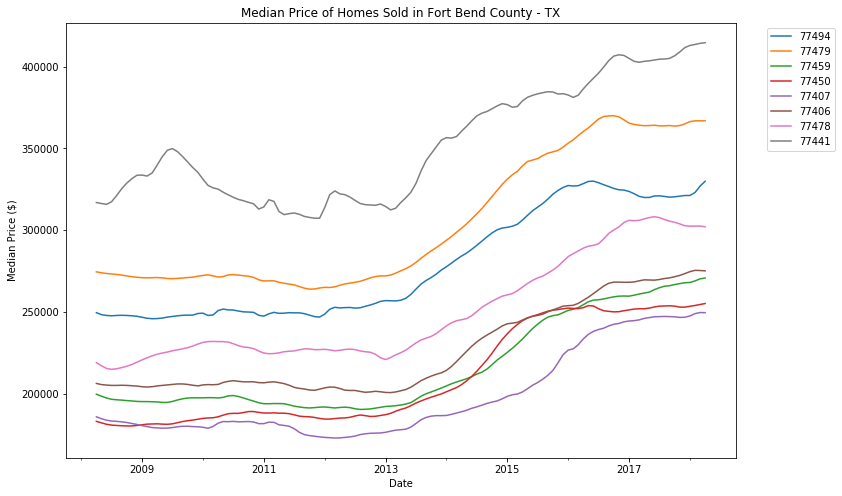

In [32]:
# Plot the general trend of all the zipcodes in Fort Bend County
plt.figure(figsize=(12,8))
for zipcode in df_ts.Zipcode.unique():
    df_ts.loc[df_ts['Zipcode'] == zipcode].value.plot(label=zipcode)
plt.legend(bbox_to_anchor=(1.04,1), loc="upper left", ncol=1)
plt.title("Median Price of Homes Sold in Fort Bend County - TX")
plt.xlabel("Date")
plt.ylabel("Median Price ($)")
plt.show()

In [33]:
# Calculate Metrics 
ts_mean = np.mean(np.round(df_ts["value"], 3))
ts_median = np.median(np.round(df_ts["value"], 3))
ts_std = np.std(np.round(df_ts["value"], 3))
ts_max = np.max(np.round(df_ts["value"], 3))
ts_min = np.min(np.round(df_ts["value"], 3))
print(ts_mean, ts_median, ts_std, ts_max, ts_min)

254399.27685950414 248150.0 59141.86133250933 414700.0 172800.0


> __Zipcodes:__ In Fort Bend County

> Customer preferred zipcodes to carry into time series modeling, based on the following criteria:
- Average Home Values > 235K as of 2017
- Listed in following school districts: Katy ISD, Lamar ISD
- Included 77494, where existing preschool is established to compare other zipcodes against as a baseline

## Check Stationarity Assumptions

#### Visually check for variance and mean assumptions

In [34]:
#Plotting Styling Properties
plt.style.use('seaborn')

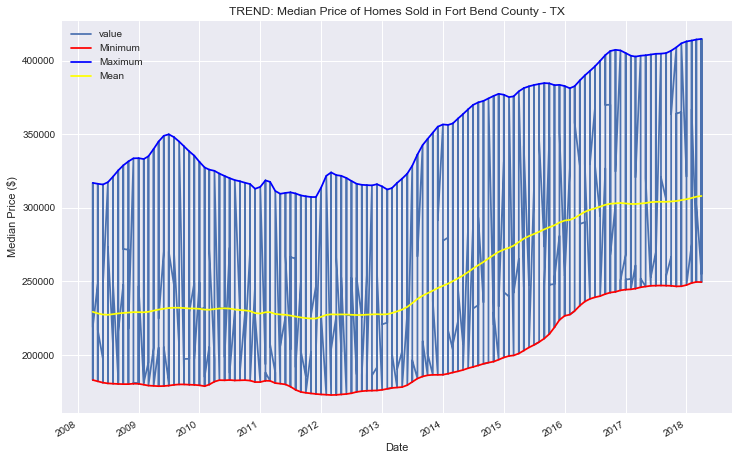

In [35]:
df_ts.value.plot(figsize=(12,8))
minimum = df_ts.groupby('time').aggregate({'value':'min'})
maximum = df_ts.groupby('time').aggregate({'value':'max'})
mean = df_ts.groupby('time').aggregate({'value':'mean'})
plt.plot(minimum, color='red', label='Minimum')
plt.plot(maximum, color='blue', label='Maximum')
plt.plot(mean, color='yellow', label='Mean')
plt.title("TREND: Median Price of Homes Sold in Fort Bend County - TX")
plt.xlabel("Date")
plt.ylabel("Median Price ($)")
plt.legend()
plt.show()

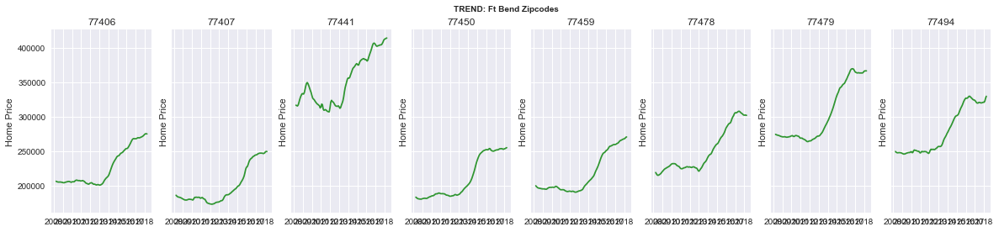

In [36]:
fig, axs = plt.subplots(1,8,figsize=(20,4),sharey=True)
for ax, column, index in zip(axs,zipcodes_list, range(0,8)):
    ax.plot(df_ts[df_ts.Zipcode ==column].value, color='green',alpha=0.8)
    ax.set_title(column)
    ax.set_ylabel('Home Price')
fig.suptitle('TREND: Ft Bend Zipcodes', fontsize=10, fontweight='bold');

### Conduct tests to check for stationarity assumption

#### 77406

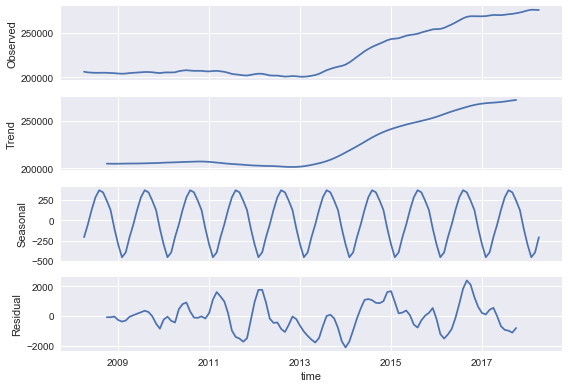

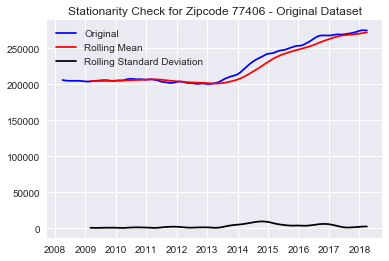

Results of Dickey-Fuller Test
Test Statistic                  -1.033204
p-value                          0.740962
#Lags Used                       8.000000
Number of Observations Used    112.000000
Critical Value (1%)             -3.490131
Critical Value (5%)             -2.887712
Critical Value (10%)            -2.580730
dtype: float64


'Eliminating Trends for 77406 - Original Data'

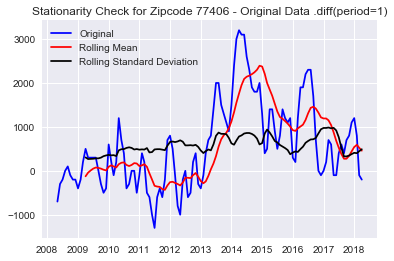

Results of Dickey-Fuller Test
Test Statistic                  -1.631556
p-value                          0.466676
#Lags Used                       7.000000
Number of Observations Used    112.000000
Critical Value (1%)             -3.490131
Critical Value (5%)             -2.887712
Critical Value (10%)            -2.580730
dtype: float64


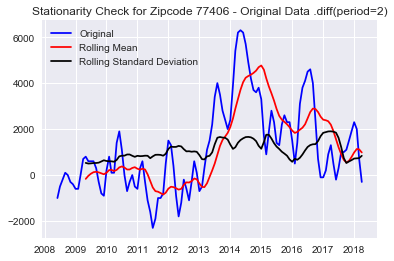

Results of Dickey-Fuller Test
Test Statistic                  -1.606755
p-value                          0.480199
#Lags Used                       6.000000
Number of Observations Used    112.000000
Critical Value (1%)             -3.490131
Critical Value (5%)             -2.887712
Critical Value (10%)            -2.580730
dtype: float64


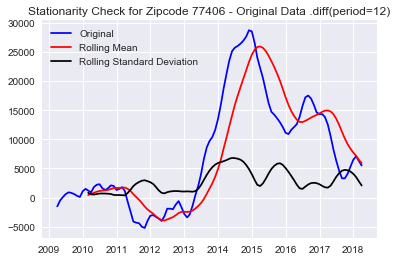

Results of Dickey-Fuller Test
Test Statistic                 -1.212767
p-value                         0.668080
#Lags Used                     13.000000
Number of Observations Used    95.000000
Critical Value (1%)            -3.501137
Critical Value (5%)            -2.892480
Critical Value (10%)           -2.583275
dtype: float64


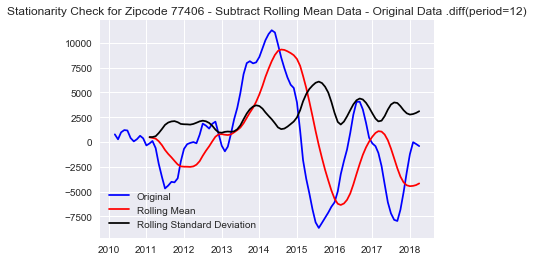

Results of Dickey-Fuller Test
Test Statistic                 -1.507440
p-value                         0.529828
#Lags Used                     11.000000
Number of Observations Used    86.000000
Critical Value (1%)            -3.508783
Critical Value (5%)            -2.895784
Critical Value (10%)           -2.585038
dtype: float64


'Eliminating Trends for 77406 - Log transformed Data'

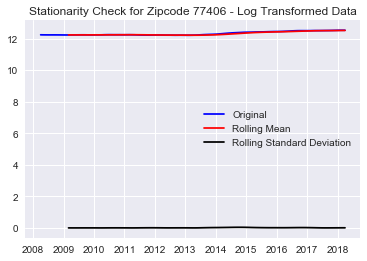

Results of Dickey-Fuller Test
Test Statistic                  -0.576448
p-value                          0.876215
#Lags Used                      10.000000
Number of Observations Used    110.000000
Critical Value (1%)             -3.491245
Critical Value (5%)             -2.888195
Critical Value (10%)            -2.580988
dtype: float64


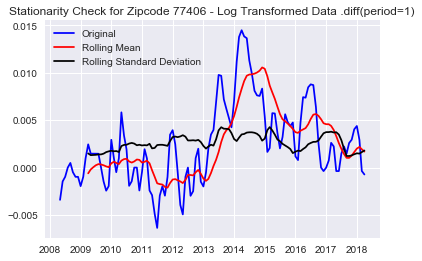

Results of Dickey-Fuller Test
Test Statistic                  -1.873551
p-value                          0.344604
#Lags Used                       9.000000
Number of Observations Used    110.000000
Critical Value (1%)             -3.491245
Critical Value (5%)             -2.888195
Critical Value (10%)            -2.580988
dtype: float64


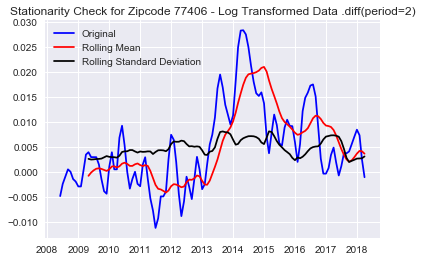

Results of Dickey-Fuller Test
Test Statistic                  -1.589656
p-value                          0.488788
#Lags Used                       6.000000
Number of Observations Used    112.000000
Critical Value (1%)             -3.490131
Critical Value (5%)             -2.887712
Critical Value (10%)            -2.580730
dtype: float64


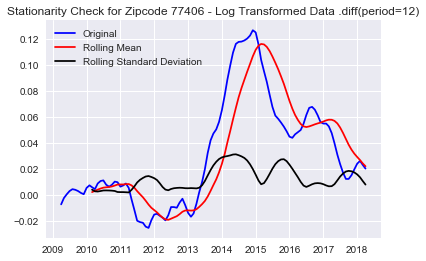

Results of Dickey-Fuller Test
Test Statistic                 -1.279702
p-value                         0.638407
#Lags Used                     13.000000
Number of Observations Used    95.000000
Critical Value (1%)            -3.501137
Critical Value (5%)            -2.892480
Critical Value (10%)           -2.583275
dtype: float64


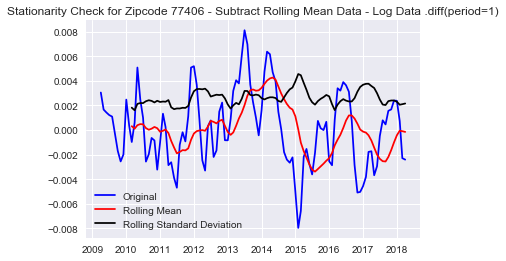

Results of Dickey-Fuller Test
Test Statistic                 -3.031083
p-value                         0.032092
#Lags Used                      9.000000
Number of Observations Used    99.000000
Critical Value (1%)            -3.498198
Critical Value (5%)            -2.891208
Critical Value (10%)           -2.582596
dtype: float64


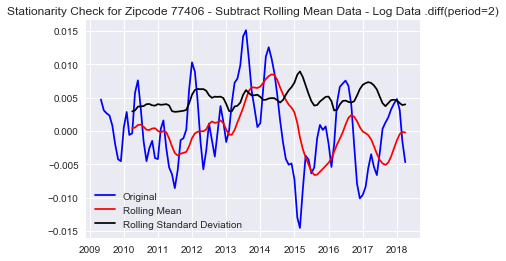

Results of Dickey-Fuller Test
Test Statistic                  -2.553805
p-value                          0.102925
#Lags Used                       7.000000
Number of Observations Used    100.000000
Critical Value (1%)             -3.497501
Critical Value (5%)             -2.890906
Critical Value (10%)            -2.582435
dtype: float64


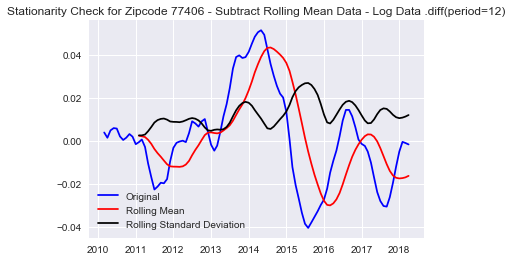

Results of Dickey-Fuller Test
Test Statistic                 -1.585846
p-value                         0.490700
#Lags Used                     11.000000
Number of Observations Used    86.000000
Critical Value (1%)            -3.508783
Critical Value (5%)            -2.895784
Critical Value (10%)           -2.585038
dtype: float64


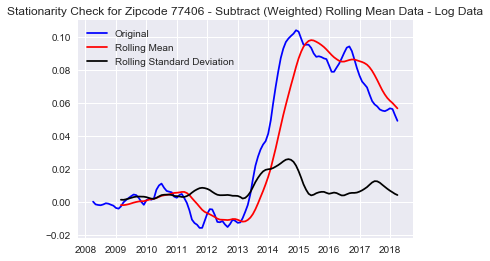

Results of Dickey-Fuller Test
Test Statistic                  -1.621471
p-value                          0.471958
#Lags Used                      10.000000
Number of Observations Used    110.000000
Critical Value (1%)             -3.491245
Critical Value (5%)             -2.888195
Critical Value (10%)            -2.580988
dtype: float64


In [37]:
# Check for seasonality in data
decomposition = seasonal_decompose(ts_77406)
decomposition.plot();
    
# # Assess stationarity of time series
check_stationarity(ts_77406, 77406, "- Original Dataset")

# # Eliminate Trends to find dataset that mets stationary assumptions
eliminate_trends(df = ts_77406, zipcode = 77406)

#### 77407

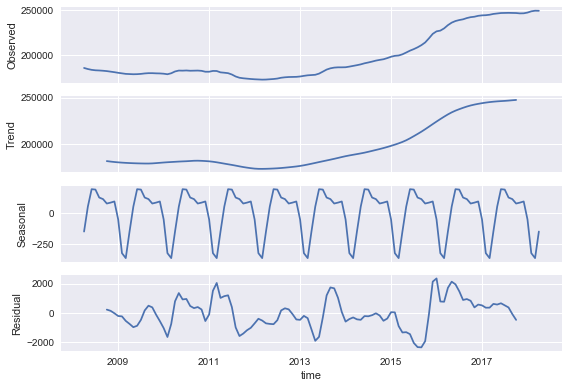

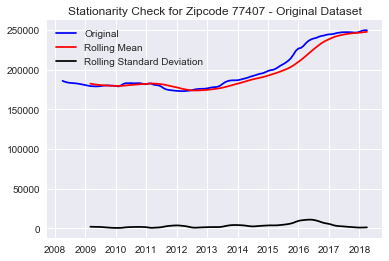

Results of Dickey-Fuller Test
Test Statistic                  -0.660130
p-value                          0.856808
#Lags Used                       8.000000
Number of Observations Used    112.000000
Critical Value (1%)             -3.490131
Critical Value (5%)             -2.887712
Critical Value (10%)            -2.580730
dtype: float64


'Eliminating Trends for 77407 - Original Data'

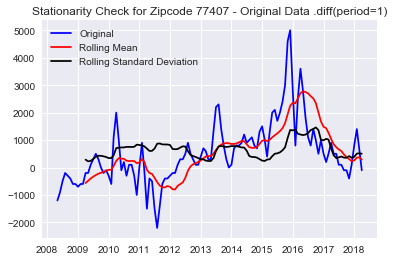

Results of Dickey-Fuller Test
Test Statistic                  -1.925674
p-value                          0.320081
#Lags Used                       7.000000
Number of Observations Used    112.000000
Critical Value (1%)             -3.490131
Critical Value (5%)             -2.887712
Critical Value (10%)            -2.580730
dtype: float64


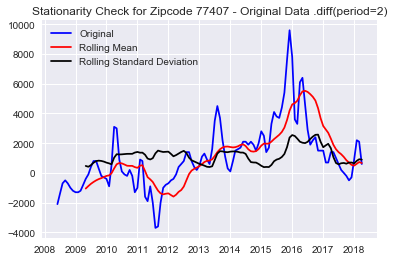

Results of Dickey-Fuller Test
Test Statistic                  -1.888622
p-value                          0.337432
#Lags Used                       6.000000
Number of Observations Used    112.000000
Critical Value (1%)             -3.490131
Critical Value (5%)             -2.887712
Critical Value (10%)            -2.580730
dtype: float64


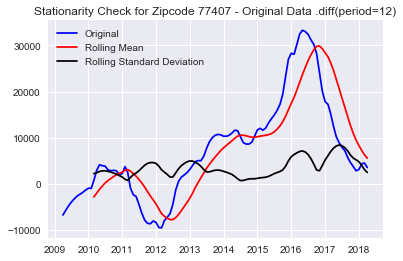

Results of Dickey-Fuller Test
Test Statistic                 -1.285209
p-value                         0.635912
#Lags Used                     11.000000
Number of Observations Used    97.000000
Critical Value (1%)            -3.499637
Critical Value (5%)            -2.891831
Critical Value (10%)           -2.582928
dtype: float64


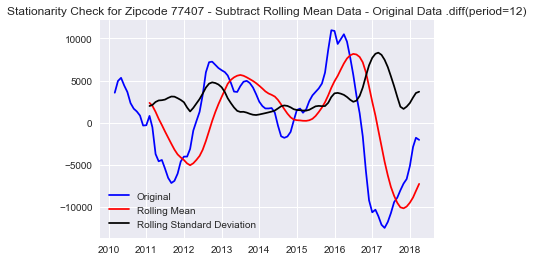

Results of Dickey-Fuller Test
Test Statistic                 -2.834753
p-value                         0.053479
#Lags Used                      8.000000
Number of Observations Used    89.000000
Critical Value (1%)            -3.506057
Critical Value (5%)            -2.894607
Critical Value (10%)           -2.584410
dtype: float64


'Eliminating Trends for 77407 - Log transformed Data'

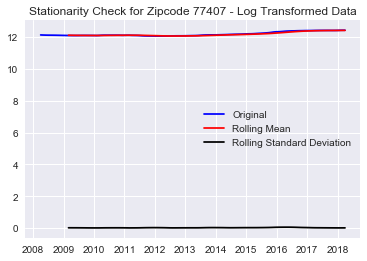

Results of Dickey-Fuller Test
Test Statistic                  -0.711778
p-value                          0.843675
#Lags Used                       8.000000
Number of Observations Used    112.000000
Critical Value (1%)             -3.490131
Critical Value (5%)             -2.887712
Critical Value (10%)            -2.580730
dtype: float64


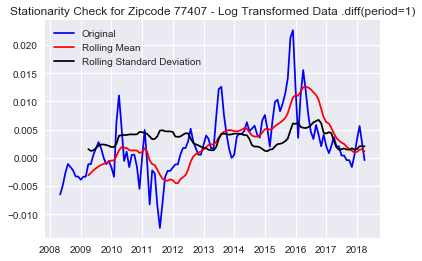

Results of Dickey-Fuller Test
Test Statistic                  -1.958312
p-value                          0.305146
#Lags Used                       7.000000
Number of Observations Used    112.000000
Critical Value (1%)             -3.490131
Critical Value (5%)             -2.887712
Critical Value (10%)            -2.580730
dtype: float64


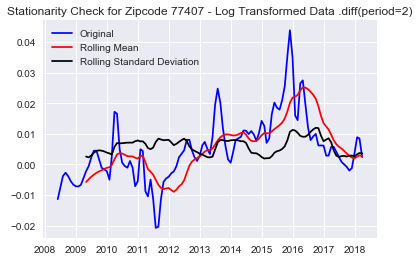

Results of Dickey-Fuller Test
Test Statistic                  -1.927878
p-value                          0.319062
#Lags Used                       6.000000
Number of Observations Used    112.000000
Critical Value (1%)             -3.490131
Critical Value (5%)             -2.887712
Critical Value (10%)            -2.580730
dtype: float64


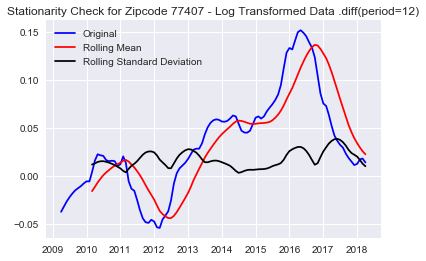

Results of Dickey-Fuller Test
Test Statistic                 -1.271788
p-value                         0.641978
#Lags Used                     11.000000
Number of Observations Used    97.000000
Critical Value (1%)            -3.499637
Critical Value (5%)            -2.891831
Critical Value (10%)           -2.582928
dtype: float64


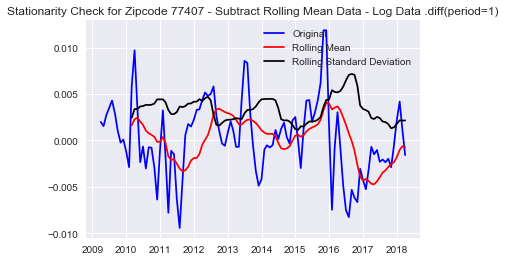

Results of Dickey-Fuller Test
Test Statistic                  -3.586450
p-value                          0.006025
#Lags Used                       6.000000
Number of Observations Used    102.000000
Critical Value (1%)             -3.496149
Critical Value (5%)             -2.890321
Critical Value (10%)            -2.582122
dtype: float64


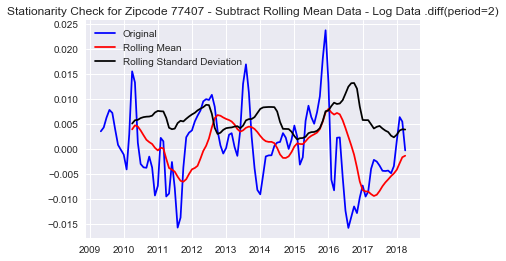

Results of Dickey-Fuller Test
Test Statistic                  -3.112491
p-value                          0.025643
#Lags Used                       7.000000
Number of Observations Used    100.000000
Critical Value (1%)             -3.497501
Critical Value (5%)             -2.890906
Critical Value (10%)            -2.582435
dtype: float64


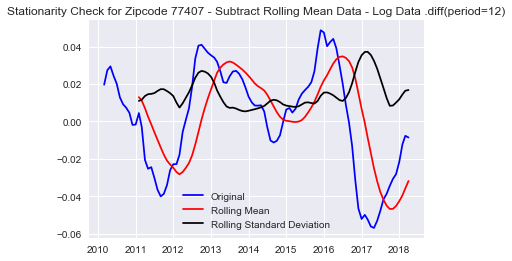

Results of Dickey-Fuller Test
Test Statistic                 -2.944769
p-value                         0.040384
#Lags Used                      8.000000
Number of Observations Used    89.000000
Critical Value (1%)            -3.506057
Critical Value (5%)            -2.894607
Critical Value (10%)           -2.584410
dtype: float64


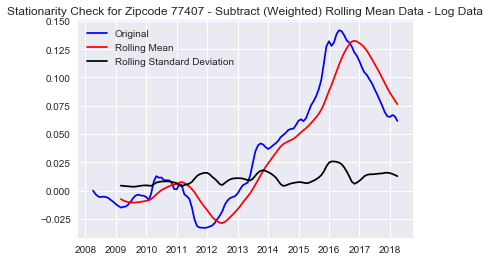

Results of Dickey-Fuller Test
Test Statistic                  -1.676399
p-value                          0.443311
#Lags Used                       8.000000
Number of Observations Used    112.000000
Critical Value (1%)             -3.490131
Critical Value (5%)             -2.887712
Critical Value (10%)            -2.580730
dtype: float64


In [38]:
# Check for seasonality in data
decomposition = seasonal_decompose(ts_77407)
decomposition.plot();
    
# Assess stationarity of time series
check_stationarity(ts_77407, 77407, "- Original Dataset")

# Eliminate Trends to find dataset that mets stationary assumptions
eliminate_trends(df = ts_77407, zipcode = 77407)

#### 77441

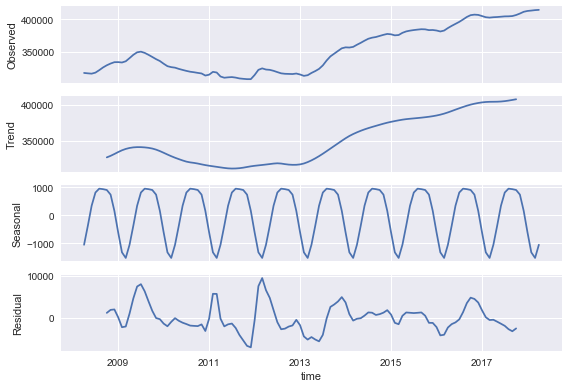

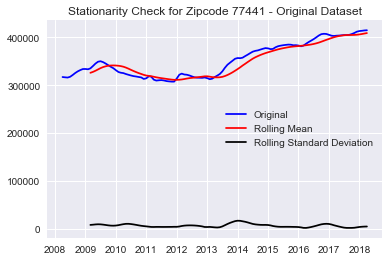

Results of Dickey-Fuller Test
Test Statistic                  -0.295241
p-value                          0.926176
#Lags Used                      10.000000
Number of Observations Used    110.000000
Critical Value (1%)             -3.491245
Critical Value (5%)             -2.888195
Critical Value (10%)            -2.580988
dtype: float64


'Eliminating Trends for 77441 - Original Data'

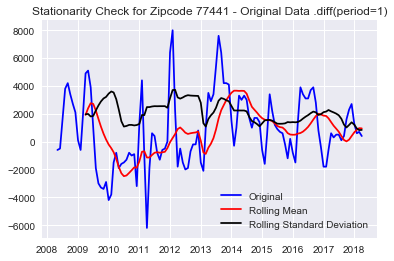

Results of Dickey-Fuller Test
Test Statistic                  -2.376583
p-value                          0.148455
#Lags Used                       9.000000
Number of Observations Used    110.000000
Critical Value (1%)             -3.491245
Critical Value (5%)             -2.888195
Critical Value (10%)            -2.580988
dtype: float64


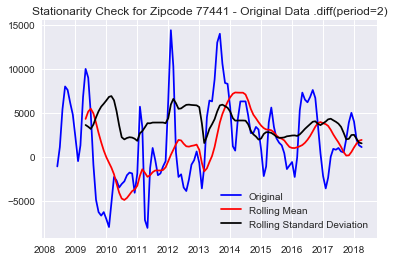

Results of Dickey-Fuller Test
Test Statistic                  -2.695576
p-value                          0.074807
#Lags Used                       9.000000
Number of Observations Used    109.000000
Critical Value (1%)             -3.491818
Critical Value (5%)             -2.888444
Critical Value (10%)            -2.581120
dtype: float64


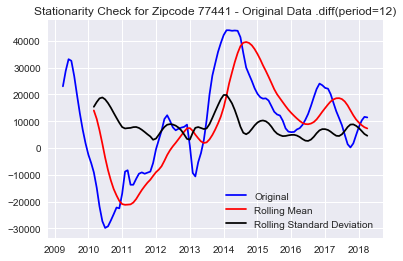

Results of Dickey-Fuller Test
Test Statistic                  -2.369722
p-value                          0.150465
#Lags Used                       4.000000
Number of Observations Used    104.000000
Critical Value (1%)             -3.494850
Critical Value (5%)             -2.889758
Critical Value (10%)            -2.581822
dtype: float64


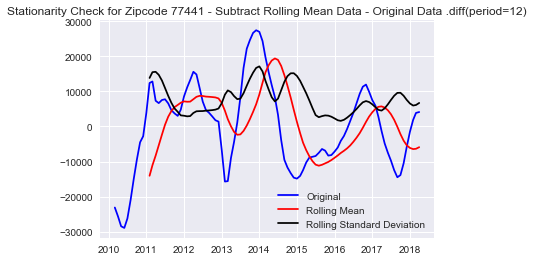

Results of Dickey-Fuller Test
Test Statistic                 -4.030996
p-value                         0.001257
#Lags Used                      4.000000
Number of Observations Used    93.000000
Critical Value (1%)            -3.502705
Critical Value (5%)            -2.893158
Critical Value (10%)           -2.583637
dtype: float64


'Eliminating Trends for 77441 - Log transformed Data'

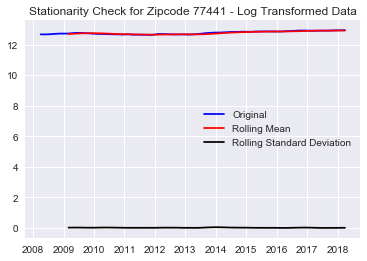

Results of Dickey-Fuller Test
Test Statistic                  -0.406126
p-value                          0.909071
#Lags Used                      10.000000
Number of Observations Used    110.000000
Critical Value (1%)             -3.491245
Critical Value (5%)             -2.888195
Critical Value (10%)            -2.580988
dtype: float64


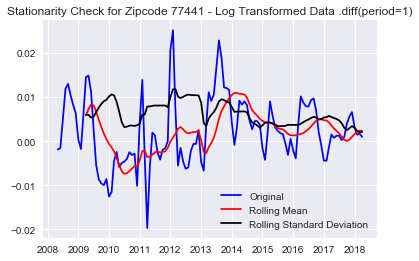

Results of Dickey-Fuller Test
Test Statistic                  -2.414361
p-value                          0.137724
#Lags Used                       9.000000
Number of Observations Used    110.000000
Critical Value (1%)             -3.491245
Critical Value (5%)             -2.888195
Critical Value (10%)            -2.580988
dtype: float64


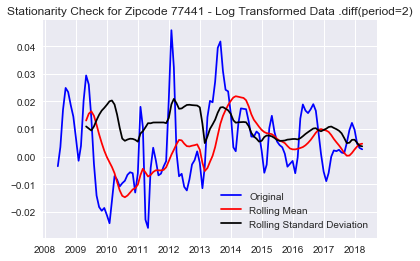

Results of Dickey-Fuller Test
Test Statistic                  -2.760167
p-value                          0.064193
#Lags Used                       9.000000
Number of Observations Used    109.000000
Critical Value (1%)             -3.491818
Critical Value (5%)             -2.888444
Critical Value (10%)            -2.581120
dtype: float64


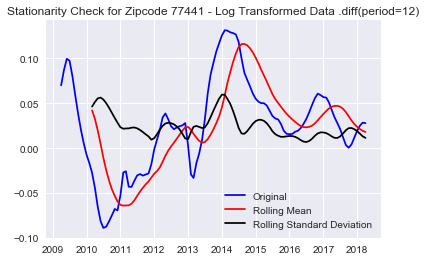

Results of Dickey-Fuller Test
Test Statistic                  -2.415029
p-value                          0.137539
#Lags Used                       4.000000
Number of Observations Used    104.000000
Critical Value (1%)             -3.494850
Critical Value (5%)             -2.889758
Critical Value (10%)            -2.581822
dtype: float64


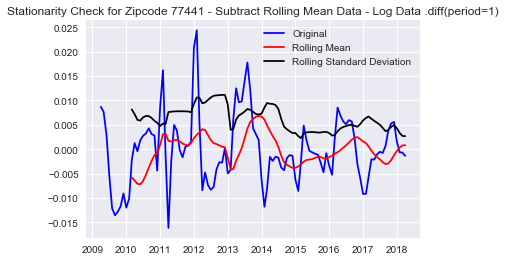

Results of Dickey-Fuller Test
Test Statistic                 -3.941609
p-value                         0.001749
#Lags Used                      9.000000
Number of Observations Used    99.000000
Critical Value (1%)            -3.498198
Critical Value (5%)            -2.891208
Critical Value (10%)           -2.582596
dtype: float64


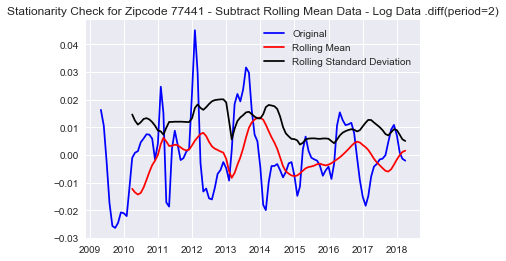

Results of Dickey-Fuller Test
Test Statistic                 -3.874209
p-value                         0.002233
#Lags Used                      8.000000
Number of Observations Used    99.000000
Critical Value (1%)            -3.498198
Critical Value (5%)            -2.891208
Critical Value (10%)           -2.582596
dtype: float64


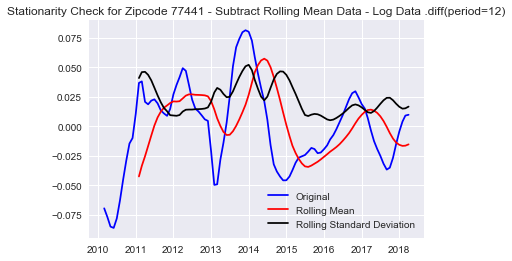

Results of Dickey-Fuller Test
Test Statistic                 -4.034123
p-value                         0.001242
#Lags Used                      4.000000
Number of Observations Used    93.000000
Critical Value (1%)            -3.502705
Critical Value (5%)            -2.893158
Critical Value (10%)           -2.583637
dtype: float64


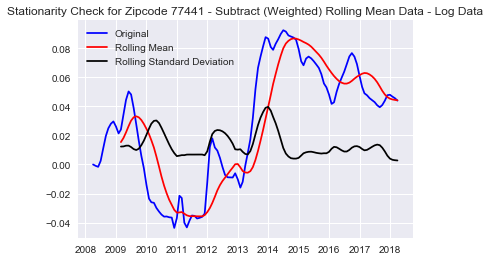

Results of Dickey-Fuller Test
Test Statistic                  -1.615807
p-value                          0.474928
#Lags Used                      10.000000
Number of Observations Used    110.000000
Critical Value (1%)             -3.491245
Critical Value (5%)             -2.888195
Critical Value (10%)            -2.580988
dtype: float64


In [39]:
# Check for seasonality in data
decomposition = seasonal_decompose(ts_77441)
decomposition.plot();
    
# Assess stationarity of time series
check_stationarity(ts_77441, 77441, "- Original Dataset")

# Eliminate Trends to find dataset that mets stationary assumptions
eliminate_trends(df = ts_77441, zipcode = 77441)

#### 77450

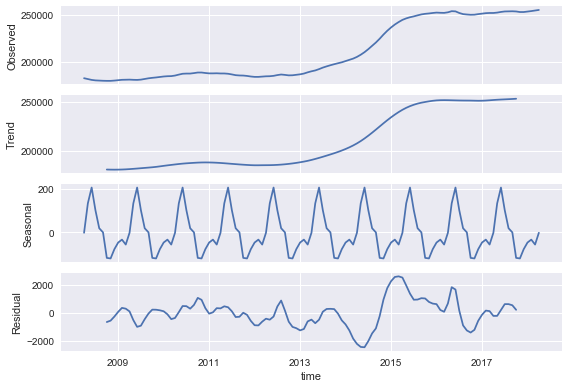

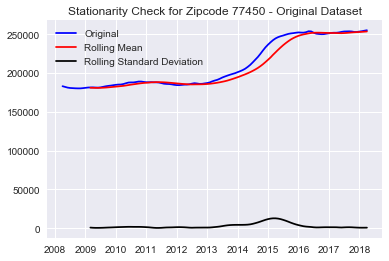

Results of Dickey-Fuller Test
Test Statistic                  -0.758331
p-value                          0.831057
#Lags Used                       4.000000
Number of Observations Used    116.000000
Critical Value (1%)             -3.488022
Critical Value (5%)             -2.886797
Critical Value (10%)            -2.580241
dtype: float64


'Eliminating Trends for 77450 - Original Data'

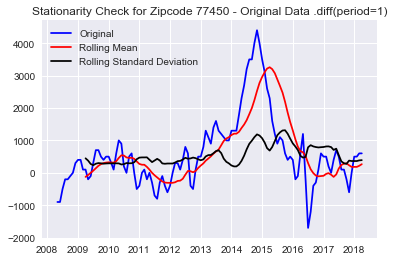

Results of Dickey-Fuller Test
Test Statistic                  -2.296129
p-value                          0.173220
#Lags Used                       3.000000
Number of Observations Used    116.000000
Critical Value (1%)             -3.488022
Critical Value (5%)             -2.886797
Critical Value (10%)            -2.580241
dtype: float64


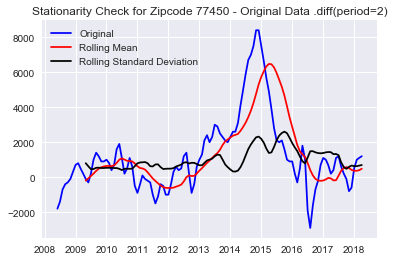

Results of Dickey-Fuller Test
Test Statistic                  -2.367404
p-value                          0.151149
#Lags Used                       7.000000
Number of Observations Used    111.000000
Critical Value (1%)             -3.490683
Critical Value (5%)             -2.887952
Critical Value (10%)            -2.580857
dtype: float64


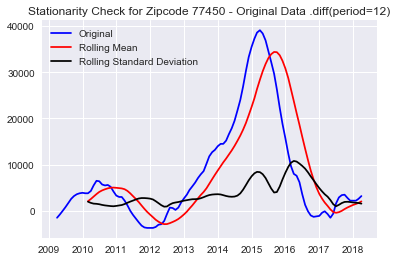

Results of Dickey-Fuller Test
Test Statistic                 -2.296413
p-value                         0.173128
#Lags Used                     13.000000
Number of Observations Used    95.000000
Critical Value (1%)            -3.501137
Critical Value (5%)            -2.892480
Critical Value (10%)           -2.583275
dtype: float64


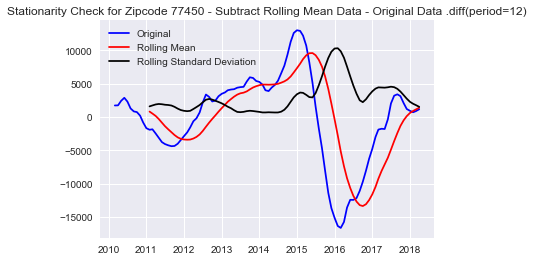

Results of Dickey-Fuller Test
Test Statistic                 -2.843426
p-value                         0.052333
#Lags Used                      4.000000
Number of Observations Used    93.000000
Critical Value (1%)            -3.502705
Critical Value (5%)            -2.893158
Critical Value (10%)           -2.583637
dtype: float64


'Eliminating Trends for 77450 - Log transformed Data'

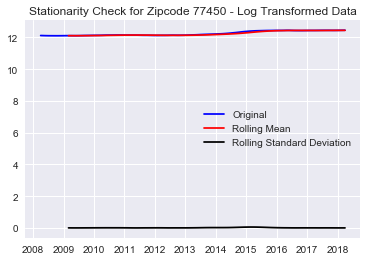

Results of Dickey-Fuller Test
Test Statistic                  -0.860013
p-value                          0.800856
#Lags Used                       4.000000
Number of Observations Used    116.000000
Critical Value (1%)             -3.488022
Critical Value (5%)             -2.886797
Critical Value (10%)            -2.580241
dtype: float64


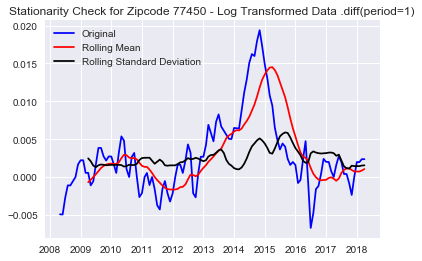

Results of Dickey-Fuller Test
Test Statistic                  -2.271578
p-value                          0.181298
#Lags Used                       3.000000
Number of Observations Used    116.000000
Critical Value (1%)             -3.488022
Critical Value (5%)             -2.886797
Critical Value (10%)            -2.580241
dtype: float64


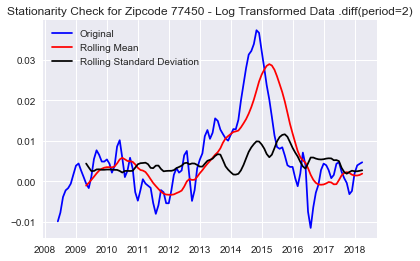

Results of Dickey-Fuller Test
Test Statistic                  -2.222187
p-value                          0.198292
#Lags Used                       7.000000
Number of Observations Used    111.000000
Critical Value (1%)             -3.490683
Critical Value (5%)             -2.887952
Critical Value (10%)            -2.580857
dtype: float64


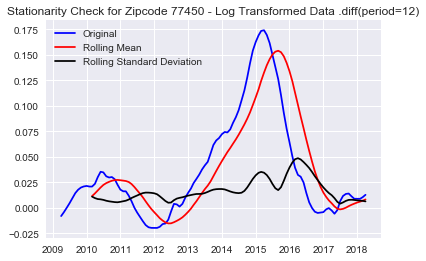

Results of Dickey-Fuller Test
Test Statistic                  -2.404291
p-value                          0.140529
#Lags Used                       4.000000
Number of Observations Used    104.000000
Critical Value (1%)             -3.494850
Critical Value (5%)             -2.889758
Critical Value (10%)            -2.581822
dtype: float64


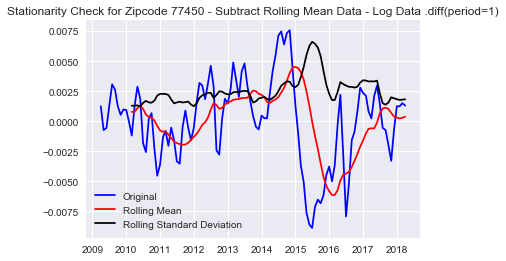

Results of Dickey-Fuller Test
Test Statistic                  -3.298034
p-value                          0.014967
#Lags Used                       3.000000
Number of Observations Used    105.000000
Critical Value (1%)             -3.494220
Critical Value (5%)             -2.889485
Critical Value (10%)            -2.581676
dtype: float64


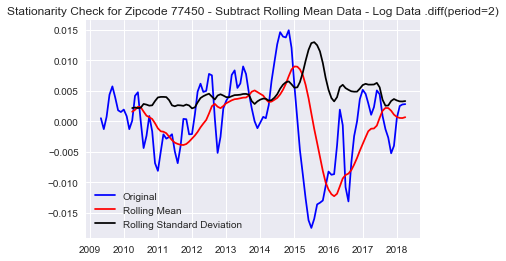

Results of Dickey-Fuller Test
Test Statistic                  -3.184801
p-value                          0.020881
#Lags Used                       7.000000
Number of Observations Used    100.000000
Critical Value (1%)             -3.497501
Critical Value (5%)             -2.890906
Critical Value (10%)            -2.582435
dtype: float64


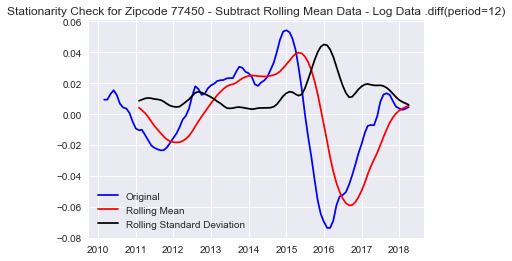

Results of Dickey-Fuller Test
Test Statistic                 -2.799696
p-value                         0.058317
#Lags Used                      4.000000
Number of Observations Used    93.000000
Critical Value (1%)            -3.502705
Critical Value (5%)            -2.893158
Critical Value (10%)           -2.583637
dtype: float64


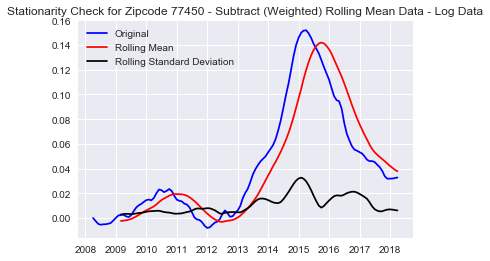

Results of Dickey-Fuller Test
Test Statistic                  -2.100999
p-value                          0.244113
#Lags Used                       4.000000
Number of Observations Used    116.000000
Critical Value (1%)             -3.488022
Critical Value (5%)             -2.886797
Critical Value (10%)            -2.580241
dtype: float64


In [40]:
# Check for seasonality in data
decomposition = seasonal_decompose(ts_77450)
decomposition.plot();
    
# Assess stationarity of time series
check_stationarity(ts_77450, 77450, "- Original Dataset")

# Eliminate Trends to find dataset that mets stationary assumptions
eliminate_trends(df = ts_77450, zipcode = 77450)

#### 77459

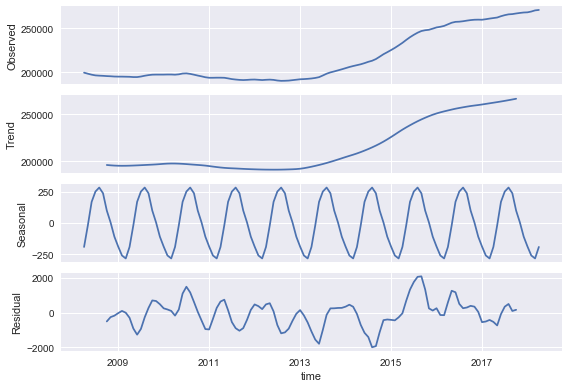

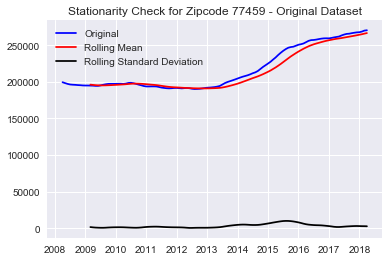

Results of Dickey-Fuller Test
Test Statistic                  -1.063819
p-value                          0.729283
#Lags Used                      13.000000
Number of Observations Used    107.000000
Critical Value (1%)             -3.492996
Critical Value (5%)             -2.888955
Critical Value (10%)            -2.581393
dtype: float64


'Eliminating Trends for 77459 - Original Data'

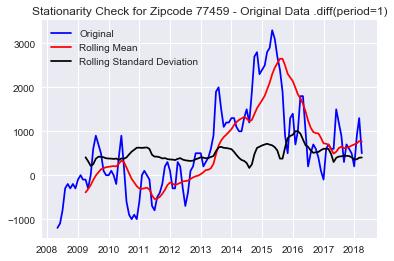

Results of Dickey-Fuller Test
Test Statistic                  -1.595159
p-value                          0.486025
#Lags Used                      13.000000
Number of Observations Used    106.000000
Critical Value (1%)             -3.493602
Critical Value (5%)             -2.889217
Critical Value (10%)            -2.581533
dtype: float64


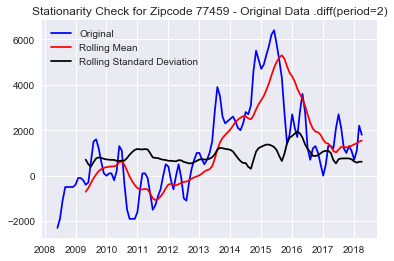

Results of Dickey-Fuller Test
Test Statistic                  -1.684902
p-value                          0.438908
#Lags Used                      11.000000
Number of Observations Used    107.000000
Critical Value (1%)             -3.492996
Critical Value (5%)             -2.888955
Critical Value (10%)            -2.581393
dtype: float64


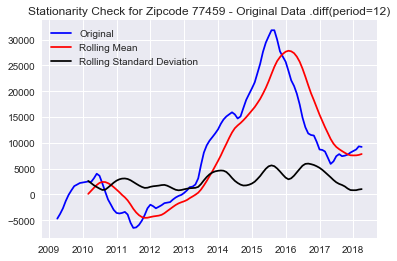

Results of Dickey-Fuller Test
Test Statistic                 -1.520697
p-value                         0.523249
#Lags Used                     13.000000
Number of Observations Used    95.000000
Critical Value (1%)            -3.501137
Critical Value (5%)            -2.892480
Critical Value (10%)           -2.583275
dtype: float64


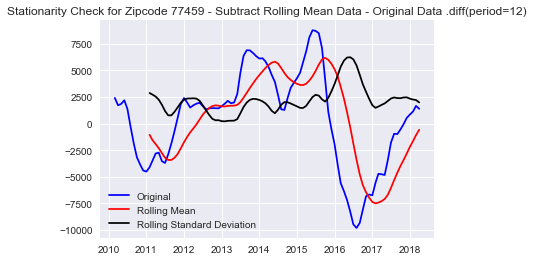

Results of Dickey-Fuller Test
Test Statistic                 -1.026421
p-value                         0.743506
#Lags Used                     11.000000
Number of Observations Used    86.000000
Critical Value (1%)            -3.508783
Critical Value (5%)            -2.895784
Critical Value (10%)           -2.585038
dtype: float64


'Eliminating Trends for 77459 - Log transformed Data'

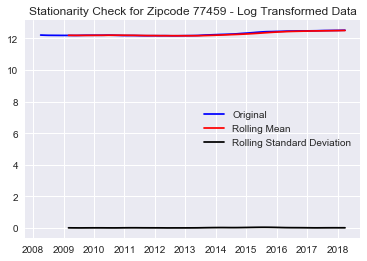

Results of Dickey-Fuller Test
Test Statistic                  -1.070665
p-value                          0.726627
#Lags Used                      13.000000
Number of Observations Used    107.000000
Critical Value (1%)             -3.492996
Critical Value (5%)             -2.888955
Critical Value (10%)            -2.581393
dtype: float64


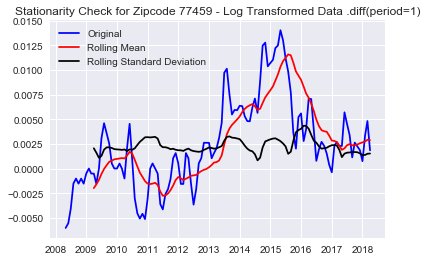

Results of Dickey-Fuller Test
Test Statistic                  -1.614753
p-value                          0.475481
#Lags Used                      13.000000
Number of Observations Used    106.000000
Critical Value (1%)             -3.493602
Critical Value (5%)             -2.889217
Critical Value (10%)            -2.581533
dtype: float64


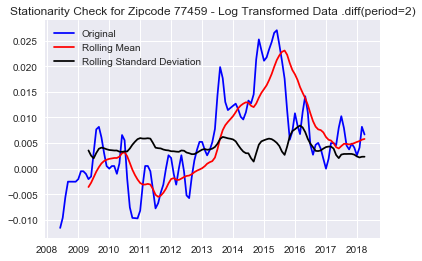

Results of Dickey-Fuller Test
Test Statistic                  -1.726258
p-value                          0.417637
#Lags Used                      11.000000
Number of Observations Used    107.000000
Critical Value (1%)             -3.492996
Critical Value (5%)             -2.888955
Critical Value (10%)            -2.581393
dtype: float64


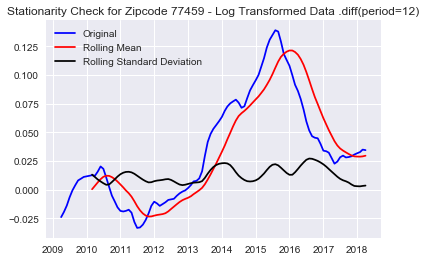

Results of Dickey-Fuller Test
Test Statistic                 -1.550132
p-value                         0.508582
#Lags Used                     13.000000
Number of Observations Used    95.000000
Critical Value (1%)            -3.501137
Critical Value (5%)            -2.892480
Critical Value (10%)           -2.583275
dtype: float64


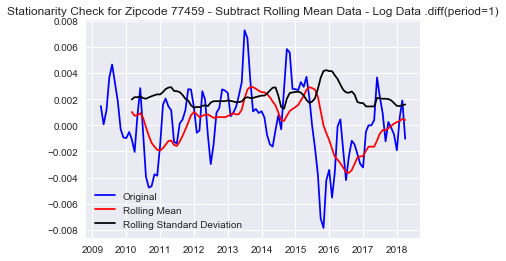

Results of Dickey-Fuller Test
Test Statistic                 -1.943784
p-value                         0.311752
#Lags Used                     12.000000
Number of Observations Used    96.000000
Critical Value (1%)            -3.500379
Critical Value (5%)            -2.892152
Critical Value (10%)           -2.583100
dtype: float64


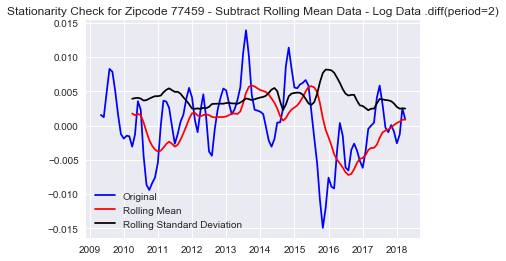

Results of Dickey-Fuller Test
Test Statistic                 -2.029488
p-value                         0.273795
#Lags Used                     11.000000
Number of Observations Used    96.000000
Critical Value (1%)            -3.500379
Critical Value (5%)            -2.892152
Critical Value (10%)           -2.583100
dtype: float64


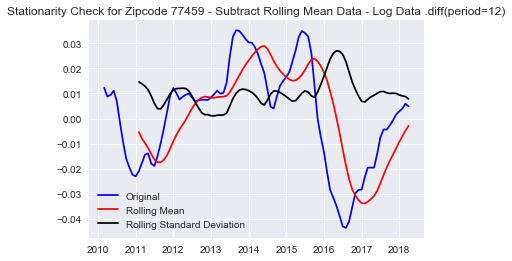

Results of Dickey-Fuller Test
Test Statistic                 -3.143758
p-value                         0.023480
#Lags Used                      3.000000
Number of Observations Used    94.000000
Critical Value (1%)            -3.501912
Critical Value (5%)            -2.892815
Critical Value (10%)           -2.583454
dtype: float64


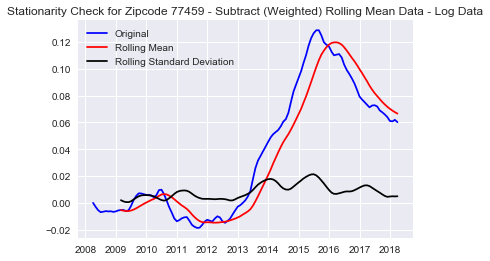

Results of Dickey-Fuller Test
Test Statistic                  -1.928869
p-value                          0.318605
#Lags Used                      13.000000
Number of Observations Used    107.000000
Critical Value (1%)             -3.492996
Critical Value (5%)             -2.888955
Critical Value (10%)            -2.581393
dtype: float64


In [41]:
# Check for seasonality in data
decomposition = seasonal_decompose(ts_77459)
decomposition.plot();
    
# Assess stationarity of time series
check_stationarity(ts_77459, 77459, "- Original Dataset")

# Eliminate Trends to find dataset that mets stationary assumptions
eliminate_trends(df = ts_77459, zipcode = 77459)

#### 77478

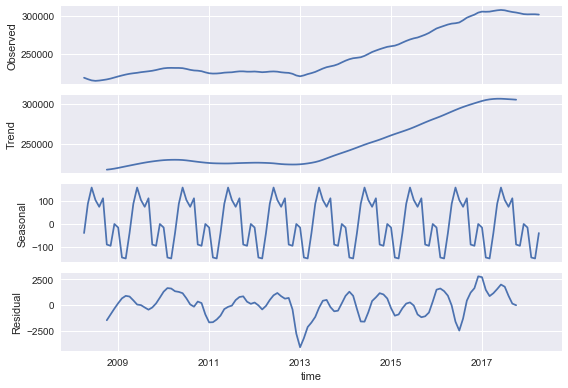

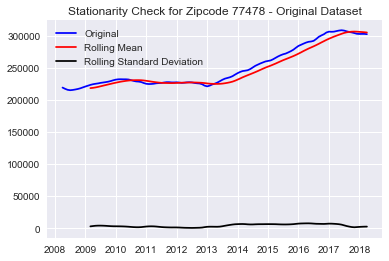

Results of Dickey-Fuller Test
Test Statistic                  -0.782343
p-value                          0.824254
#Lags Used                       9.000000
Number of Observations Used    111.000000
Critical Value (1%)             -3.490683
Critical Value (5%)             -2.887952
Critical Value (10%)            -2.580857
dtype: float64


'Eliminating Trends for 77478 - Original Data'

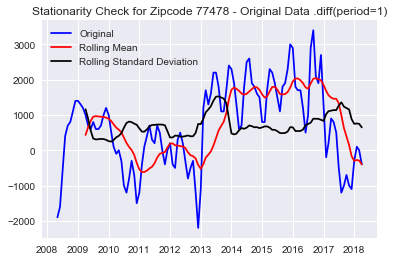

Results of Dickey-Fuller Test
Test Statistic                  -1.738341
p-value                          0.411474
#Lags Used                       8.000000
Number of Observations Used    111.000000
Critical Value (1%)             -3.490683
Critical Value (5%)             -2.887952
Critical Value (10%)            -2.580857
dtype: float64


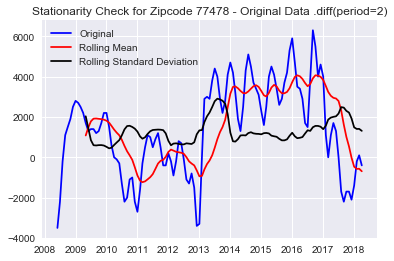

Results of Dickey-Fuller Test
Test Statistic                  -1.858639
p-value                          0.351762
#Lags Used                       7.000000
Number of Observations Used    111.000000
Critical Value (1%)             -3.490683
Critical Value (5%)             -2.887952
Critical Value (10%)            -2.580857
dtype: float64


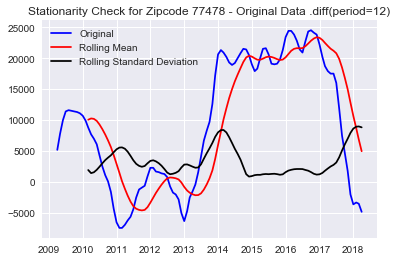

Results of Dickey-Fuller Test
Test Statistic                 -1.306751
p-value                         0.626078
#Lags Used                     13.000000
Number of Observations Used    95.000000
Critical Value (1%)            -3.501137
Critical Value (5%)            -2.892480
Critical Value (10%)           -2.583275
dtype: float64


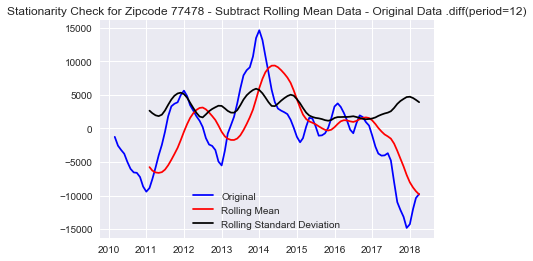

Results of Dickey-Fuller Test
Test Statistic                 -0.843061
p-value                         0.806145
#Lags Used                     11.000000
Number of Observations Used    86.000000
Critical Value (1%)            -3.508783
Critical Value (5%)            -2.895784
Critical Value (10%)           -2.585038
dtype: float64


'Eliminating Trends for 77478 - Log transformed Data'

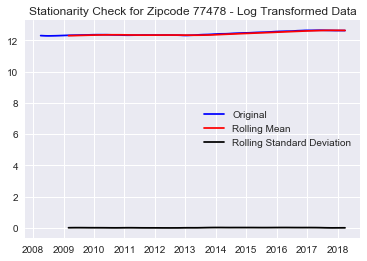

Results of Dickey-Fuller Test
Test Statistic                  -0.336107
p-value                          0.920233
#Lags Used                       4.000000
Number of Observations Used    116.000000
Critical Value (1%)             -3.488022
Critical Value (5%)             -2.886797
Critical Value (10%)            -2.580241
dtype: float64


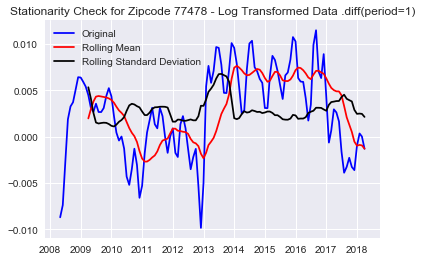

Results of Dickey-Fuller Test
Test Statistic                  -3.045321
p-value                          0.030873
#Lags Used                       3.000000
Number of Observations Used    116.000000
Critical Value (1%)             -3.488022
Critical Value (5%)             -2.886797
Critical Value (10%)            -2.580241
dtype: float64


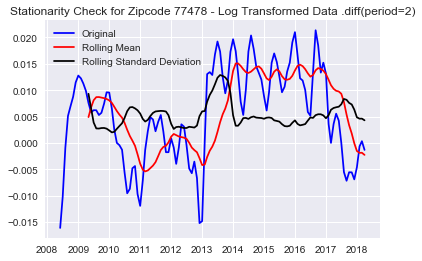

Results of Dickey-Fuller Test
Test Statistic                  -1.961058
p-value                          0.303904
#Lags Used                       7.000000
Number of Observations Used    111.000000
Critical Value (1%)             -3.490683
Critical Value (5%)             -2.887952
Critical Value (10%)            -2.580857
dtype: float64


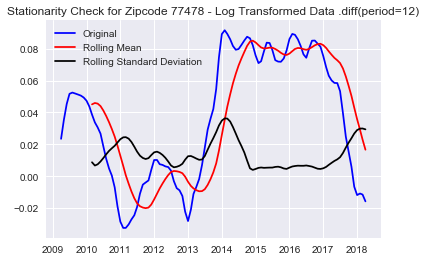

Results of Dickey-Fuller Test
Test Statistic                 -1.290665
p-value                         0.633432
#Lags Used                     13.000000
Number of Observations Used    95.000000
Critical Value (1%)            -3.501137
Critical Value (5%)            -2.892480
Critical Value (10%)           -2.583275
dtype: float64


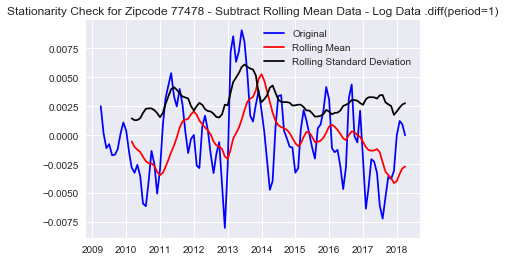

Results of Dickey-Fuller Test
Test Statistic                  -4.176026
p-value                          0.000723
#Lags Used                       3.000000
Number of Observations Used    105.000000
Critical Value (1%)             -3.494220
Critical Value (5%)             -2.889485
Critical Value (10%)            -2.581676
dtype: float64


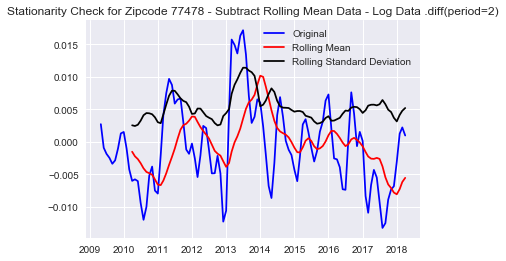

Results of Dickey-Fuller Test
Test Statistic                  -3.272734
p-value                          0.016142
#Lags Used                       7.000000
Number of Observations Used    100.000000
Critical Value (1%)             -3.497501
Critical Value (5%)             -2.890906
Critical Value (10%)            -2.582435
dtype: float64


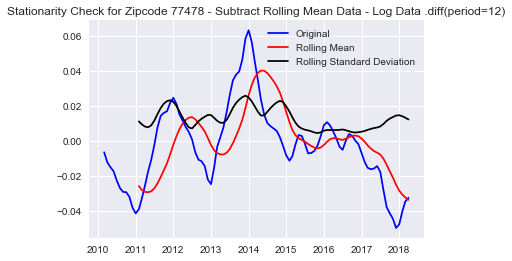

Results of Dickey-Fuller Test
Test Statistic                 -1.056441
p-value                         0.732127
#Lags Used                     11.000000
Number of Observations Used    86.000000
Critical Value (1%)            -3.508783
Critical Value (5%)            -2.895784
Critical Value (10%)           -2.585038
dtype: float64


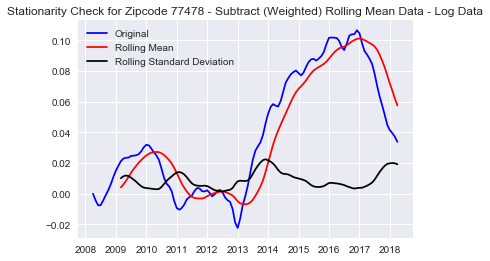

Results of Dickey-Fuller Test
Test Statistic                  -1.468243
p-value                          0.549159
#Lags Used                       4.000000
Number of Observations Used    116.000000
Critical Value (1%)             -3.488022
Critical Value (5%)             -2.886797
Critical Value (10%)            -2.580241
dtype: float64


In [42]:
# Check for seasonality in data
decomposition = seasonal_decompose(ts_77478)
decomposition.plot();
    
# Assess stationarity of time series
check_stationarity(ts_77478, 77478, "- Original Dataset")

# Eliminate Trends to find dataset that mets stationary assumptions
eliminate_trends(df = ts_77478, zipcode = 77478)

#### 77479

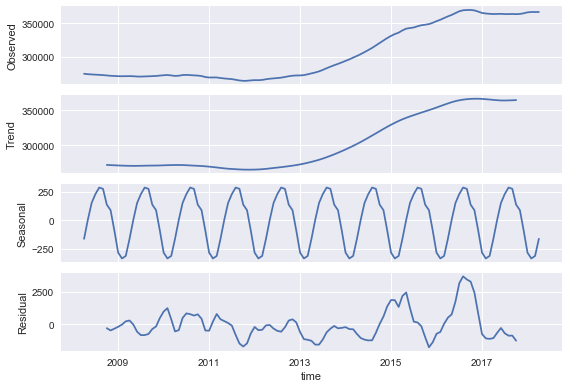

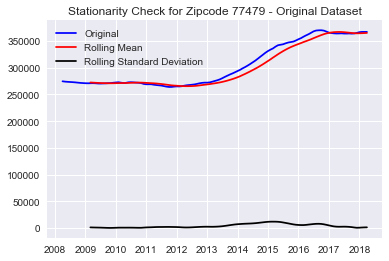

Results of Dickey-Fuller Test
Test Statistic                  -2.234658
p-value                          0.193908
#Lags Used                      13.000000
Number of Observations Used    107.000000
Critical Value (1%)             -3.492996
Critical Value (5%)             -2.888955
Critical Value (10%)            -2.581393
dtype: float64


'Eliminating Trends for 77479 - Original Data'

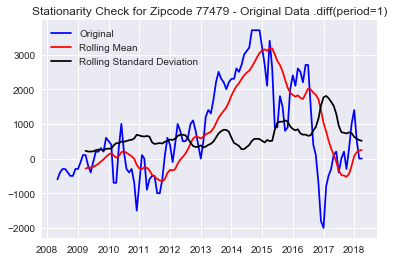

Results of Dickey-Fuller Test
Test Statistic                  -1.296136
p-value                          0.630938
#Lags Used                      13.000000
Number of Observations Used    106.000000
Critical Value (1%)             -3.493602
Critical Value (5%)             -2.889217
Critical Value (10%)            -2.581533
dtype: float64


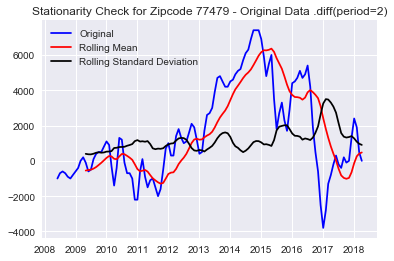

Results of Dickey-Fuller Test
Test Statistic                  -1.217095
p-value                          0.666199
#Lags Used                      11.000000
Number of Observations Used    107.000000
Critical Value (1%)             -3.492996
Critical Value (5%)             -2.888955
Critical Value (10%)            -2.581393
dtype: float64


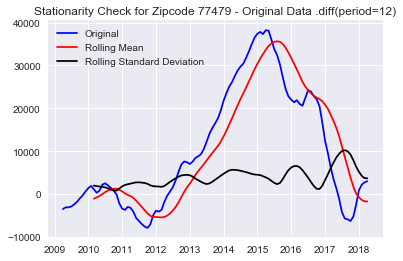

Results of Dickey-Fuller Test
Test Statistic                 -2.372876
p-value                         0.149539
#Lags Used                     13.000000
Number of Observations Used    95.000000
Critical Value (1%)            -3.501137
Critical Value (5%)            -2.892480
Critical Value (10%)           -2.583275
dtype: float64


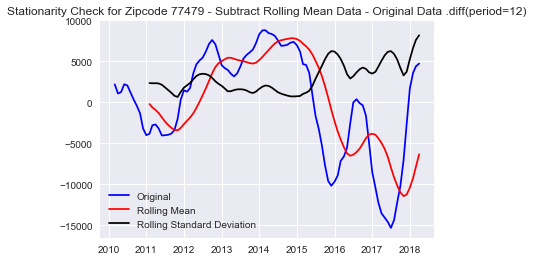

Results of Dickey-Fuller Test
Test Statistic                 -1.792701
p-value                         0.384092
#Lags Used                      5.000000
Number of Observations Used    92.000000
Critical Value (1%)            -3.503515
Critical Value (5%)            -2.893508
Critical Value (10%)           -2.583824
dtype: float64


'Eliminating Trends for 77479 - Log transformed Data'

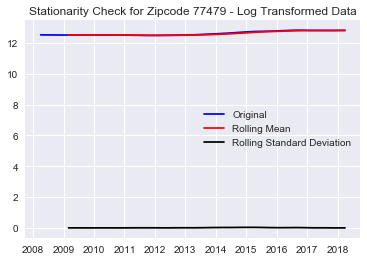

Results of Dickey-Fuller Test
Test Statistic                  -2.034003
p-value                          0.271866
#Lags Used                      13.000000
Number of Observations Used    107.000000
Critical Value (1%)             -3.492996
Critical Value (5%)             -2.888955
Critical Value (10%)            -2.581393
dtype: float64


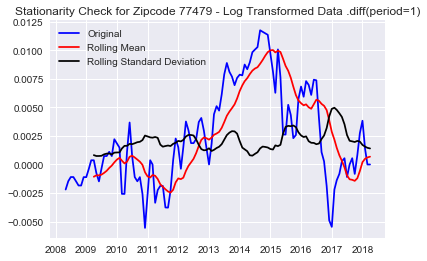

Results of Dickey-Fuller Test
Test Statistic                  -1.220973
p-value                          0.664509
#Lags Used                      12.000000
Number of Observations Used    107.000000
Critical Value (1%)             -3.492996
Critical Value (5%)             -2.888955
Critical Value (10%)            -2.581393
dtype: float64


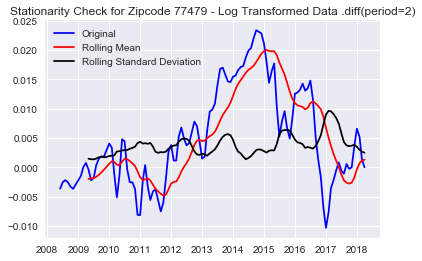

Results of Dickey-Fuller Test
Test Statistic                  -1.289188
p-value                          0.634104
#Lags Used                      11.000000
Number of Observations Used    107.000000
Critical Value (1%)             -3.492996
Critical Value (5%)             -2.888955
Critical Value (10%)            -2.581393
dtype: float64


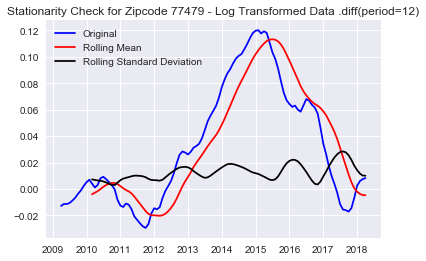

Results of Dickey-Fuller Test
Test Statistic                 -2.231163
p-value                         0.195130
#Lags Used                     13.000000
Number of Observations Used    95.000000
Critical Value (1%)            -3.501137
Critical Value (5%)            -2.892480
Critical Value (10%)           -2.583275
dtype: float64


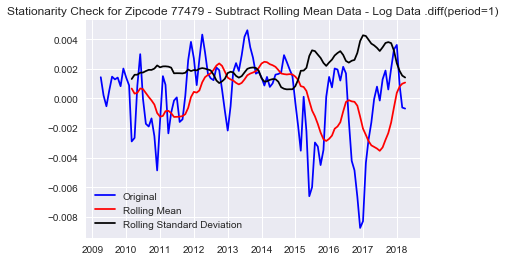

Results of Dickey-Fuller Test
Test Statistic                 -1.577366
p-value                         0.494952
#Lags Used                     12.000000
Number of Observations Used    96.000000
Critical Value (1%)            -3.500379
Critical Value (5%)            -2.892152
Critical Value (10%)           -2.583100
dtype: float64


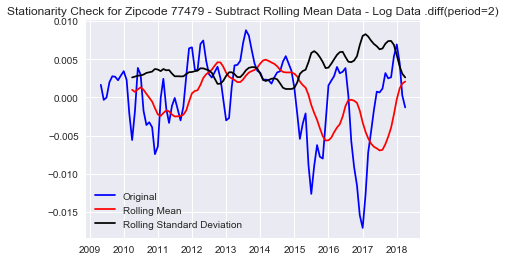

Results of Dickey-Fuller Test
Test Statistic                 -1.722765
p-value                         0.419423
#Lags Used                     11.000000
Number of Observations Used    96.000000
Critical Value (1%)            -3.500379
Critical Value (5%)            -2.892152
Critical Value (10%)           -2.583100
dtype: float64


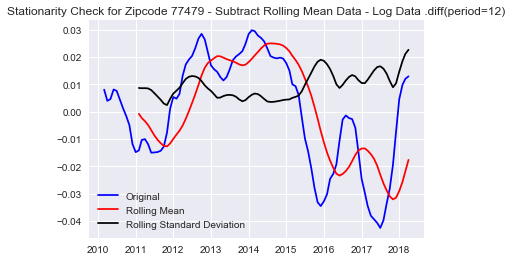

Results of Dickey-Fuller Test
Test Statistic                 -1.870351
p-value                         0.346135
#Lags Used                      5.000000
Number of Observations Used    92.000000
Critical Value (1%)            -3.503515
Critical Value (5%)            -2.893508
Critical Value (10%)           -2.583824
dtype: float64


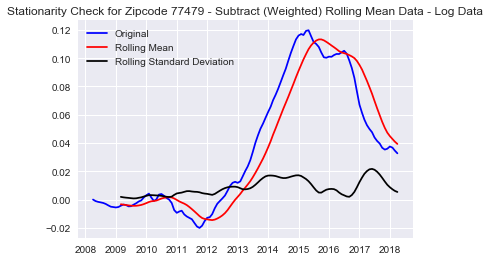

Results of Dickey-Fuller Test
Test Statistic                  -2.458635
p-value                          0.125866
#Lags Used                      13.000000
Number of Observations Used    107.000000
Critical Value (1%)             -3.492996
Critical Value (5%)             -2.888955
Critical Value (10%)            -2.581393
dtype: float64


In [43]:
# Check for seasonality in data
decomposition = seasonal_decompose(ts_77479)
decomposition.plot();
    
# Assess stationarity of time series for each zipcode
check_stationarity(ts_77479, 77479, "- Original Dataset")

# Eliminate Trends to find dataset that mets stationary assumptions
eliminate_trends(df=ts_77479, zipcode = 77479)

#### 77494

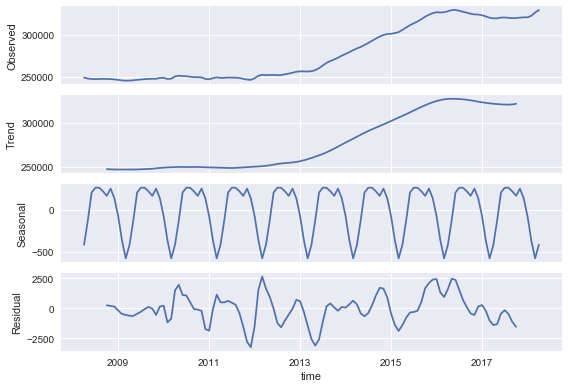

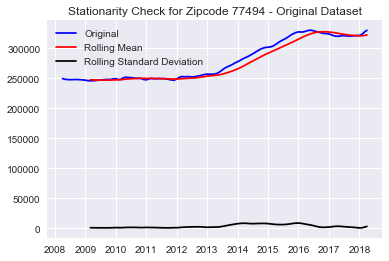

Results of Dickey-Fuller Test
Test Statistic                  -0.492764
p-value                          0.893421
#Lags Used                       8.000000
Number of Observations Used    112.000000
Critical Value (1%)             -3.490131
Critical Value (5%)             -2.887712
Critical Value (10%)            -2.580730
dtype: float64


'Eliminating Trends for 77494 - Original Data'

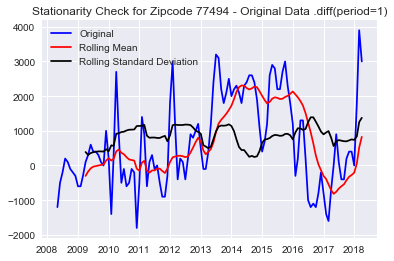

Results of Dickey-Fuller Test
Test Statistic                  -1.811735
p-value                          0.374652
#Lags Used                       7.000000
Number of Observations Used    112.000000
Critical Value (1%)             -3.490131
Critical Value (5%)             -2.887712
Critical Value (10%)            -2.580730
dtype: float64


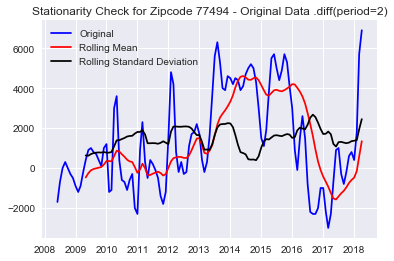

Results of Dickey-Fuller Test
Test Statistic                  -1.964128
p-value                          0.302520
#Lags Used                       7.000000
Number of Observations Used    111.000000
Critical Value (1%)             -3.490683
Critical Value (5%)             -2.887952
Critical Value (10%)            -2.580857
dtype: float64


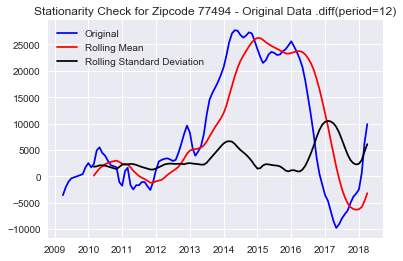

Results of Dickey-Fuller Test
Test Statistic                 -1.654249
p-value                         0.454825
#Lags Used                     13.000000
Number of Observations Used    95.000000
Critical Value (1%)            -3.501137
Critical Value (5%)            -2.892480
Critical Value (10%)           -2.583275
dtype: float64


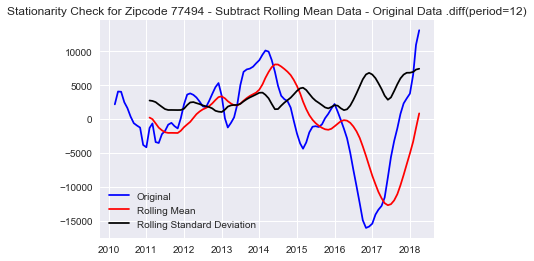

Results of Dickey-Fuller Test
Test Statistic                 -3.251686
p-value                         0.017181
#Lags Used                      6.000000
Number of Observations Used    91.000000
Critical Value (1%)            -3.504343
Critical Value (5%)            -2.893866
Critical Value (10%)           -2.584015
dtype: float64


'Eliminating Trends for 77494 - Log transformed Data'

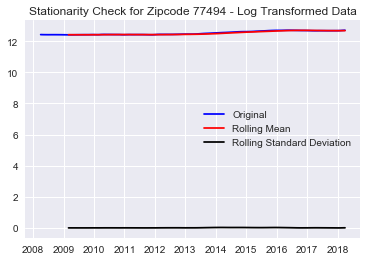

Results of Dickey-Fuller Test
Test Statistic                  -0.630804
p-value                          0.863869
#Lags Used                       8.000000
Number of Observations Used    112.000000
Critical Value (1%)             -3.490131
Critical Value (5%)             -2.887712
Critical Value (10%)            -2.580730
dtype: float64


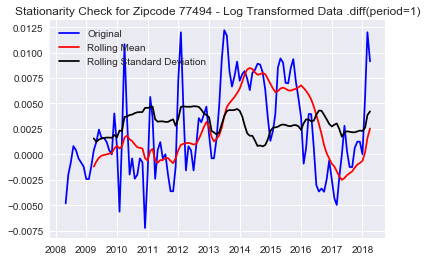

Results of Dickey-Fuller Test
Test Statistic                  -1.820767
p-value                          0.370202
#Lags Used                       7.000000
Number of Observations Used    112.000000
Critical Value (1%)             -3.490131
Critical Value (5%)             -2.887712
Critical Value (10%)            -2.580730
dtype: float64


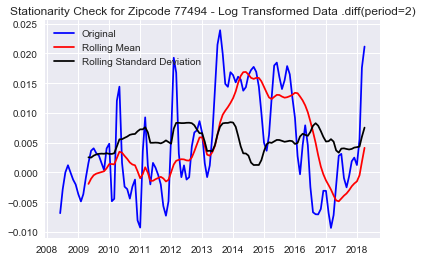

Results of Dickey-Fuller Test
Test Statistic                  -1.780524
p-value                          0.390173
#Lags Used                       6.000000
Number of Observations Used    112.000000
Critical Value (1%)             -3.490131
Critical Value (5%)             -2.887712
Critical Value (10%)            -2.580730
dtype: float64


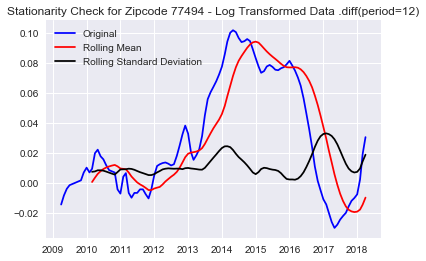

Results of Dickey-Fuller Test
Test Statistic                 -1.609172
p-value                         0.478985
#Lags Used                     13.000000
Number of Observations Used    95.000000
Critical Value (1%)            -3.501137
Critical Value (5%)            -2.892480
Critical Value (10%)           -2.583275
dtype: float64


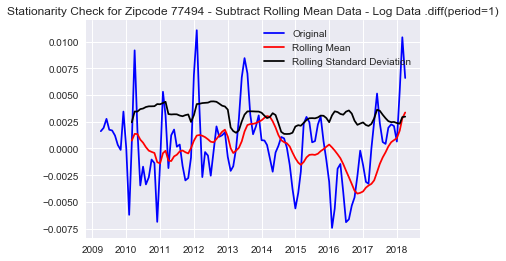

Results of Dickey-Fuller Test
Test Statistic                  -2.278312
p-value                          0.179058
#Lags Used                       7.000000
Number of Observations Used    101.000000
Critical Value (1%)             -3.496818
Critical Value (5%)             -2.890611
Critical Value (10%)            -2.582277
dtype: float64


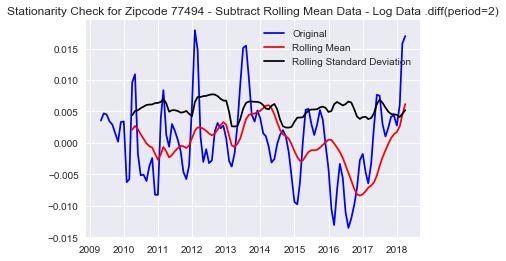

Results of Dickey-Fuller Test
Test Statistic                  -2.190776
p-value                          0.209610
#Lags Used                       6.000000
Number of Observations Used    101.000000
Critical Value (1%)             -3.496818
Critical Value (5%)             -2.890611
Critical Value (10%)            -2.582277
dtype: float64


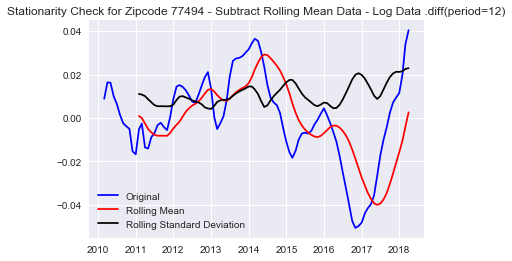

Results of Dickey-Fuller Test
Test Statistic                 -3.048767
p-value                         0.030584
#Lags Used                      6.000000
Number of Observations Used    91.000000
Critical Value (1%)            -3.504343
Critical Value (5%)            -2.893866
Critical Value (10%)           -2.584015
dtype: float64


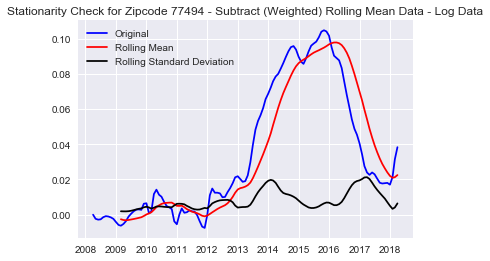

Results of Dickey-Fuller Test
Test Statistic                  -2.075035
p-value                          0.254671
#Lags Used                       8.000000
Number of Observations Used    112.000000
Critical Value (1%)             -3.490131
Critical Value (5%)             -2.887712
Critical Value (10%)            -2.580730
dtype: float64


In [44]:
# Check for seasonality in data
decomposition = seasonal_decompose(ts_77494)
decomposition.plot();
    
# Assess stationarity of time series
check_stationarity(ts_77494, 77494, "- Original Dataset")

# Eliminate Trends to find dataset that mets stationary assumptions
eliminate_trends(df = ts_77494, zipcode = 77494)

#### Observations:

> - Evaluating the original dataset none of the statistics were less than .05, therefore, none of these series were stationary.  
- So, applied several transformations until each time series passed the Dickey-Fuller statisical test for stationarity, before moving dataset forward for modeling.  After running through many transformations it was still very challegening to get the dataset to meet the stationary assumptions, however, I did find __Subtracting the rolling mean with differencing 1-4__ was effective in eliminating the trend in the dataset.  
- __77479__ was not close to eliminating trend using "subtract the rolling mean".  May consider using "weighted rolling mean".
- Seasonality exists in the dataset.  There appears to be an annual cycle in house prices. This will need to be controlled for by the model selected.
    
 > __Conclusion:__ Median house prices have a positive trend and they are very likely __not stationary__ since next-period prices rely heavily in the previous period price. 
 
 > Using log.diff(periods = TBD)

# Time Series Modeling

__Plot ACF and PACF__

__Fitting an ARIMA Time Series Model__

Calculate the Optimal p,d,q for ARIMA/SARIMA Model
Two alternative models will be compared for their relative performance:

__ARIMA:__ Corrects for non-stationarity by differencing by specified number of terms (d), includes lagged dependent variables (p) and lagged residuals (q) for specified number of periods

__SARIMA:__ As above, but also corrects for seasonality (s) within the data.
Given that the data has exhibited seasonality, we would expect the SARIMA model to offer the best performance.

Before estimating these models, the optimal p, d and q will be determined by running a SARIMA model for each zipcode and combination of p, d and q. The values of p, d and q for the model with the best performance, as given by the lowest AIC, will be selected. This is performed for zipcodes in Fort Bend County time series dataset.

## Model 1: Original Data

77406


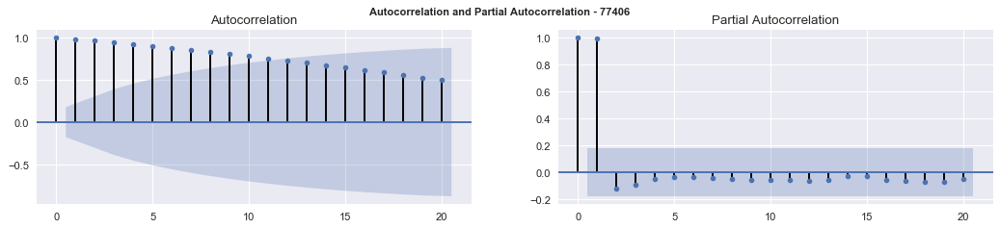

Non-seasonal parameters (p,d,q): (1, 1, 1)
Seasonal parameters and periodicity (P,D,Q,s): (1, 1, 1, 12)
AIC: 1452.4158024566
BIC: 1465.13227636795
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.8245      0.112      7.343      0.000       0.604       1.045
ma.L1          0.5052      0.129      3.930      0.000       0.253       0.757
ar.S.L12       0.0556      0.029      1.936      0.053      -0.001       0.112
ma.S.L12      -0.3865      0.084     -4.622      0.000      -0.550      -0.223
sigma2      3.181e+05   7.15e+04      4.450      0.000    1.78e+05    4.58e+05


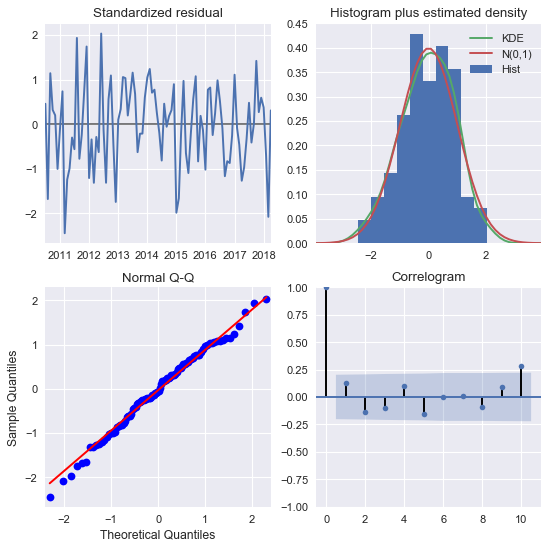

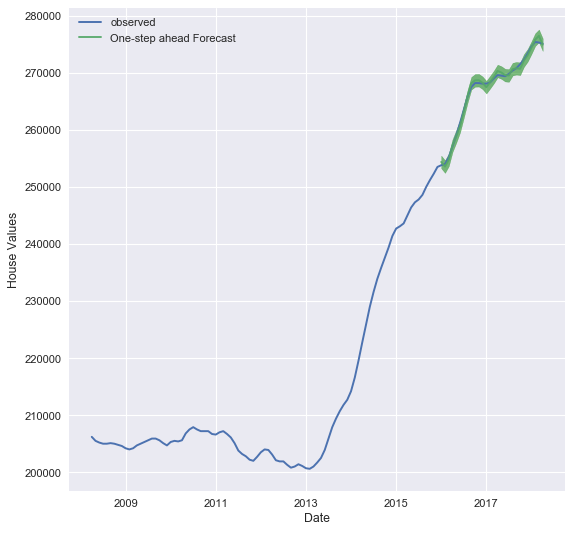

The Root Mean Squared Error of our forecasts is 459.02


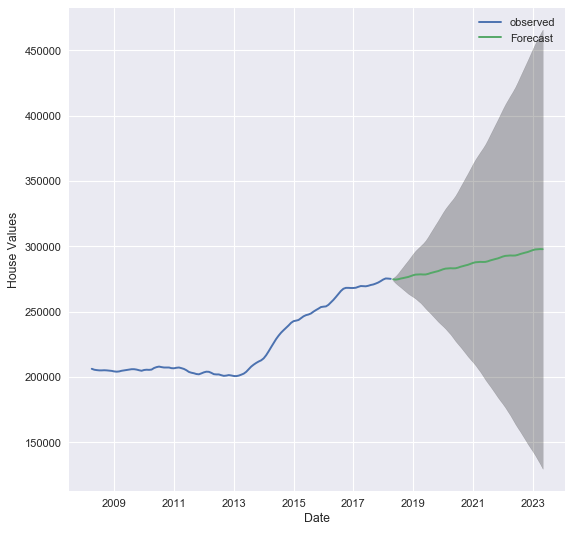

77407


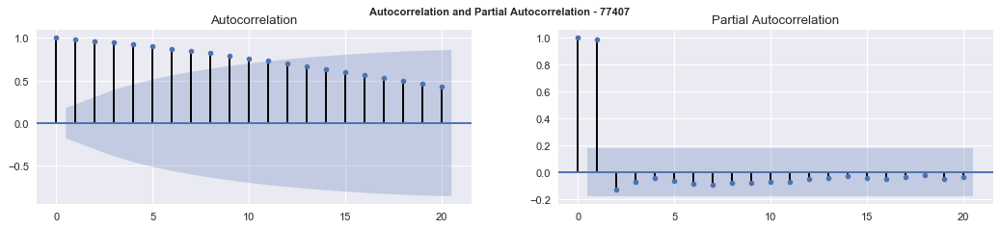

Non-seasonal parameters (p,d,q): (1, 1, 1)
Seasonal parameters and periodicity (P,D,Q,s): (1, 1, 1, 12)
AIC: 1526.9341727159317
BIC: 1539.6506466272817
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.7631      0.067     11.363      0.000       0.631       0.895
ma.L1          0.1867      0.048      3.916      0.000       0.093       0.280
ar.S.L12      -0.3917      0.071     -5.543      0.000      -0.530      -0.253
ma.S.L12       0.0731      0.042      1.751      0.080      -0.009       0.155
sigma2      6.218e+05   9.13e+04      6.814      0.000    4.43e+05    8.01e+05


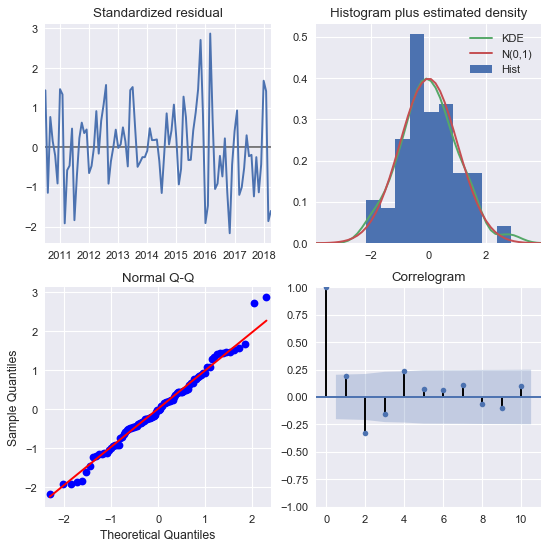

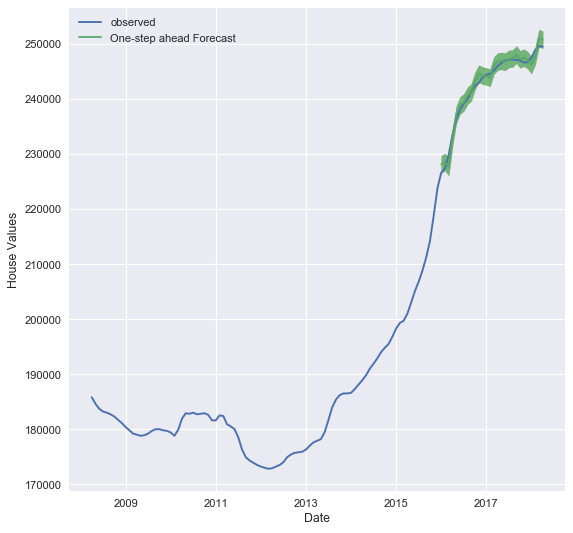

The Root Mean Squared Error of our forecasts is 955.91


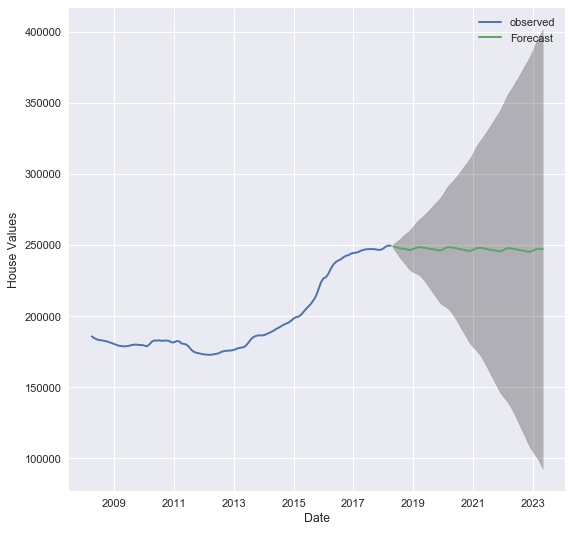

77441


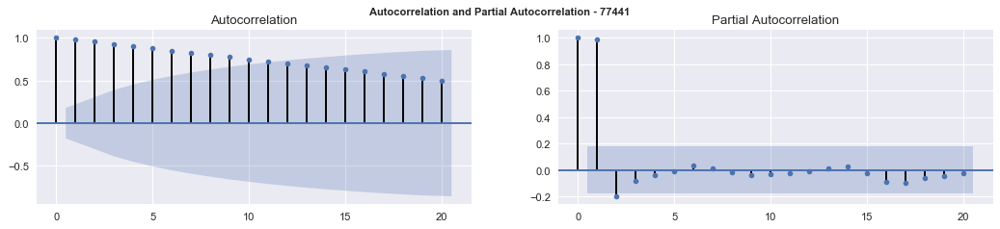

Non-seasonal parameters (p,d,q): (1, 1, 1)
Seasonal parameters and periodicity (P,D,Q,s): (1, 1, 1, 12)
AIC: 1690.7447369885676
BIC: 1703.4612108999177
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.4797      0.106      4.514      0.000       0.271       0.688
ma.L1          0.7710      0.070     10.937      0.000       0.633       0.909
ar.S.L12       0.1141      0.020      5.697      0.000       0.075       0.153
ma.S.L12      -0.1837      0.038     -4.806      0.000      -0.259      -0.109
sigma2      3.581e+06   3.06e+05     11.715      0.000    2.98e+06    4.18e+06


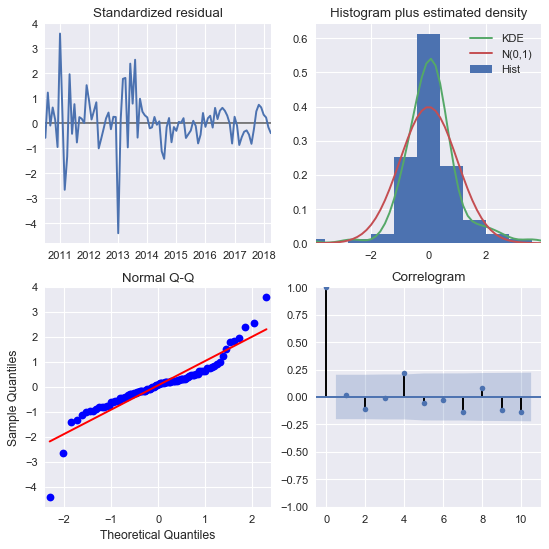

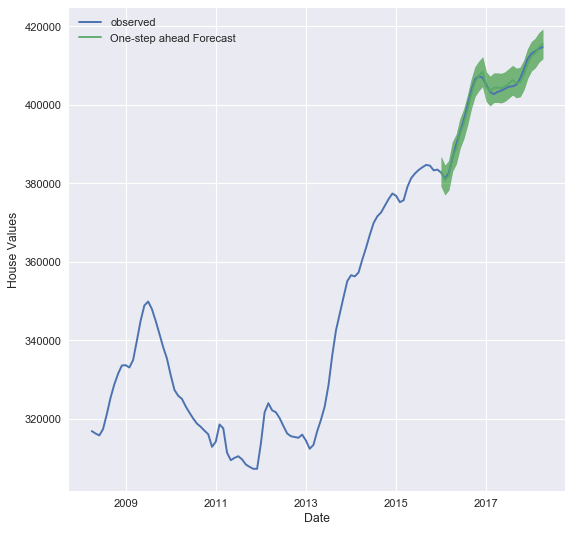

The Root Mean Squared Error of our forecasts is 878.03


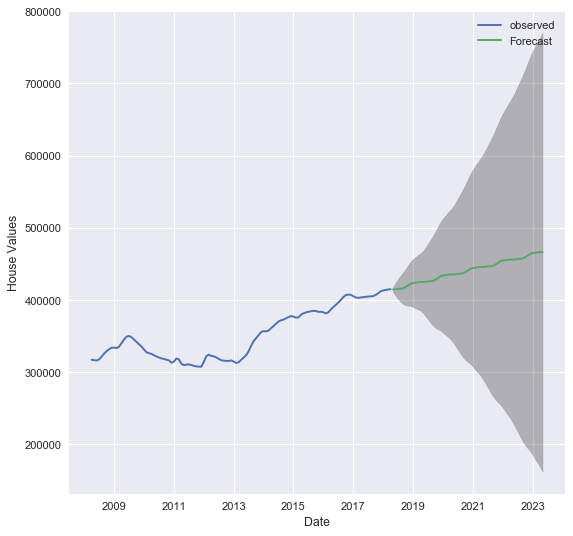

77450


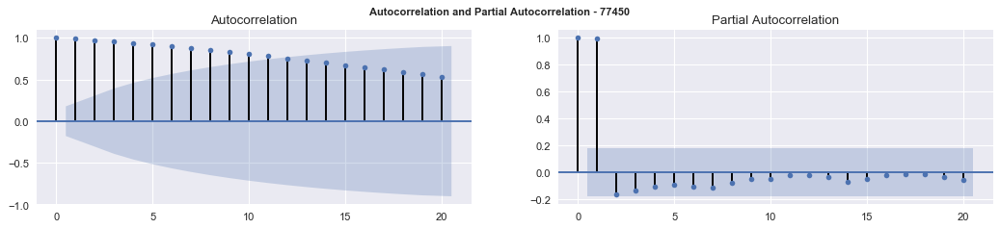

Non-seasonal parameters (p,d,q): (1, 1, 1)
Seasonal parameters and periodicity (P,D,Q,s): (1, 1, 1, 12)
AIC: 1420.8281024589776
BIC: 1433.5445763703276
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.8887      0.086     10.298      0.000       0.720       1.058
ma.L1          0.6816      0.125      5.461      0.000       0.437       0.926
ar.S.L12       0.0417      0.015      2.732      0.006       0.012       0.072
ma.S.L12      -0.4416      0.079     -5.604      0.000      -0.596      -0.287
sigma2      2.393e+05   3.57e+04      6.698      0.000    1.69e+05    3.09e+05


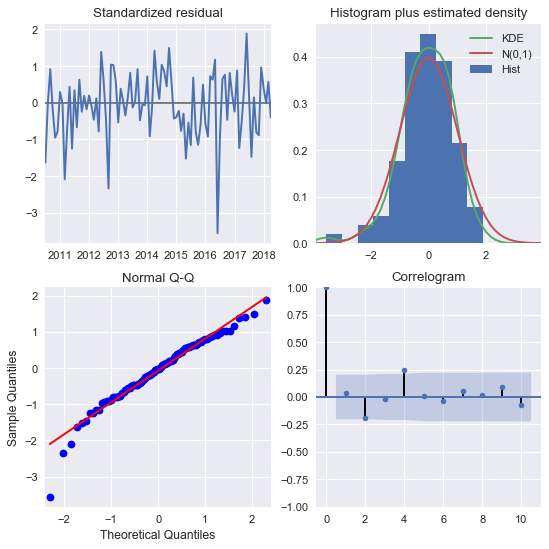

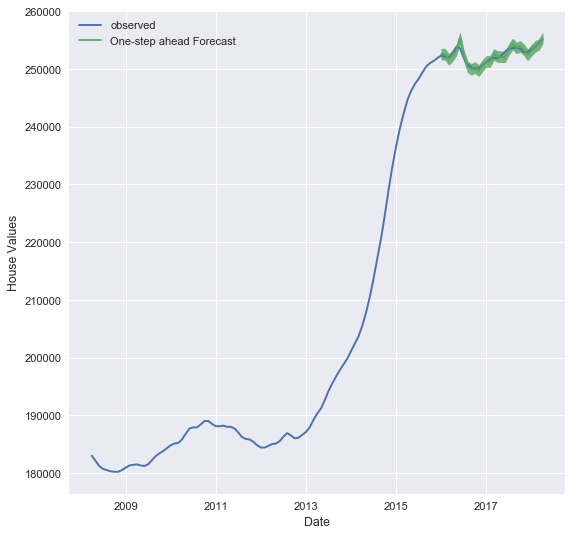

The Root Mean Squared Error of our forecasts is 511.01


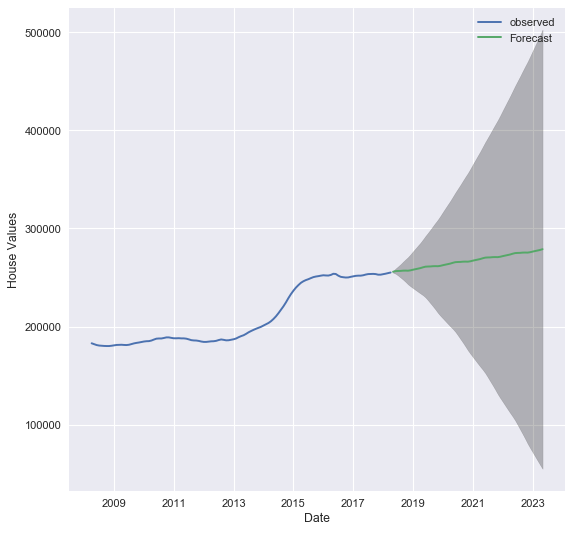

77459


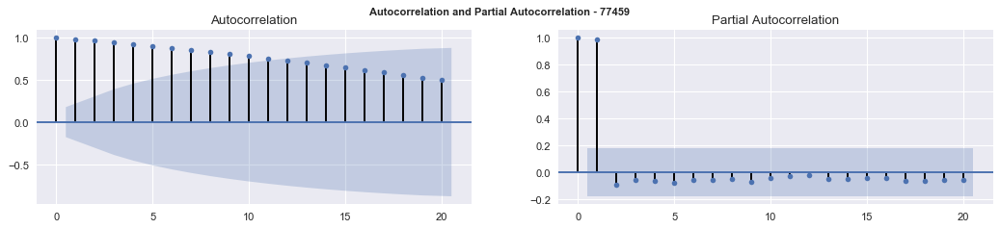

Non-seasonal parameters (p,d,q): (1, 1, 1)
Seasonal parameters and periodicity (P,D,Q,s): (1, 1, 1, 12)
AIC: 1427.6177072319815
BIC: 1440.3341811433315
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.8571      0.051     16.908      0.000       0.758       0.956
ma.L1          0.1650      0.073      2.271      0.023       0.023       0.307
ar.S.L12       0.1028      0.019      5.361      0.000       0.065       0.140
ma.S.L12      -0.9637      0.553     -1.742      0.082      -2.048       0.121
sigma2      1.482e+05   8.02e+04      1.847      0.065   -9104.606    3.05e+05


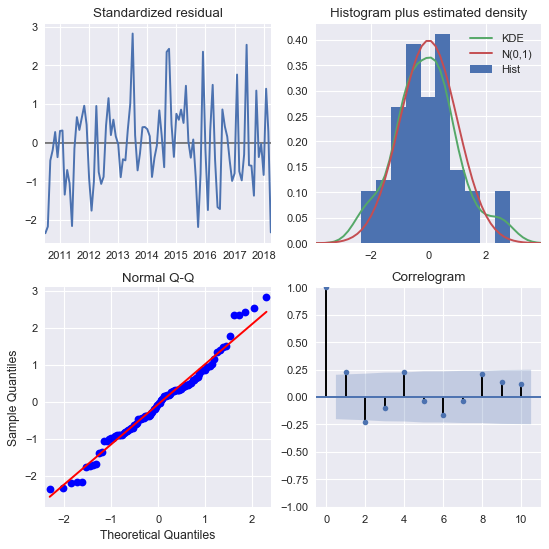

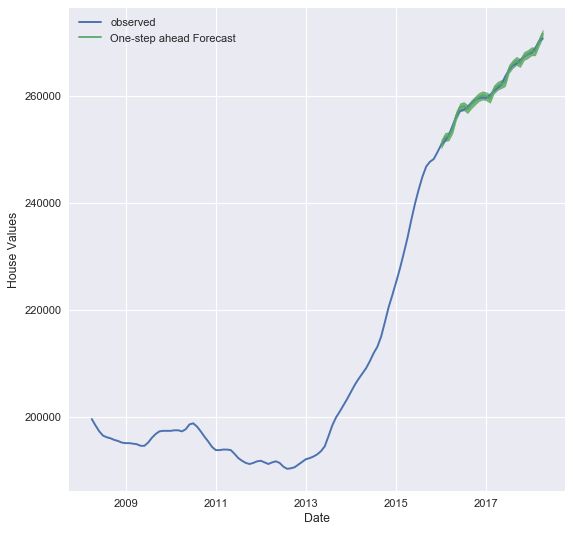

The Root Mean Squared Error of our forecasts is 466.49


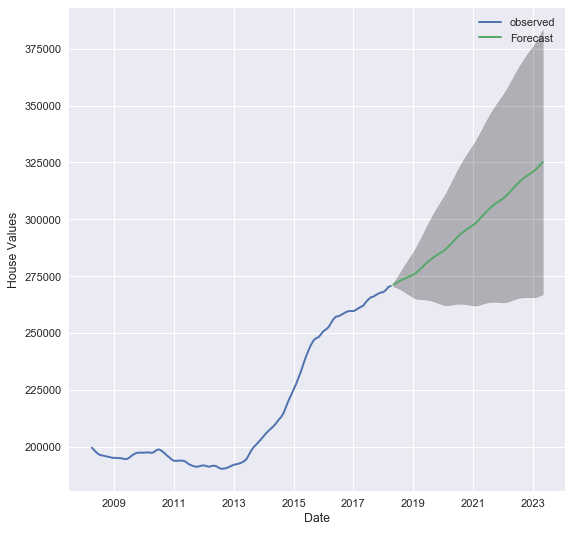

77478


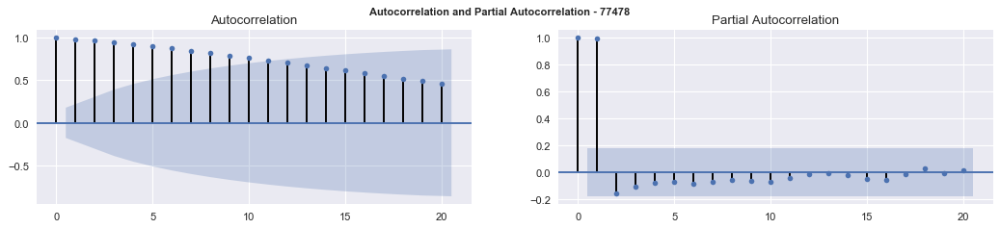

Non-seasonal parameters (p,d,q): (1, 1, 1)
Seasonal parameters and periodicity (P,D,Q,s): (1, 1, 1, 12)
AIC: 1503.8160085767827
BIC: 1516.5324824881327
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.8417      0.059     14.258      0.000       0.726       0.957
ma.L1          0.2062      0.047      4.405      0.000       0.114       0.298
ar.S.L12      -0.7180      0.089     -8.106      0.000      -0.892      -0.544
ma.S.L12   -2.963e-05      0.026     -0.001      0.999      -0.051       0.051
sigma2      4.912e+05   8.94e+04      5.495      0.000    3.16e+05    6.66e+05


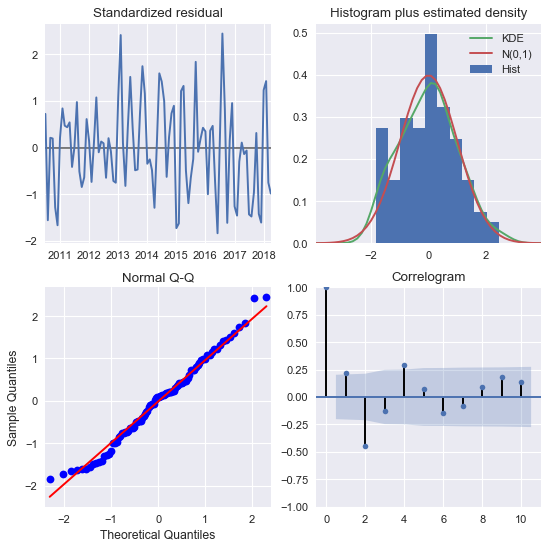

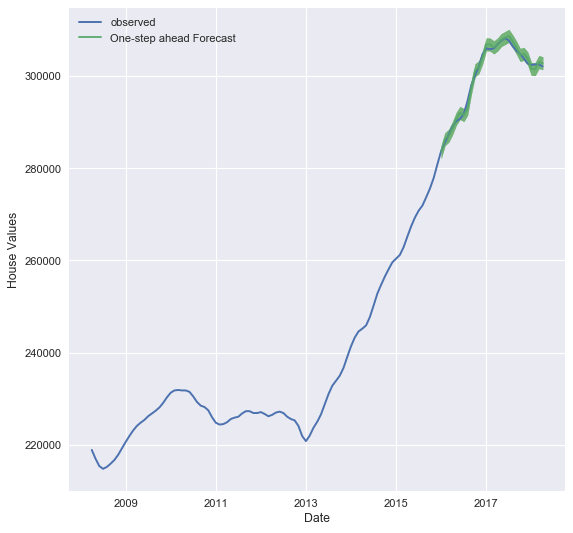

The Root Mean Squared Error of our forecasts is 776.92


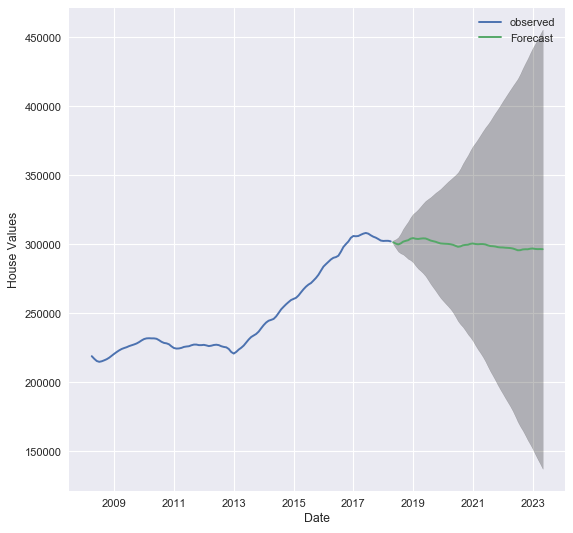

77479


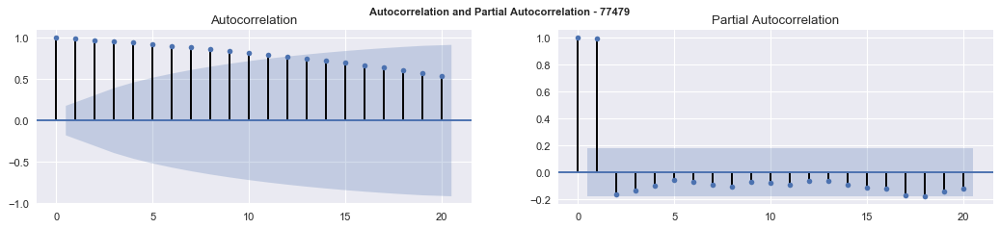

Non-seasonal parameters (p,d,q): (1, 1, 1)
Seasonal parameters and periodicity (P,D,Q,s): (1, 1, 1, 12)
AIC: 1505.385129302492
BIC: 1518.101603213842
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.8146      0.098      8.288      0.000       0.622       1.007
ma.L1          0.4847      0.112      4.334      0.000       0.266       0.704
ar.S.L12       0.0929      0.034      2.700      0.007       0.025       0.160
ma.S.L12      -0.3896      0.067     -5.778      0.000      -0.522      -0.257
sigma2      5.848e+05    1.2e+05      4.886      0.000     3.5e+05    8.19e+05


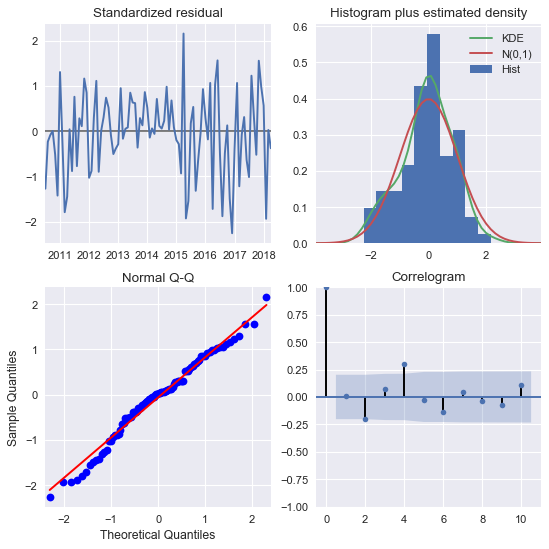

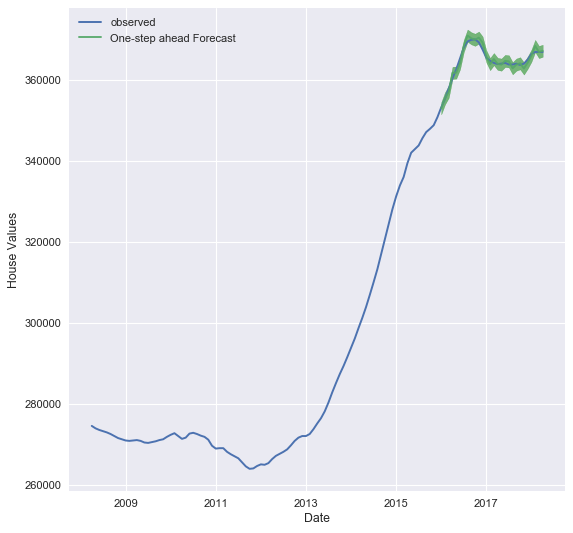

The Root Mean Squared Error of our forecasts is 828.37


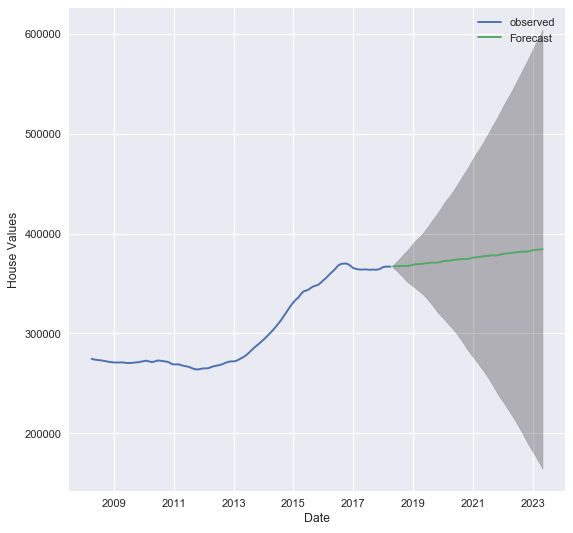

77494


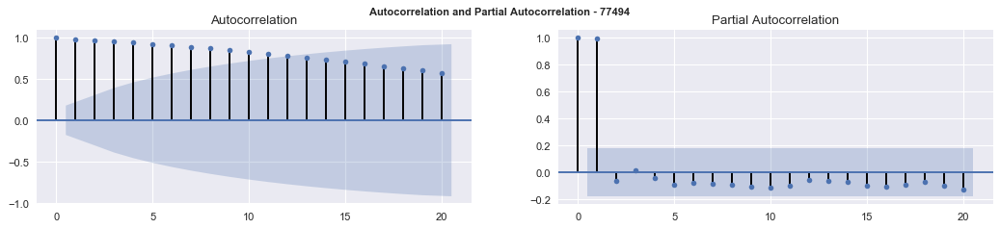

Non-seasonal parameters (p,d,q): (1, 1, 1)
Seasonal parameters and periodicity (P,D,Q,s): (1, 1, 1, 12)
AIC: 1560.7212411651553
BIC: 1573.4377150765054
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.6064      0.107      5.689      0.000       0.397       0.815
ma.L1          0.6974      0.113      6.195      0.000       0.477       0.918
ar.S.L12       0.0761      0.025      3.056      0.002       0.027       0.125
ma.S.L12      -0.2051      0.040     -5.099      0.000      -0.284      -0.126
sigma2      1.002e+06   1.65e+05      6.082      0.000    6.79e+05    1.33e+06


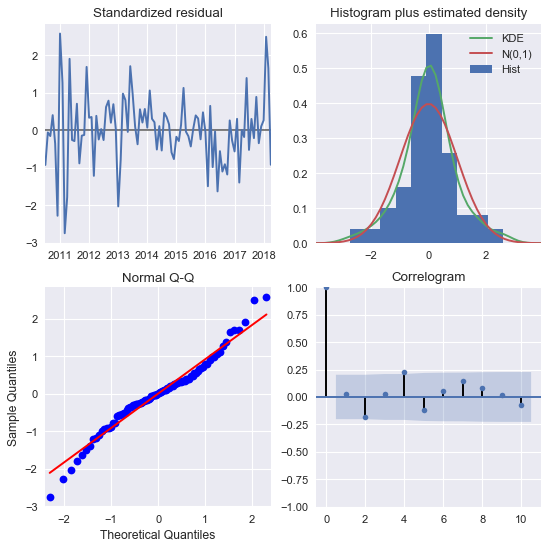

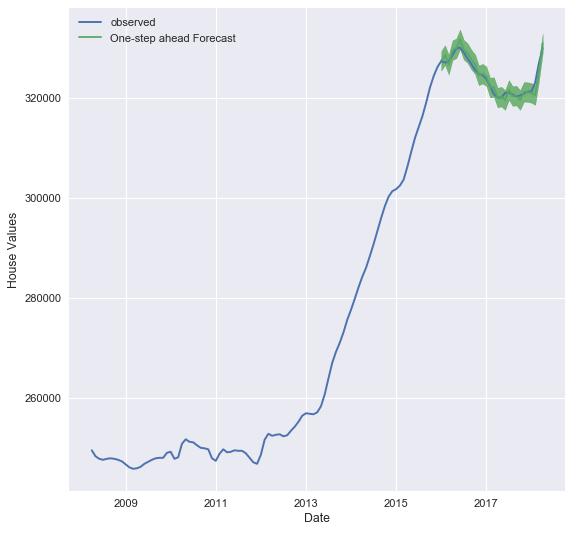

The Root Mean Squared Error of our forecasts is 960.03


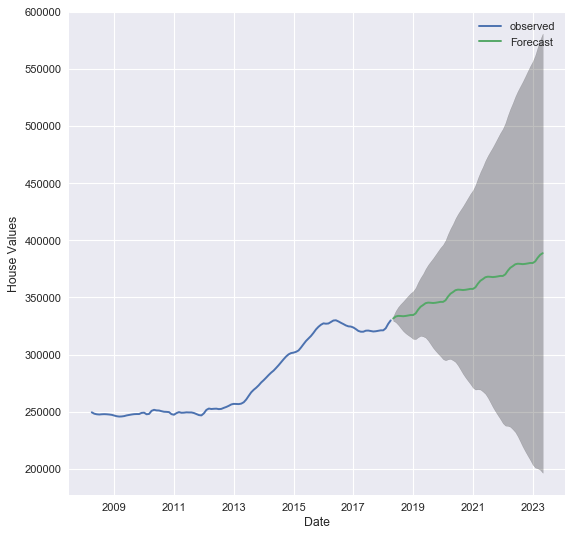

In [45]:
# Run TS Model using Original Data
TS_Model(df_ts)

#### Observations:
> TBD

## Model 2: Log Transformed Data

77406


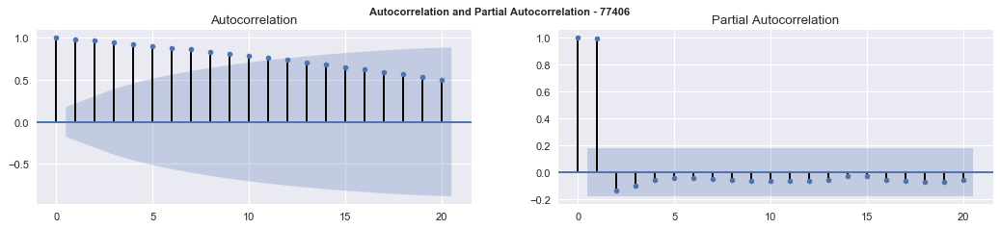

Non-seasonal parameters (p,d,q): (1, 1, 1)
Seasonal parameters and periodicity (P,D,Q,s): (0, 0, 0, 12)
AIC: -1155.5593775114346
BIC: -1147.2473236380376
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.8470      0.057     14.800      0.000       0.735       0.959
ma.L1          0.4995      0.083      5.991      0.000       0.336       0.663
sigma2      3.097e-06    4.2e-07      7.371      0.000    2.27e-06    3.92e-06


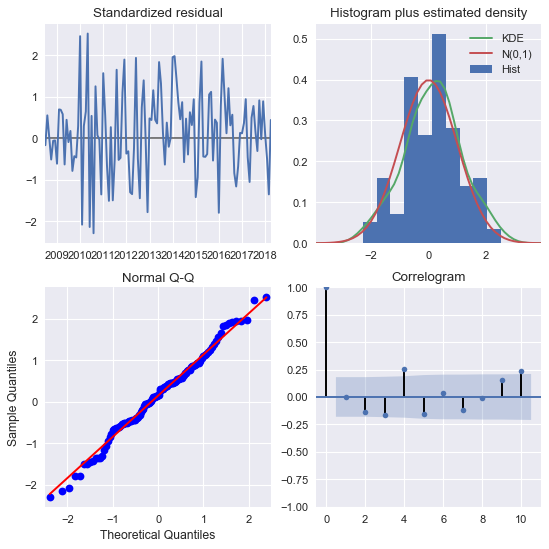

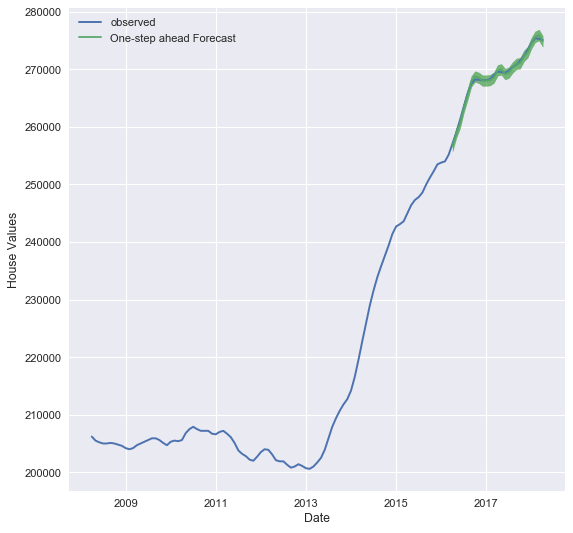

The Mean Squared Error of our forecasts is 112787.91
The Root Mean Squared Error of our forecasts is 335.84
prediction values: <statsmodels.tsa.statespace.mlemodel.PredictionResultsWrapper object at 0x000001ED42AADEB8>



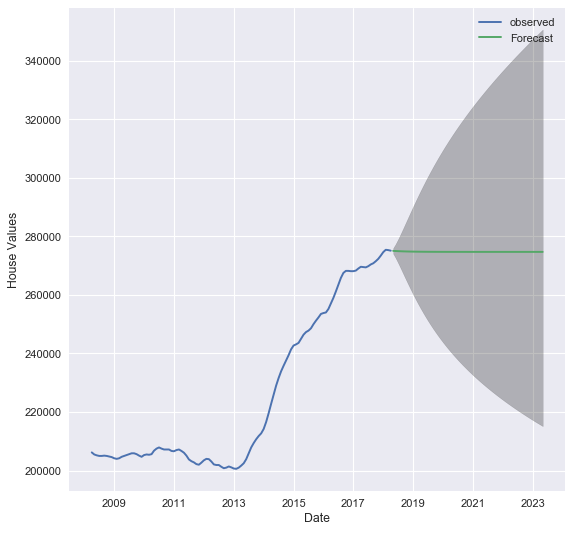

77407


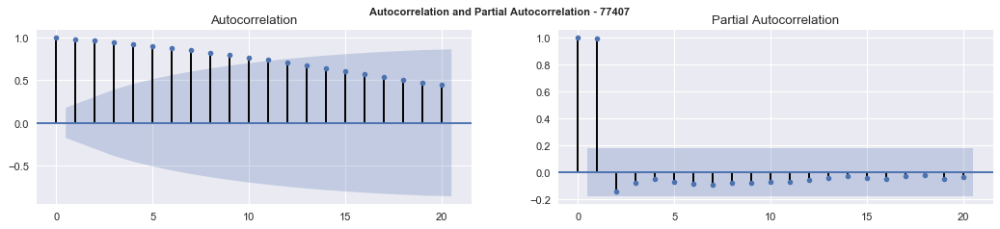

Non-seasonal parameters (p,d,q): (1, 1, 1)
Seasonal parameters and periodicity (P,D,Q,s): (0, 0, 0, 12)
AIC: -1052.4563052647284
BIC: -1044.1442513913314
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.7671      0.050     15.245      0.000       0.668       0.866
ma.L1          0.5302      0.082      6.432      0.000       0.369       0.692
sigma2      7.435e-06   6.78e-07     10.969      0.000    6.11e-06    8.76e-06


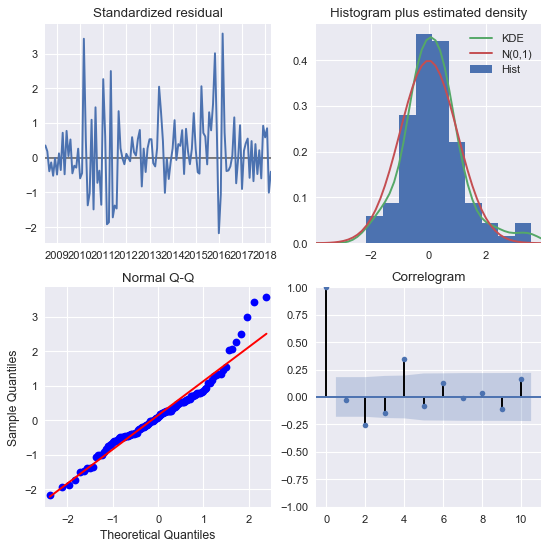

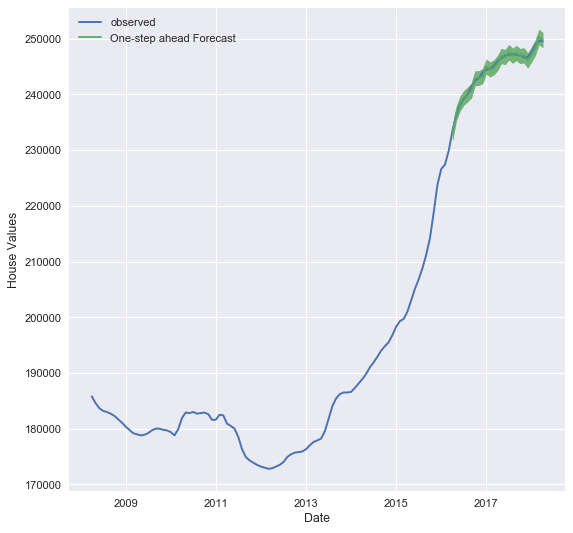

The Mean Squared Error of our forecasts is 175443.54
The Root Mean Squared Error of our forecasts is 418.86
prediction values: <statsmodels.tsa.statespace.mlemodel.PredictionResultsWrapper object at 0x000001ED4B8F02B0>



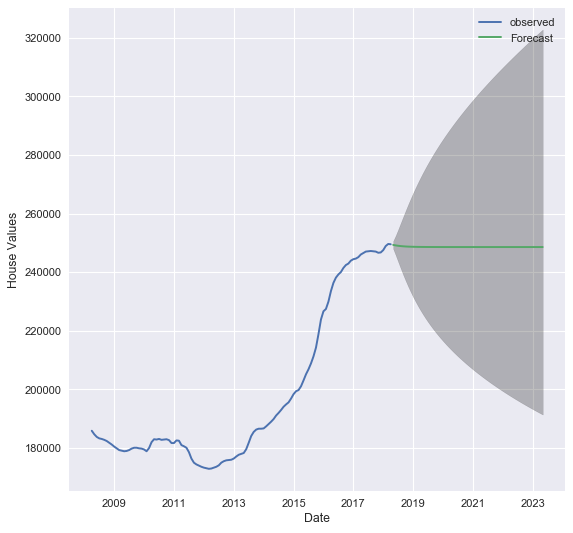

77441


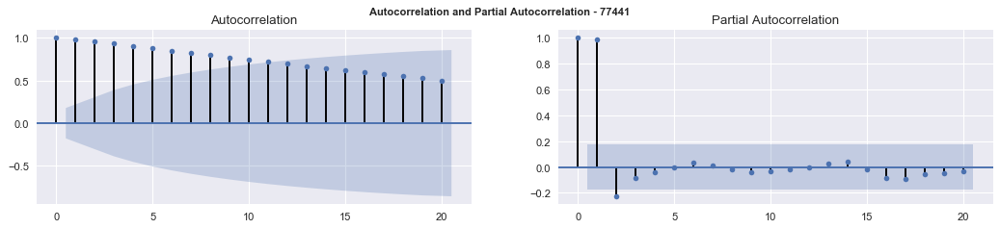

Non-seasonal parameters (p,d,q): (1, 1, 1)
Seasonal parameters and periodicity (P,D,Q,s): (0, 0, 0, 12)
AIC: -939.2512999330298
BIC: -930.9392460596329
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.4863      0.069      7.064      0.000       0.351       0.621
ma.L1          0.7177      0.067     10.778      0.000       0.587       0.848
sigma2      1.935e-05   1.55e-06     12.454      0.000    1.63e-05    2.24e-05


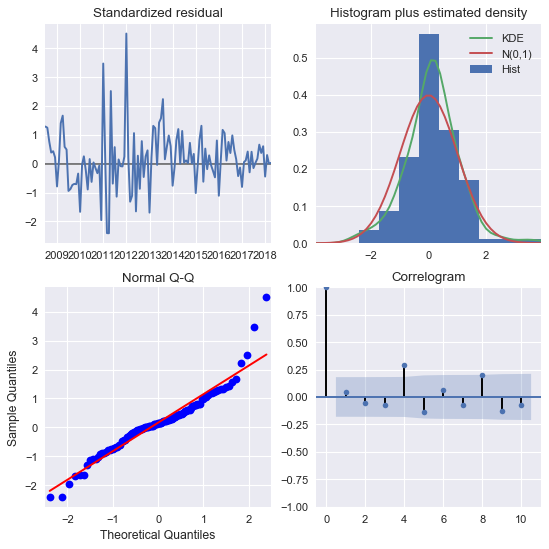

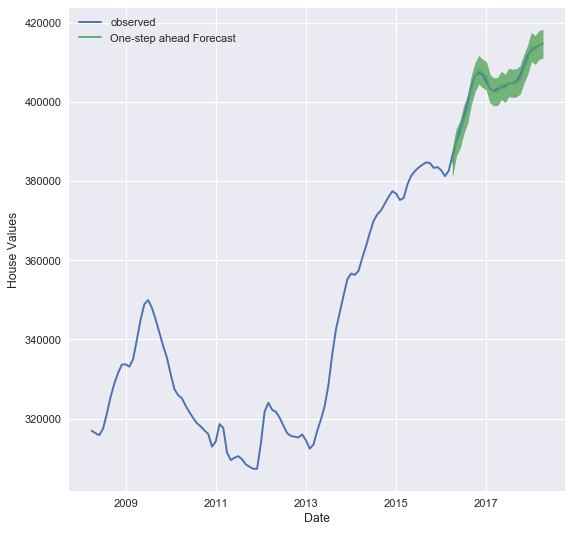

The Mean Squared Error of our forecasts is 696847.77
The Root Mean Squared Error of our forecasts is 834.77
prediction values: <statsmodels.tsa.statespace.mlemodel.PredictionResultsWrapper object at 0x000001ED422EBCF8>



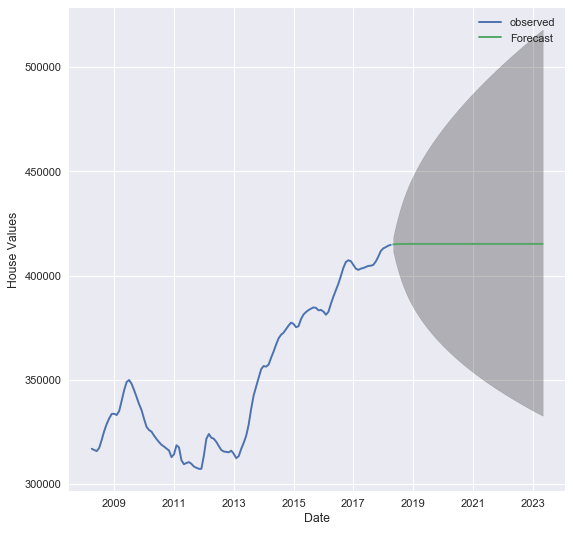

77450


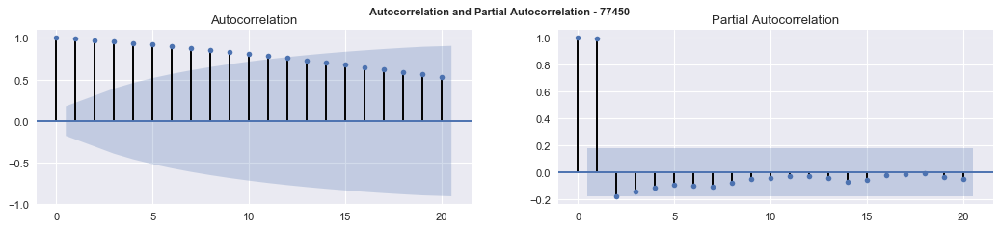

Non-seasonal parameters (p,d,q): (1, 1, 1)
Seasonal parameters and periodicity (P,D,Q,s): (0, 0, 0, 12)
AIC: -1190.0075486851367
BIC: -1181.6954948117398
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.9015      0.039     23.411      0.000       0.826       0.977
ma.L1          0.5478      0.084      6.520      0.000       0.383       0.712
sigma2      2.314e-06   2.46e-07      9.418      0.000    1.83e-06     2.8e-06


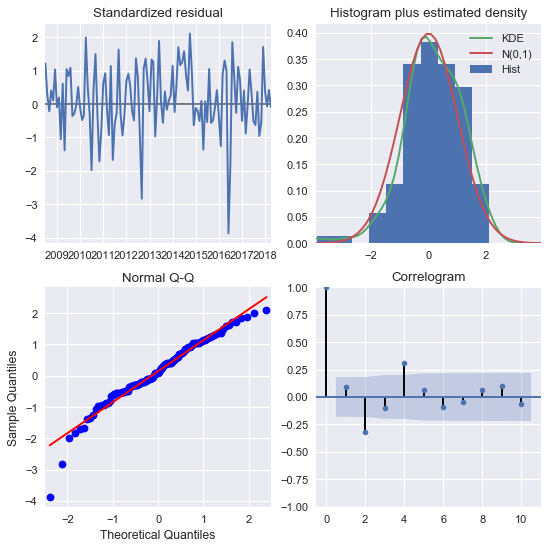

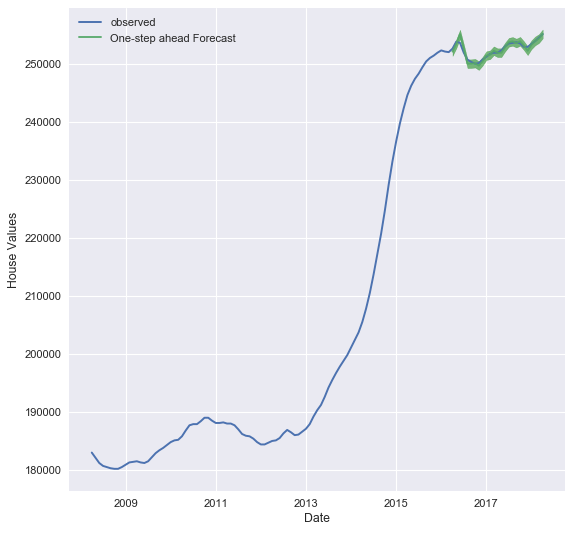

The Mean Squared Error of our forecasts is 204637.41
The Root Mean Squared Error of our forecasts is 452.37
prediction values: <statsmodels.tsa.statespace.mlemodel.PredictionResultsWrapper object at 0x000001ED42BDF9E8>



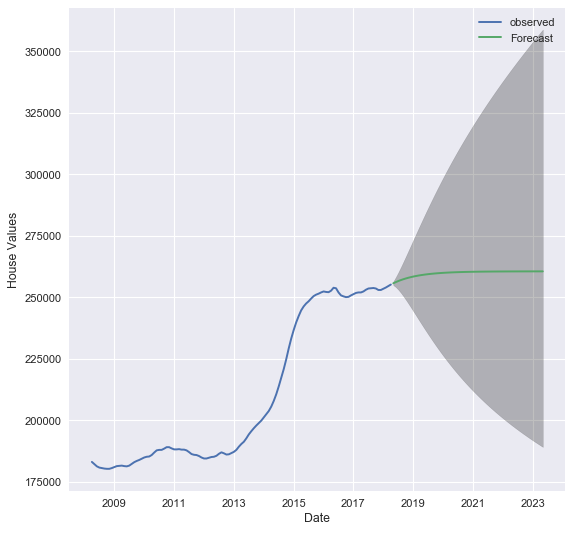

77459


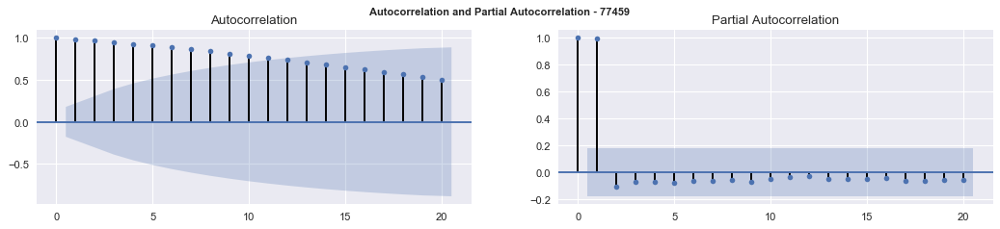

Non-seasonal parameters (p,d,q): (1, 1, 1)
Seasonal parameters and periodicity (P,D,Q,s): (0, 0, 0, 12)
AIC: -1180.1884734109435
BIC: -1171.8764195375466
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.8884      0.045     19.536      0.000       0.799       0.978
ma.L1          0.4572      0.089      5.150      0.000       0.283       0.631
sigma2      2.511e-06   3.12e-07      8.046      0.000     1.9e-06    3.12e-06


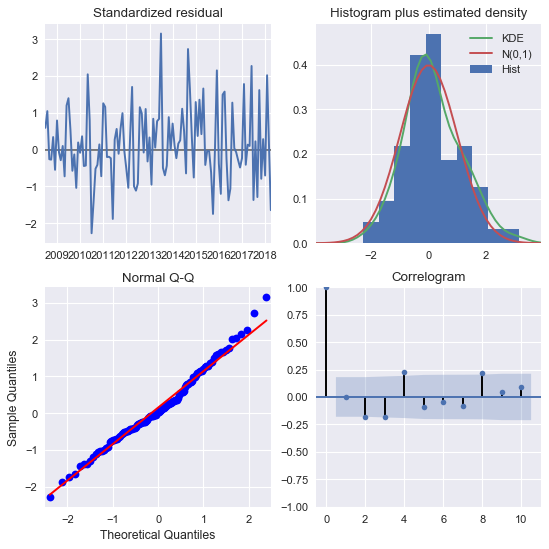

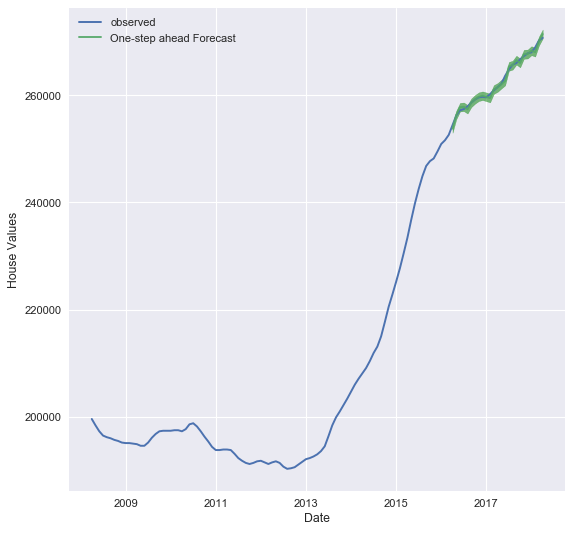

The Mean Squared Error of our forecasts is 211702.35
The Root Mean Squared Error of our forecasts is 460.11
prediction values: <statsmodels.tsa.statespace.mlemodel.PredictionResultsWrapper object at 0x000001ED44FD6588>



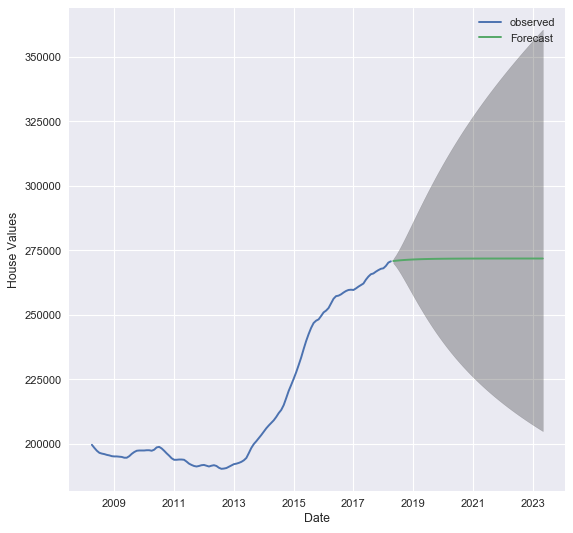

77478


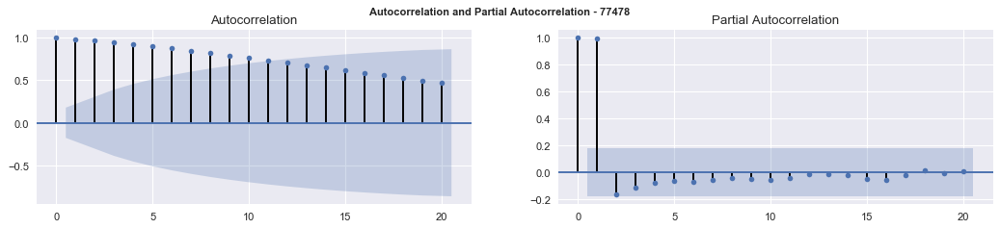

Non-seasonal parameters (p,d,q): (1, 1, 1)
Seasonal parameters and periodicity (P,D,Q,s): (0, 0, 0, 12)
AIC: -1145.454957674043
BIC: -1137.142903800646
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.7907      0.053     14.865      0.000       0.686       0.895
ma.L1          0.6812      0.074      9.238      0.000       0.537       0.826
sigma2      3.378e-06   4.62e-07      7.317      0.000    2.47e-06    4.28e-06


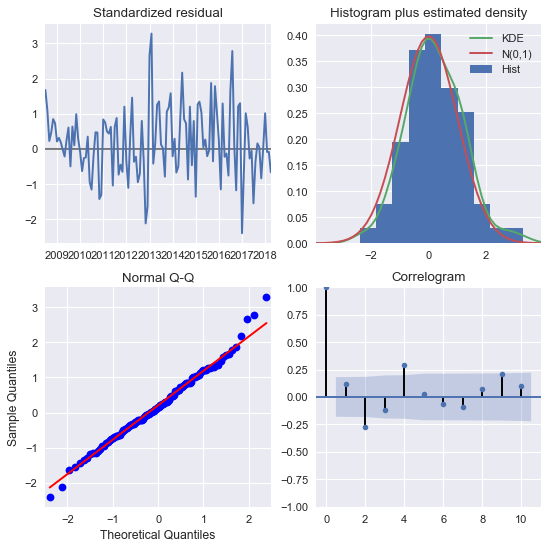

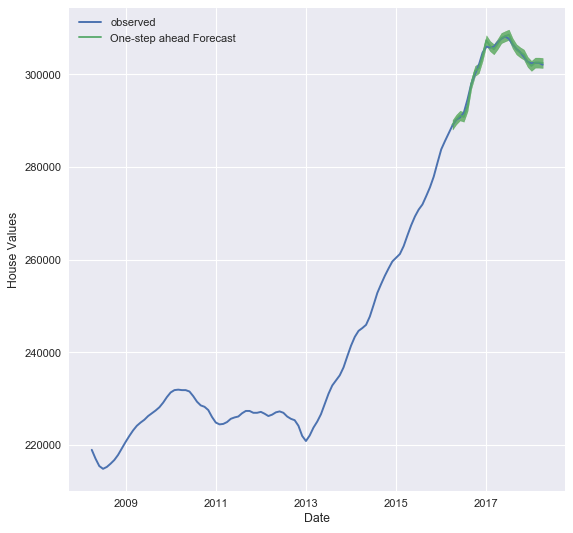

The Mean Squared Error of our forecasts is 340897.18
The Root Mean Squared Error of our forecasts is 583.86
prediction values: <statsmodels.tsa.statespace.mlemodel.PredictionResultsWrapper object at 0x000001ED42F082B0>



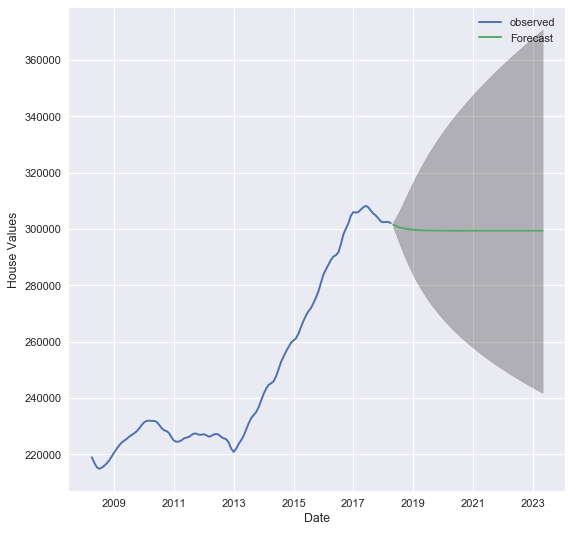

77479


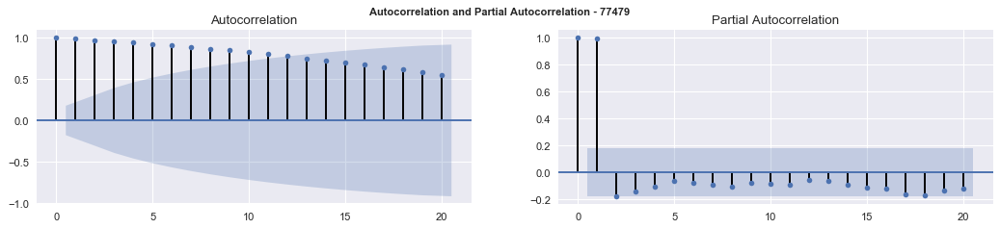

Non-seasonal parameters (p,d,q): (1, 1, 1)
Seasonal parameters and periodicity (P,D,Q,s): (0, 0, 0, 12)
AIC: -1192.8782606245077
BIC: -1184.5662067511107
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.9092      0.039     23.485      0.000       0.833       0.985
ma.L1          0.3436      0.074      4.665      0.000       0.199       0.488
sigma2       2.25e-06   2.71e-07      8.308      0.000    1.72e-06    2.78e-06


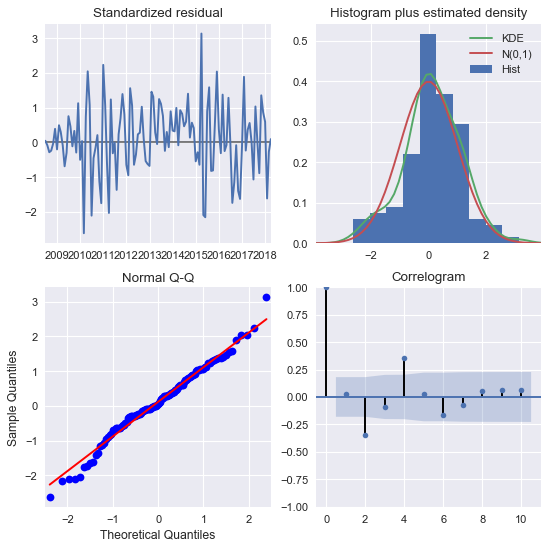

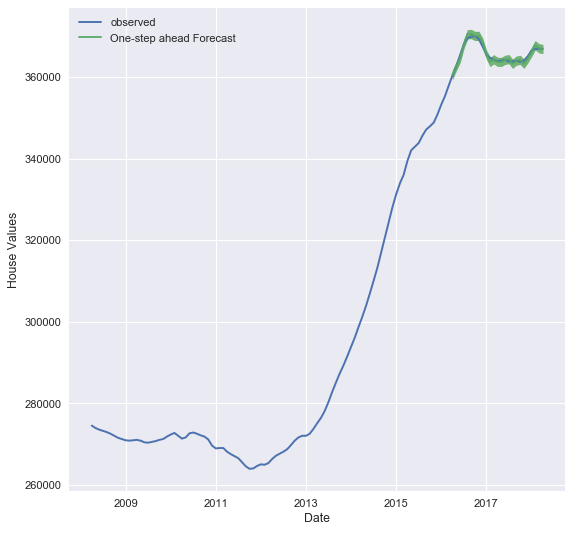

The Mean Squared Error of our forecasts is 282557.18
The Root Mean Squared Error of our forecasts is 531.56
prediction values: <statsmodels.tsa.statespace.mlemodel.PredictionResultsWrapper object at 0x000001ED42953EF0>



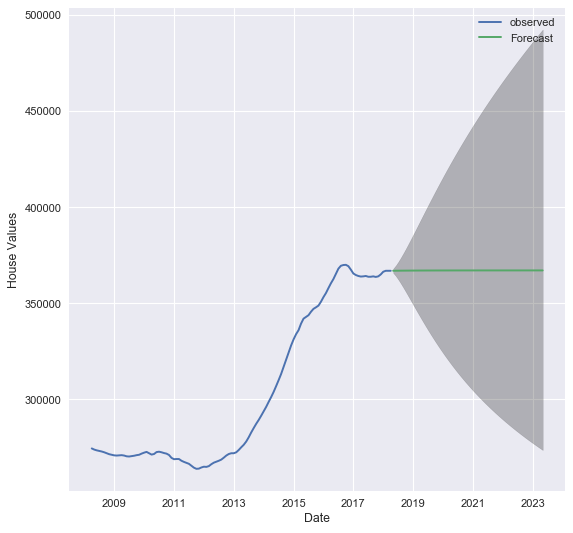

77494


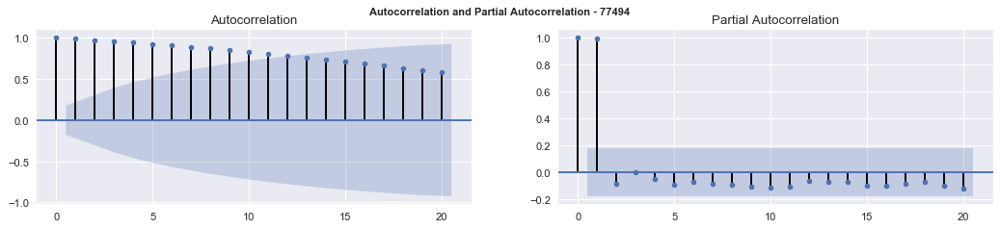

Non-seasonal parameters (p,d,q): (1, 1, 1)
Seasonal parameters and periodicity (P,D,Q,s): (0, 0, 0, 12)
AIC: -1068.4025623592543
BIC: -1060.0905084858573
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.6783      0.074      9.162      0.000       0.533       0.823
ma.L1          0.5067      0.089      5.675      0.000       0.332       0.682
sigma2       6.48e-06   7.82e-07      8.285      0.000    4.95e-06    8.01e-06


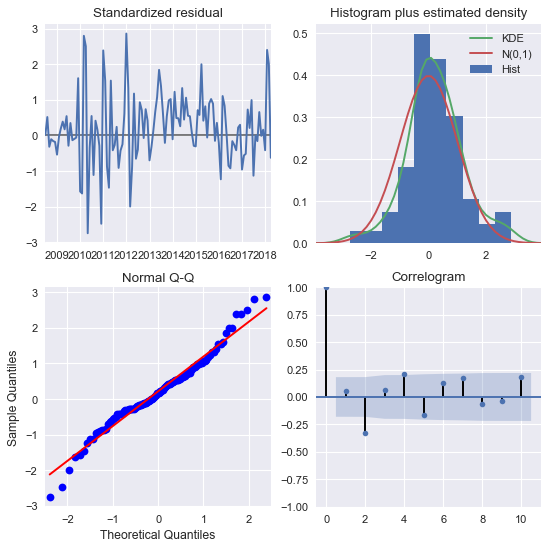

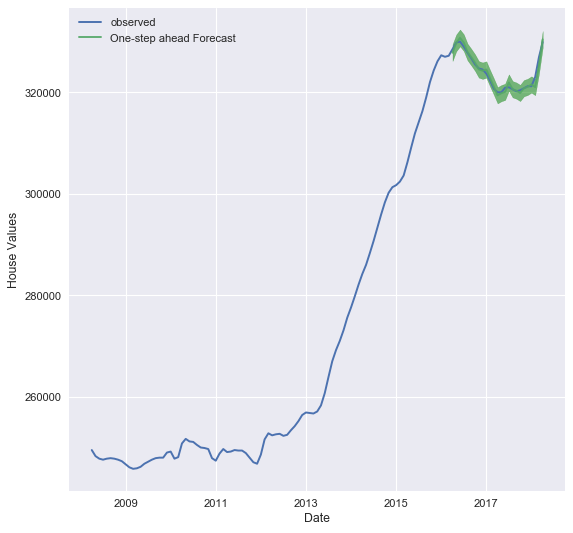

The Mean Squared Error of our forecasts is 486664.48
The Root Mean Squared Error of our forecasts is 697.61
prediction values: <statsmodels.tsa.statespace.mlemodel.PredictionResultsWrapper object at 0x000001ED42C2CC50>



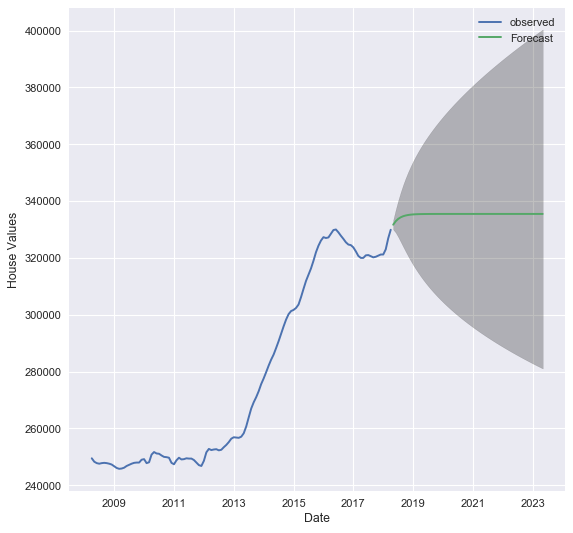

In [46]:
# Run TS Model using Log Transformed Data
TS_Model_Log(df_ts)

#### Observations:
> TBD

## Model 3: Subtract Rolling Mean - Log Data (Diff=1)

77406


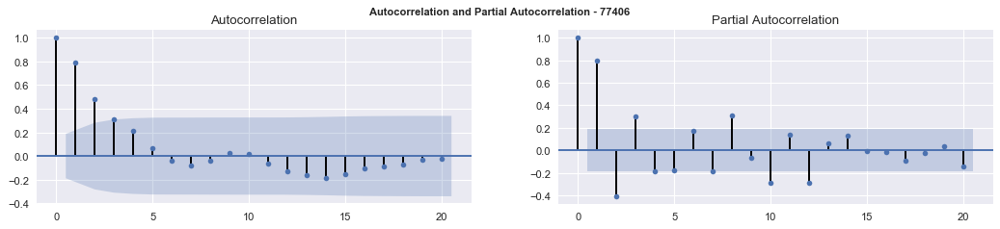

Non-seasonal parameters (p,d,q): (1, 0, 1)
Seasonal parameters and periodicity (P,D,Q,s): (0, 0, 0, 12)
AIC: -1058.1894270567172
BIC: -1050.1709405533315
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.6024      0.096      6.249      0.000       0.413       0.791
ma.L1          0.6365      0.072      8.888      0.000       0.496       0.777
sigma2      2.792e-06   4.37e-07      6.391      0.000    1.94e-06    3.65e-06


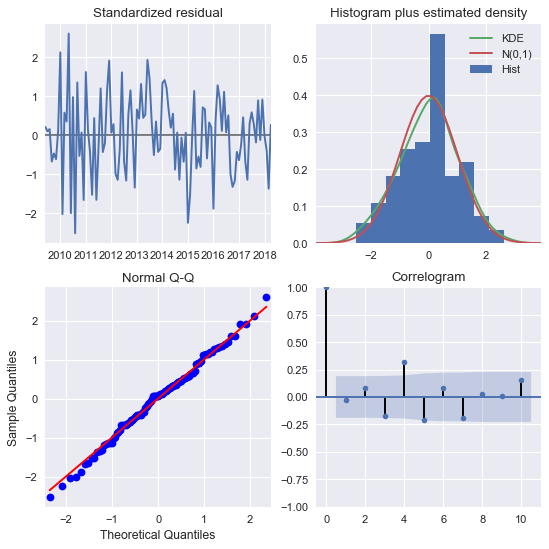

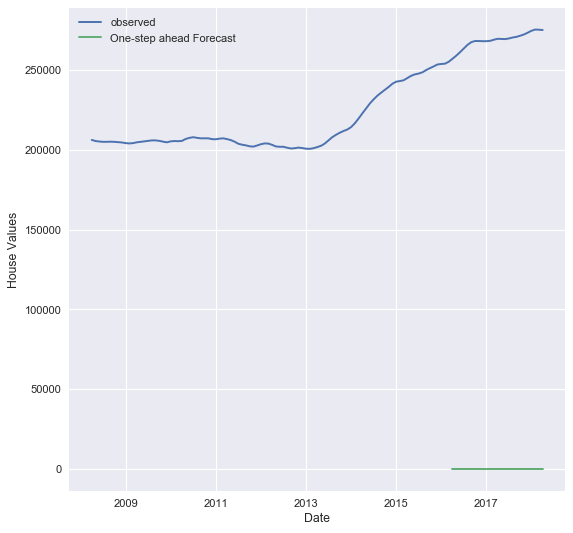

The Mean Squared Error of our forecasts is 72298708507.21
The Root Mean Squared Error of our forecasts is 268884.19
prediction values: <statsmodels.tsa.statespace.mlemodel.PredictionResultsWrapper object at 0x000001ED4BBC9CF8>



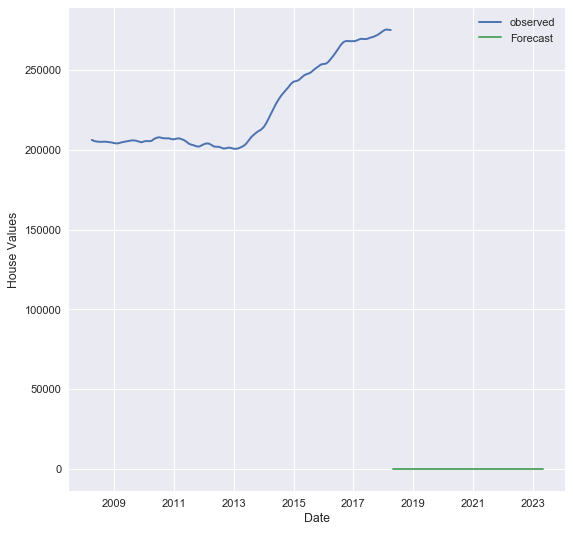

77407


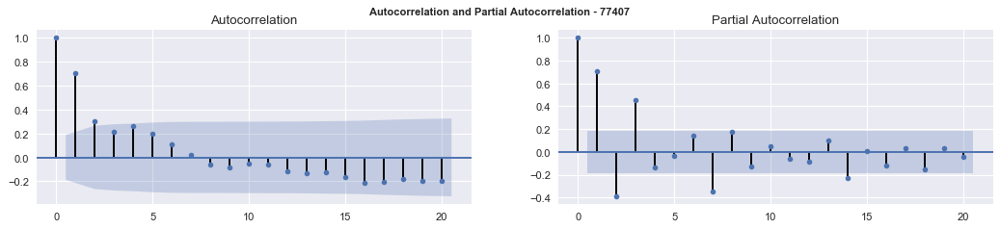

Non-seasonal parameters (p,d,q): (1, 0, 1)
Seasonal parameters and periodicity (P,D,Q,s): (0, 0, 0, 12)
AIC: -970.5005682297566
BIC: -962.4820817263709
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.5072      0.080      6.356      0.000       0.351       0.664
ma.L1          0.5831      0.090      6.505      0.000       0.407       0.759
sigma2      6.319e-06   8.03e-07      7.866      0.000    4.74e-06    7.89e-06


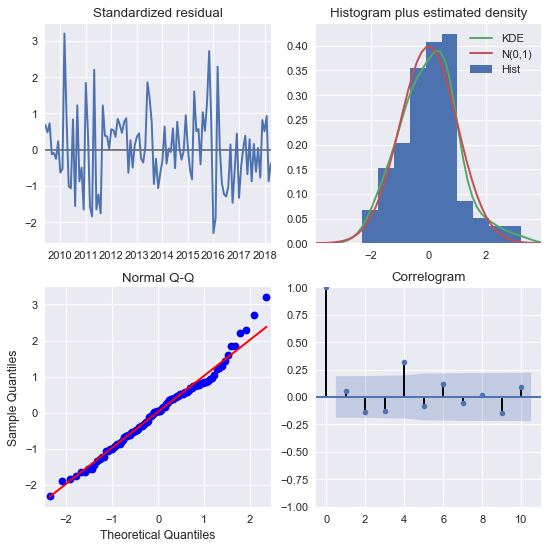

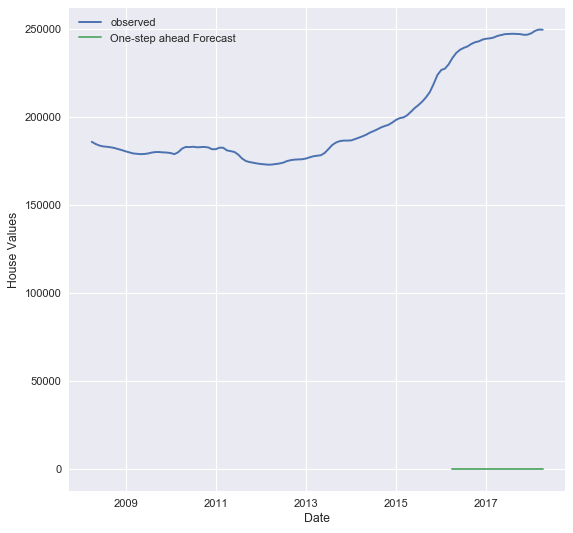

The Mean Squared Error of our forecasts is 59718932372.5
The Root Mean Squared Error of our forecasts is 244374.57
prediction values: <statsmodels.tsa.statespace.mlemodel.PredictionResultsWrapper object at 0x000001ED43A829E8>



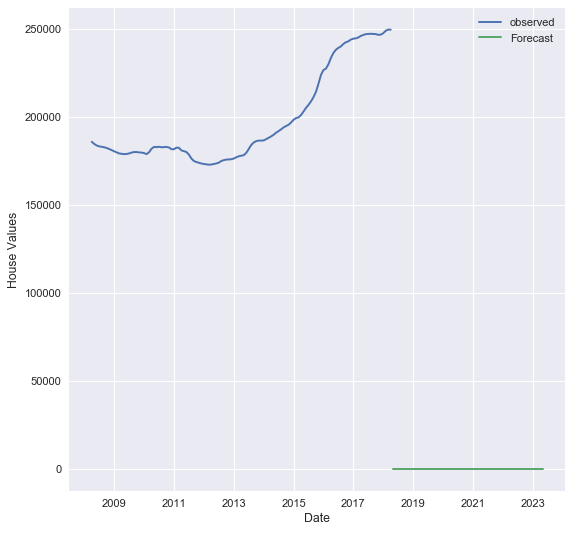

77441


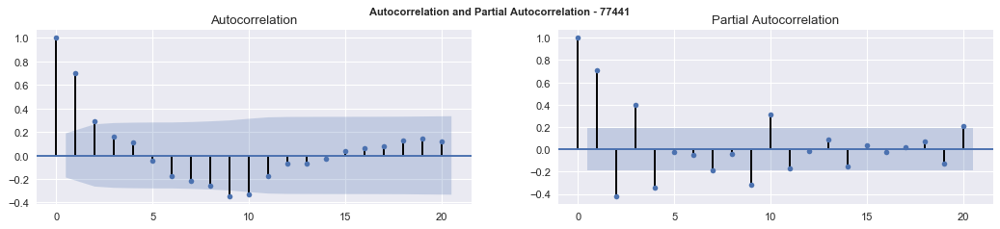

Non-seasonal parameters (p,d,q): (1, 0, 1)
Seasonal parameters and periodicity (P,D,Q,s): (0, 0, 0, 12)
AIC: -859.8529760177419
BIC: -851.8344895143562
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.4966      0.075      6.629      0.000       0.350       0.643
ma.L1          0.6617      0.077      8.587      0.000       0.511       0.813
sigma2      1.778e-05   1.41e-06     12.643      0.000     1.5e-05    2.05e-05


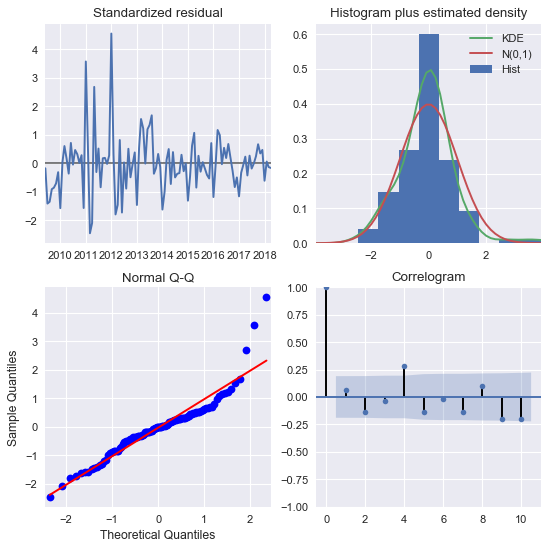

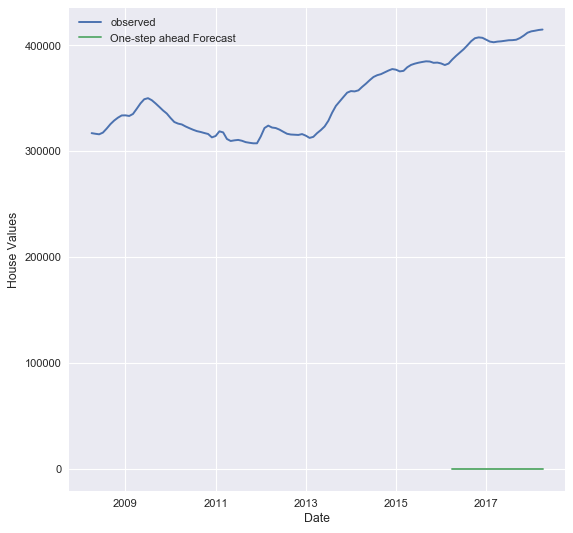

The Mean Squared Error of our forecasts is 163562270774.14
The Root Mean Squared Error of our forecasts is 404428.33
prediction values: <statsmodels.tsa.statespace.mlemodel.PredictionResultsWrapper object at 0x000001ED429AAF28>



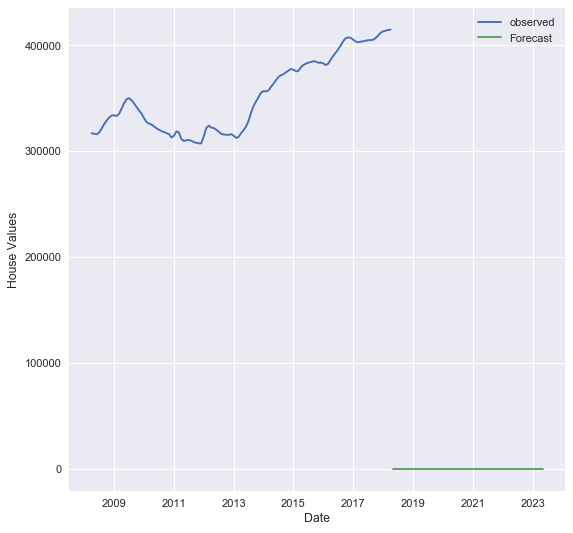

77450


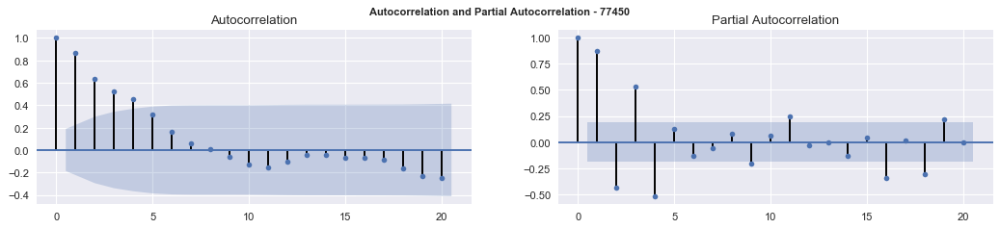

Non-seasonal parameters (p,d,q): (1, 0, 1)
Seasonal parameters and periodicity (P,D,Q,s): (0, 0, 0, 12)
AIC: -1094.3616117710187
BIC: -1086.343125267633
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.7144      0.065     10.946      0.000       0.587       0.842
ma.L1          0.7061      0.086      8.198      0.000       0.537       0.875
sigma2      1.981e-06   2.21e-07      8.973      0.000    1.55e-06    2.41e-06


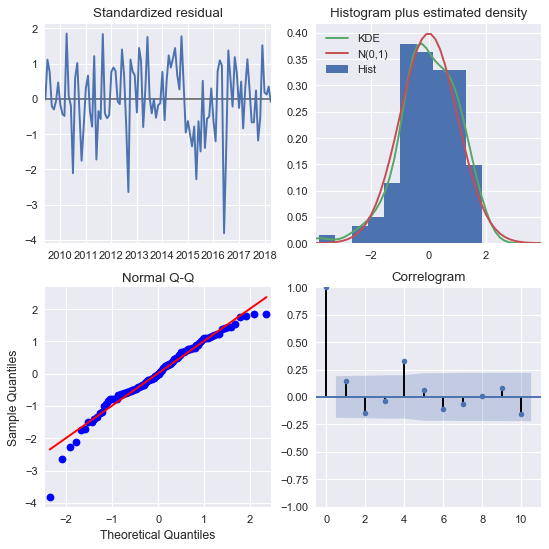

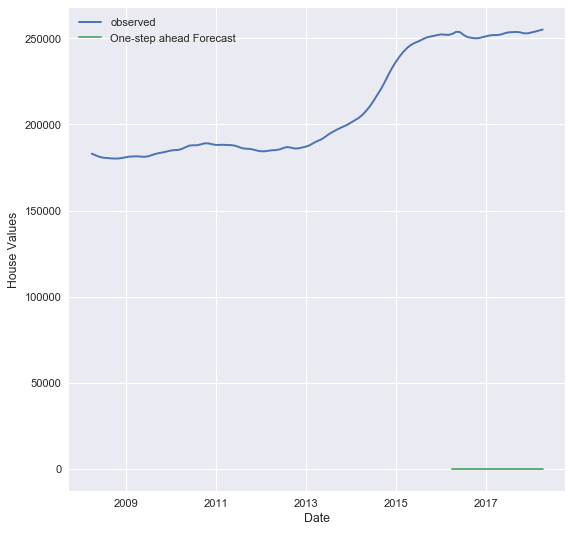

The Mean Squared Error of our forecasts is 63762227677.06
The Root Mean Squared Error of our forecasts is 252511.84
prediction values: <statsmodels.tsa.statespace.mlemodel.PredictionResultsWrapper object at 0x000001ED42646588>



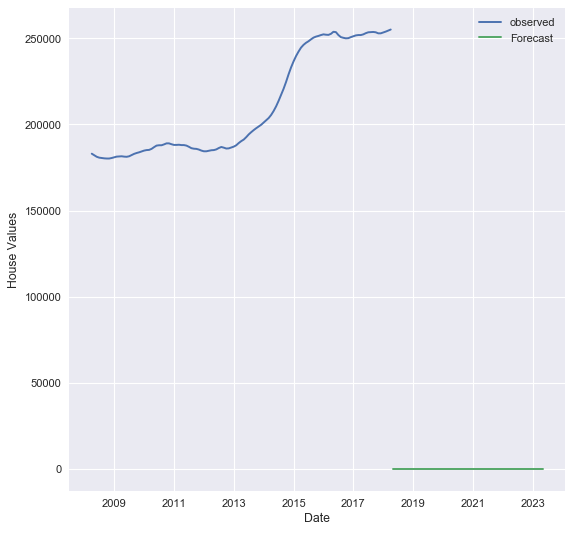

77459


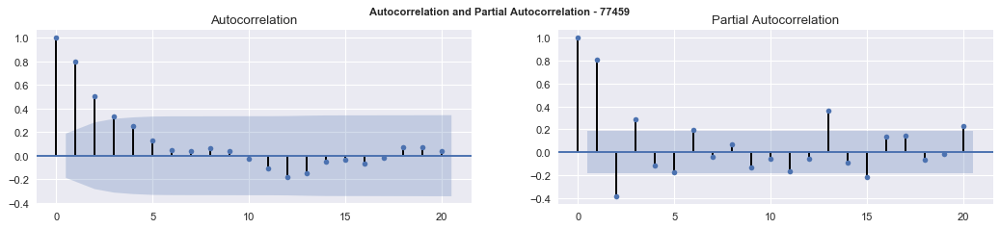

Non-seasonal parameters (p,d,q): (1, 0, 1)
Seasonal parameters and periodicity (P,D,Q,s): (0, 0, 0, 12)
AIC: -1082.1482538960784
BIC: -1074.1297673926927
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.6070      0.093      6.524      0.000       0.425       0.789
ma.L1          0.6440      0.071      9.047      0.000       0.504       0.783
sigma2      2.231e-06   3.32e-07      6.721      0.000    1.58e-06    2.88e-06


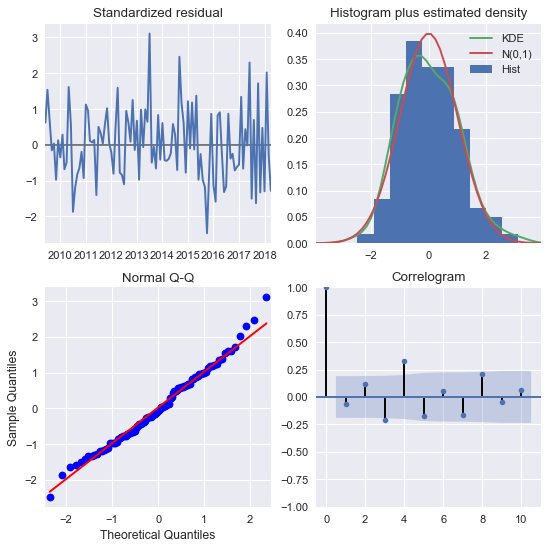

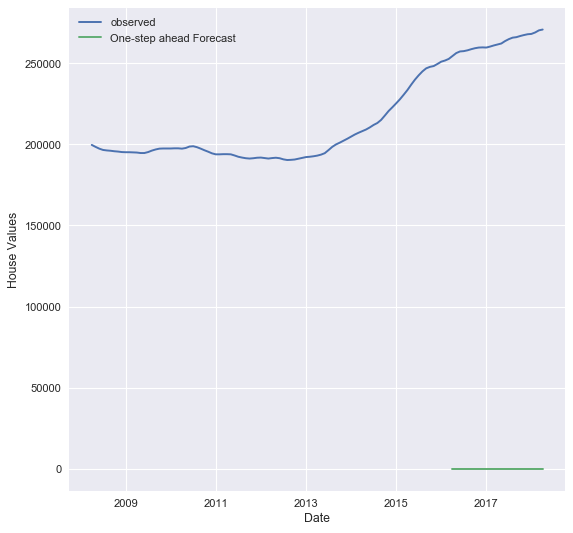

The Mean Squared Error of our forecasts is 68963383424.5
The Root Mean Squared Error of our forecasts is 262608.8
prediction values: <statsmodels.tsa.statespace.mlemodel.PredictionResultsWrapper object at 0x000001ED42B7DB70>



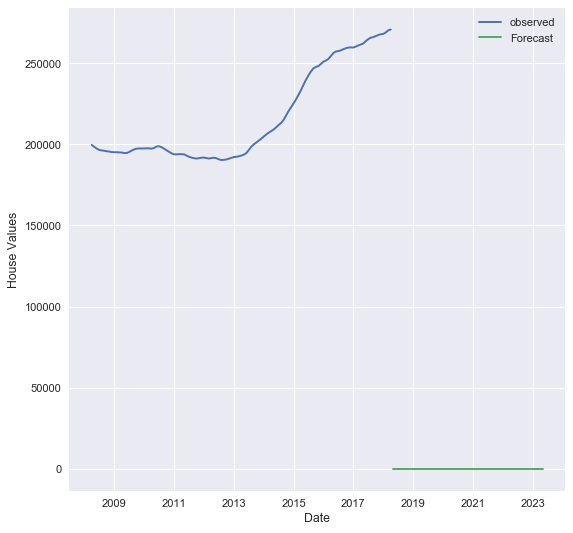

77478


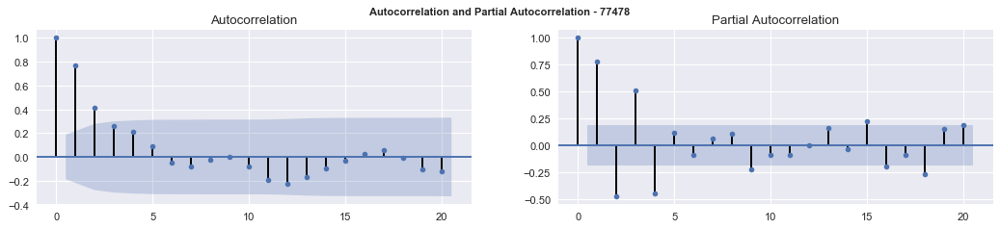

Non-seasonal parameters (p,d,q): (1, 0, 1)
Seasonal parameters and periodicity (P,D,Q,s): (0, 0, 0, 12)
AIC: -1050.3302809731908
BIC: -1042.3117944698051
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.5155      0.082      6.306      0.000       0.355       0.676
ma.L1          0.8497      0.042     20.368      0.000       0.768       0.931
sigma2       2.98e-06   4.12e-07      7.230      0.000    2.17e-06    3.79e-06


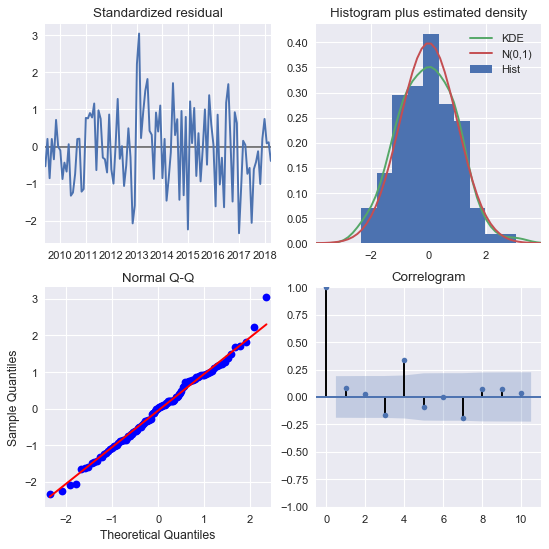

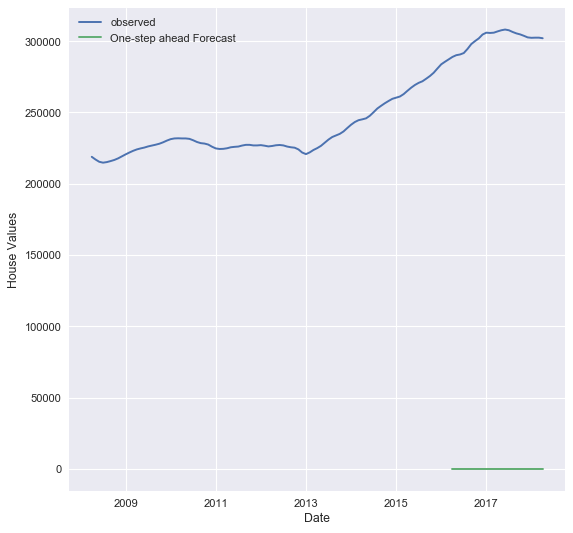

The Mean Squared Error of our forecasts is 91046828478.53
The Root Mean Squared Error of our forecasts is 301739.67
prediction values: <statsmodels.tsa.statespace.mlemodel.PredictionResultsWrapper object at 0x000001ED428D9438>



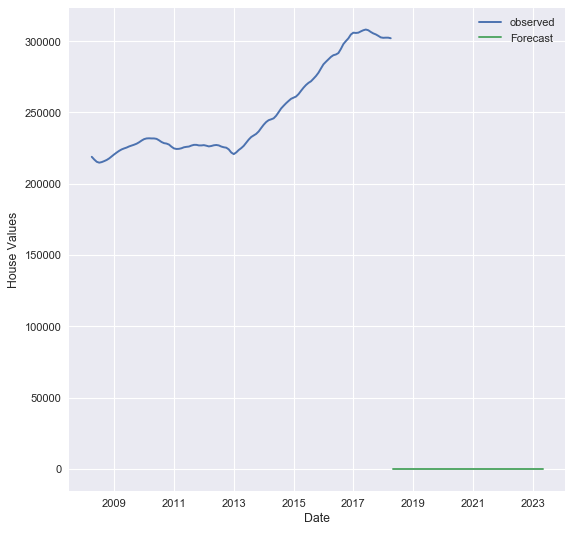

77479


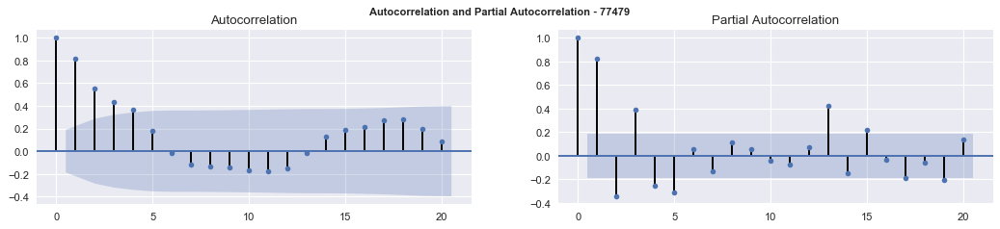

Non-seasonal parameters (p,d,q): (1, 0, 1)
Seasonal parameters and periodicity (P,D,Q,s): (0, 0, 0, 12)
AIC: -1096.034682722346
BIC: -1088.0161962189602
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.6497      0.080      8.140      0.000       0.493       0.806
ma.L1          0.5555      0.078      7.089      0.000       0.402       0.709
sigma2      1.955e-06   2.56e-07      7.638      0.000    1.45e-06    2.46e-06


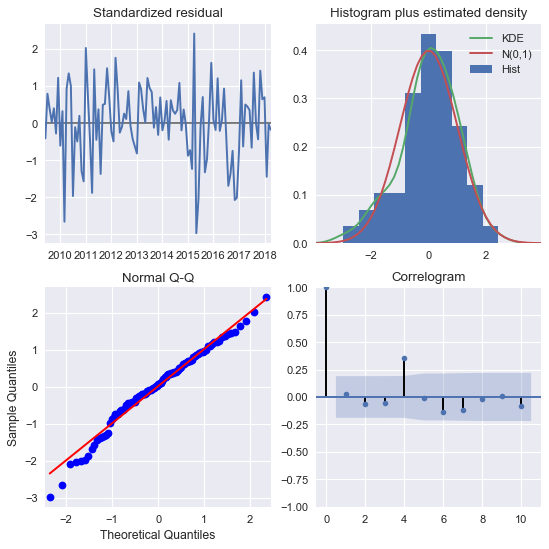

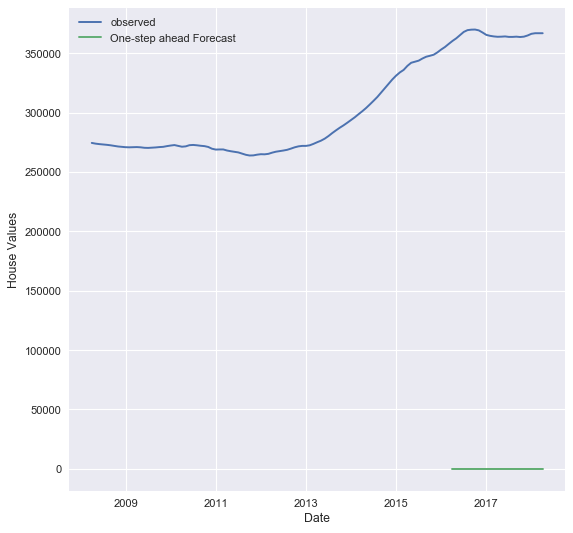

The Mean Squared Error of our forecasts is 133680808475.88
The Root Mean Squared Error of our forecasts is 365623.86
prediction values: <statsmodels.tsa.statespace.mlemodel.PredictionResultsWrapper object at 0x000001ED43969780>



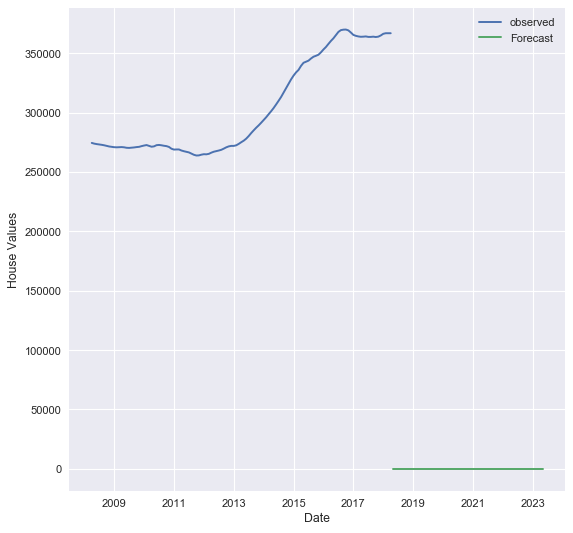

77494


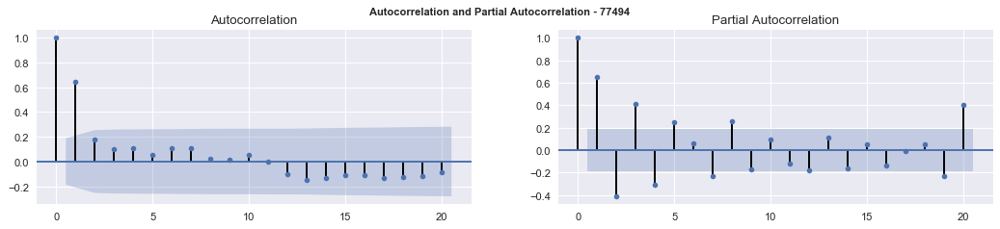

Non-seasonal parameters (p,d,q): (1, 0, 1)
Seasonal parameters and periodicity (P,D,Q,s): (0, 0, 0, 12)
AIC: -985.6366260195033
BIC: -977.6181395161176
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.2518      0.090      2.804      0.005       0.076       0.428
ma.L1          0.8129      0.055     14.726      0.000       0.705       0.921
sigma2      5.469e-06   6.91e-07      7.918      0.000    4.12e-06    6.82e-06


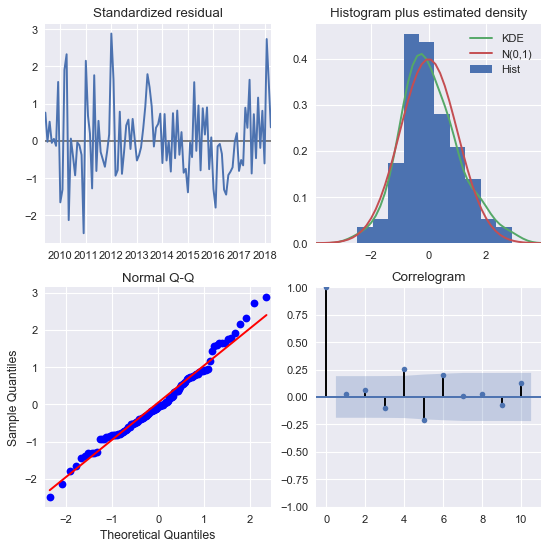

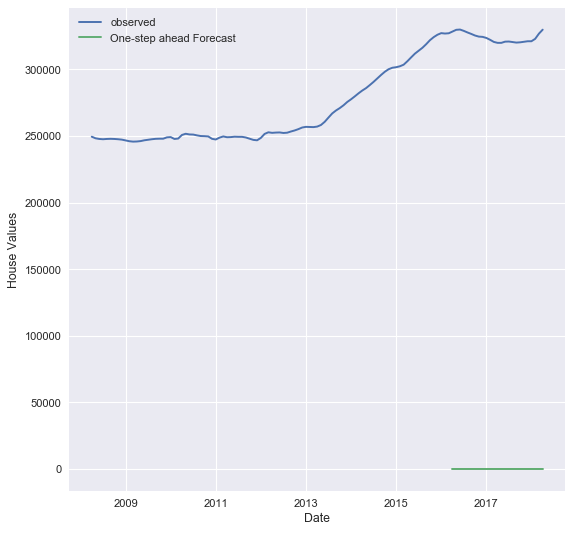

The Mean Squared Error of our forecasts is 104970383679.78
The Root Mean Squared Error of our forecasts is 323991.33
prediction values: <statsmodels.tsa.statespace.mlemodel.PredictionResultsWrapper object at 0x000001ED45091E80>



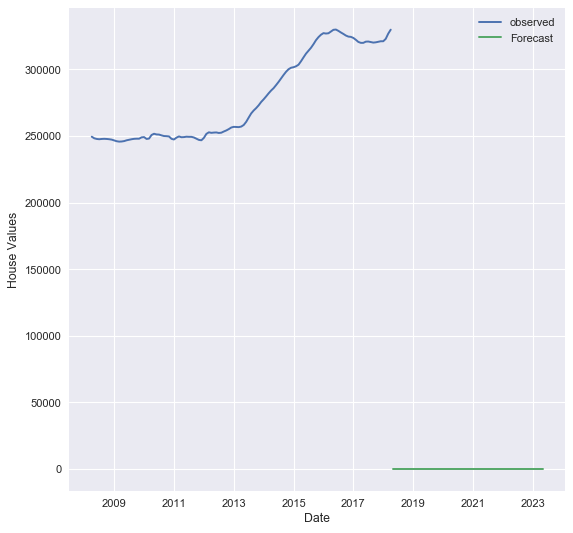

In [47]:
# Run TS Model using Subtract Rolling Mean-Log Transformed Data (.diff(period=1))
TS_Model_RolMean(df_ts)

#### Observations:
> TBD

> __Observation:__ From the plots above, we see that there are autocorrelations for 10 lags and 1 lags for partial correlation, one very strong correlation the previous month. So we will build ARIMA models with varied combinations of orders in (p (for AR), d (for differencing), q (for MA)) from 0 to 1 order for both seasonal and non-seasonal part.

> We interpret this as, historic house prices for about 10 periods (months) seem to be important in determinging the value of houses today. However, once the prior periods are controlled for, by the partial autocorrelation plot, this falls to 2 lagged periods. We would therefore expect 2 lagged dependent variables and/or 2 lagged residuals to be necessary in our model.

> __Observation:__
The purpose here to ensure that residuals remain uncorrelated, normally distributed having zero mean. In the absence of these assumptions, we can not move forward and need further tweaking of the model.
Let's check for these assumptions from diagnostics plots.
- In the top right plot, we see that the red KDE line follows closely with the N(0,1) line (where N(0,1)) is the standard notation for a normal distribution with mean 0 and standard deviation of 1). This is a good indication that the residuals are normally distributed.
- The qq-plot on the bottom left shows that the ordered distribution of residuals (blue dots) follows the linear trend of the samples taken from a standard normal distribution with N(0, 1). Again, this is a strong indication that the residuals are normally distributed.
- The residuals over time (top left plot) don't display any obvious seasonality and appear to be white noise. This is confirmed by the autocorrelation (i.e. correlogram) plot on the bottom right, which shows that the time series residuals have low correlation with lagged versions of itself.

> These observations lead us to conclude that our model produces has no correlations and provides a satisfactory fit to help forecast future values.

# Validating the Model

#### One-step Ahead Forecasting

In order to validate the model, we start by comparing predicted values to real values of the time series, which will help us understand the accuracy of our forecasts.

The get_prediction() and conf_int() attributes allow us to obtain the values and associated confidence intervals for forecasts of the time series.

Get the predictions from 1st January 1998 till 2002 ( end of time-series)

Get the confidence intervals for all predictions.

For get_predictions(), set the dynamic parameter to False to ensures that we produce one-step ahead forecasts, meaning that forecasts at each point are generated using the full history up to that point.

# Interpreting Results

# Recommendations

# Next Steps

> The Next Step:
If more time and resources were available we would recommend investigating other economical factors, and not relying solely on historical trends in price Areas to investigate would be local economies, qualities of schools, and economic trends in the housing market such as resell rates

# Blog 

## Converting Transformed Data to Original Dataset

#### Original Dataset

In [48]:
ts_77478.tail()

time
2017-12-01    302700.0
2018-01-01    302400.0
2018-02-01    302500.0
2018-03-01    302500.0
2018-04-01    302100.0
Name: value, dtype: float64

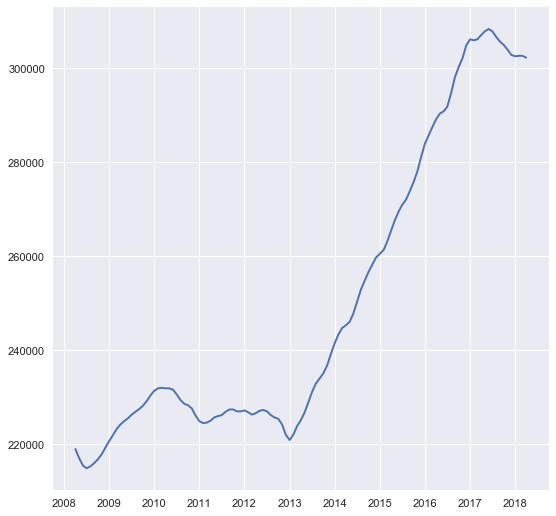

In [49]:
plt.plot(ts_77478)

#### Convert Log back to Original Dataset

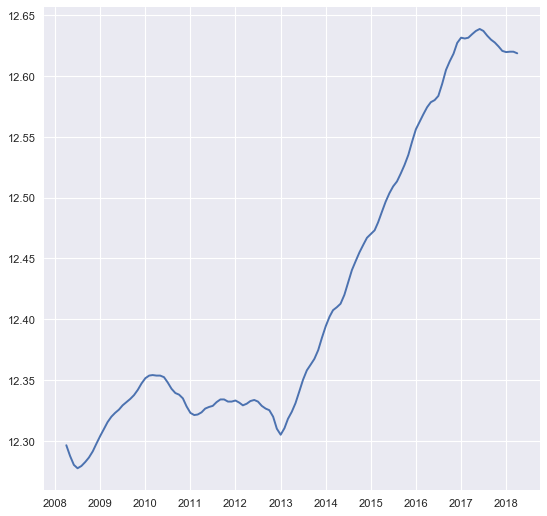

In [50]:
plt.plot(np.log(ts_77478))

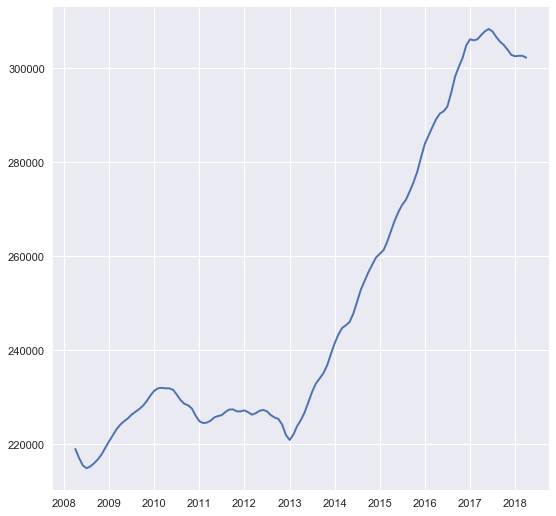

In [51]:
LogDataexp = np.exp(np.log(ts_77478))
plt.plot(LogDataexp)

In [52]:
LogDataexp.head(24)

time
2008-04-01    218900.0
2008-05-01    217000.0
2008-06-01    215400.0
2008-07-01    214800.0
2008-08-01    215200.0
2008-09-01    215900.0
2008-10-01    216700.0
2008-11-01    217800.0
2008-12-01    219200.0
2009-01-01    220600.0
2009-02-01    221900.0
2009-03-01    223100.0
2009-04-01    224100.0
2009-05-01    224800.0
2009-06-01    225400.0
2009-07-01    226200.0
2009-08-01    226800.0
2009-09-01    227400.0
2009-10-01    228100.0
2009-11-01    229100.0
2009-12-01    230300.0
2010-01-01    231300.0
2010-02-01    231800.0
2010-03-01    231900.0
Name: value, dtype: float64

#### Convert Log + Diff(1) back to Original Dataset

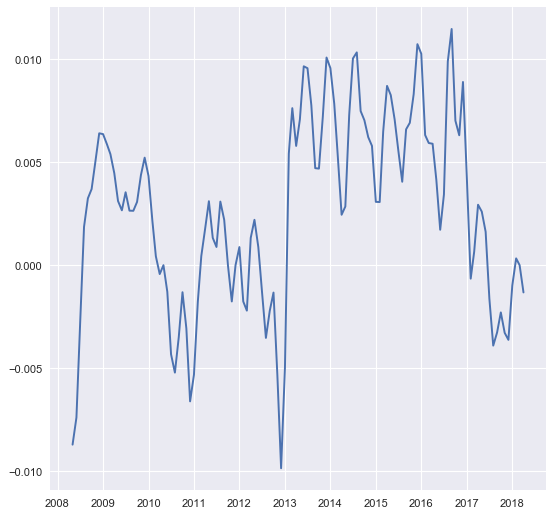

In [53]:
logData = np.log(ts_77478)
logDiff = logData.diff(1)
plt.plot(logDiff)

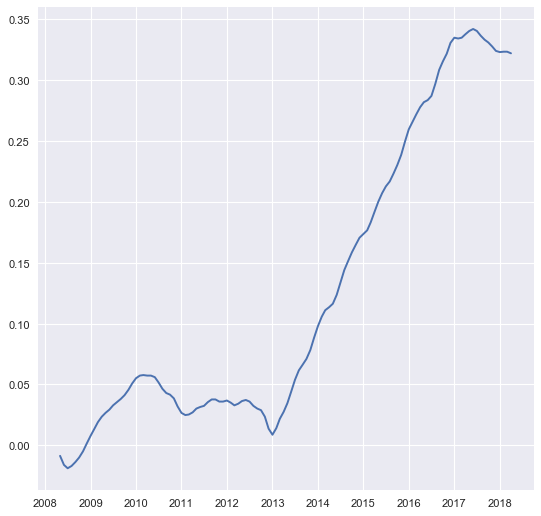

In [54]:
logDiffcumsum = logDiff.cumsum()
plt.plot(logDiffcumsum)

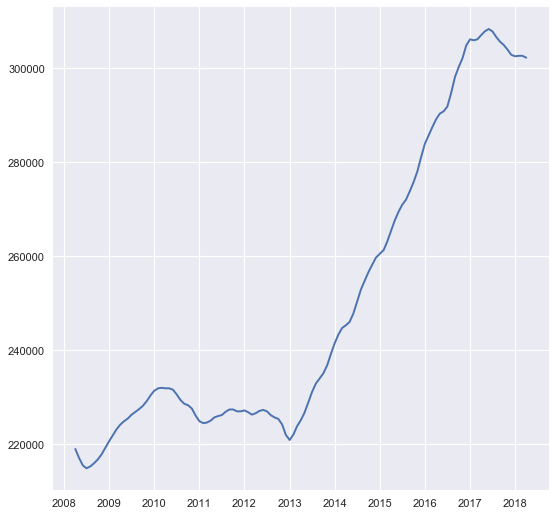

In [55]:
logAftercumsum = np.exp(logData).add(logDiffcumsum, fill_value=0)
plt.plot(logAftercumsum)

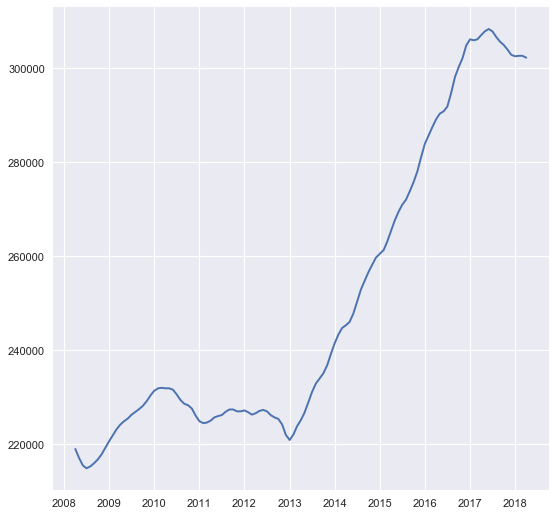

In [56]:
OrginalData = logAftercumsum
plt.plot(OrginalData)

In [57]:
OrginalData.head(36)

time
2008-04-01    218900.000000
2008-05-01    216999.991282
2008-06-01    215399.983882
2008-07-01    214799.981092
2008-08-01    215199.982953
2008-09-01    215899.986200
2008-10-01    216699.989899
2008-11-01    217799.994962
2008-12-01    219200.001370
2009-01-01    220600.007736
2009-02-01    221900.013612
2009-03-01    223100.019005
2009-04-01    224100.023477
2009-05-01    224800.026596
2009-06-01    225400.029262
2009-07-01    226200.032805
2009-08-01    226800.035454
2009-09-01    227400.038096
2009-10-01    228100.041169
2009-11-01    229100.045544
2009-12-01    230300.050768
2010-01-01    231300.055101
2010-02-01    231800.057260
2010-03-01    231900.057691
2010-04-01    231800.057260
2010-05-01    231800.057260
2010-06-01    231500.055965
2010-07-01    230500.051636
2010-08-01    229300.046416
2010-09-01    228500.042921
2010-10-01    228200.041607
2010-11-01    227500.038535
2010-12-01    226000.031920
2011-01-01    224800.026596
2011-02-01    224400.024815
2011-03-01    2

#### Convert SRM + Log + Diff (1) back to Original Dataset

In [58]:
log_data = np.log(ts_77478)
rolmean = log_data.rolling(window = 12).mean()
log_data_minus_rolmean = log_data - rolmean
diff_log_data_minus_rolmean = log_data_minus_rolmean.diff(periods=1)

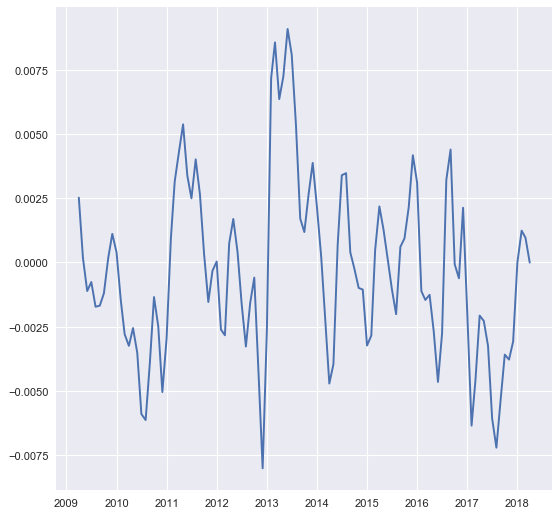

In [59]:
plt.plot(diff_log_data_minus_rolmean)

In [60]:
diff_log_data_minus_rolmean.head(24)

time
2008-04-01         NaN
2008-05-01         NaN
2008-06-01         NaN
2008-07-01         NaN
2008-08-01         NaN
2008-09-01         NaN
2008-10-01         NaN
2008-11-01         NaN
2008-12-01         NaN
2009-01-01         NaN
2009-02-01         NaN
2009-03-01         NaN
2009-04-01    0.002516
2009-05-01    0.000176
2009-06-01   -0.001116
2009-07-01   -0.000766
2009-08-01   -0.001726
2009-09-01   -0.001683
2009-10-01   -0.001199
2009-11-01    0.000159
2009-12-01    0.001108
2010-01-01    0.000386
2010-02-01   -0.001478
2010-03-01   -0.002793
Name: value, dtype: float64

In [61]:
rolmeancumsum = diff_log_data_minus_rolmean.cumsum()
rolmeanlogAftercumsum = np.exp(logData).add(rolmeancumsum, fill_value=0)
rolmeanlogAftercumsum.tail(24)

time
2016-05-01    290200.014292
2016-06-01    290700.009641
2016-07-01    291700.006880
2016-08-01    294600.010091
2016-09-01    298000.014477
2016-10-01    300100.014402
2016-11-01    302000.013783
2016-12-01    304700.015907
2017-01-01    306000.013888
2017-02-01    305800.007539
2017-03-01    306000.002938
2017-04-01    306900.000867
2017-05-01    307699.998591
2017-06-01    308199.995343
2017-07-01    307699.989269
2017-08-01    306499.982062
2017-09-01    305499.976722
2017-10-01    304799.973133
2017-11-01    303799.969352
2017-12-01    302699.966273
2018-01-01    302399.966268
2018-02-01    302499.967503
2018-03-01    302499.968461
2018-04-01    302099.968452
Name: value, dtype: float64

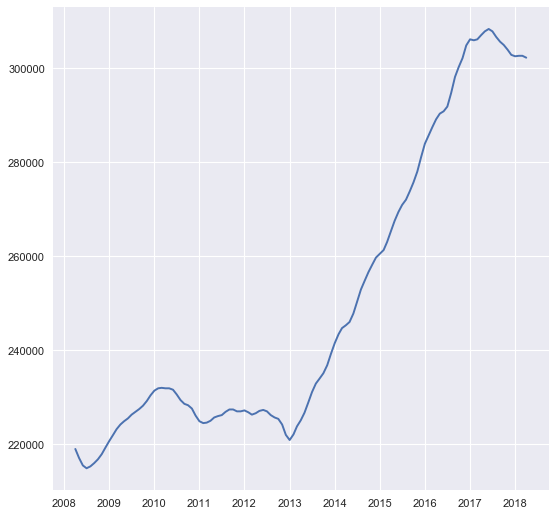

In [62]:
plt.plot(rolmeanlogAftercumsum)